# Description

The Tanzanian tourism sector plays a significant role in the Tanzanian economy, contributing about 17% to the country’s GDP and 25% of all foreign exchange revenues. The sector, which provides direct employment for more than 600,000 people and up to 2 million people indirectly, generated approximately $2.4 billion in 2018 according to government statistics. Tanzania received a record 1.1 million international visitor arrivals in 2014, mostly from Europe, the US and Africa.

Tanzania is the only country in the world which has allocated more than 25% of its total area for wildlife, national parks, and protected areas.There are 16 national parks in Tanzania, 28 game reserves, 44 game-controlled areas, two marine parks and one conservation area.

Tanzania’s tourist attractions include the Serengeti plains, which hosts the largest terrestrial mammal migration in the world; the Ngorongoro Crater, the world’s largest intact volcanic caldera and home to the highest density of big game in Africa; Kilimanjaro, Africa’s highest mountain; and the Mafia Island marine park; among many others. The scenery, topography, rich culture and very friendly people provide for excellent cultural tourism, beach holidays, honeymooning, game hunting, historical and archaeological ventures – and certainly the best wildlife photography safaris in the world.

The objective of this hackathon is to develop a machine learning model to predict what a tourist will spend when visiting Tanzania.The model can be used by different tour operators and the Tanzania Tourism Board to automatically help tourists across the world estimate their expenditure before visiting Tanzania.

In [134]:
# import matplotlib.pyplot as plt
import matplotlib as mpl

import optuna
import warnings

from glob import glob #library that helps us search for files
import scipy
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
import random

import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from category_encoders import OneHotEncoder,TargetEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import KFold,StratifiedShuffleSplit
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet 

from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils.validation import check_is_fitted
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer, PowerTransformer,LabelEncoder
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor, ExtraTreesRegressor
import xgboost as xgb
from sklearn.feature_selection import RFE
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge
from scipy.special import inv_boxcox
from sklearn.linear_model import QuantileRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
import sklearn.svm
from sklearn.neural_network import MLPRegressor
warnings.simplefilter(action="ignore")
pd.pandas.set_option('display.max_rows',None)
pd.pandas.set_option('display.max_columns',None)
from sklearn.feature_selection import VarianceThreshold
#pd.options.display.float_format = '{:20,.2f}'.format


In [135]:
df = pd.read_csv('/Users/USER/Documents/DATASETS/Tanzania_tourism/Train.csv')
df.head()

,ID,country,age_group,travel_with,total_female,total_male,purpose,main_activity,info_source,tour_arrangement,package_transport_int,package_accomodation,package_food,package_transport_tz,package_sightseeing,package_guided_tour,package_insurance,night_mainland,night_zanzibar,payment_mode,first_trip_tz,most_impressing,total_cost
0,tour_0,SWIZERLAND,45-64,Friends/Relatives,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Friends, relatives",Independent,No,No,No,No,No,No,No,13.0,0.0,Cash,No,Friendly People,674602.5
1,tour_10,UNITED KINGDOM,25-44,NaN,1.0,0.0,Leisure and Holidays,Cultural tourism,others,Independent,No,No,No,No,No,No,No,14.0,7.0,Cash,Yes,"Wonderful Country, Landscape, Nature",3214906.5
2,tour_1000,UNITED KINGDOM,25-44,Alone,0.0,1.0,Visiting Friends and Relatives,Cultural tourism,"Friends, relatives",Independent,No,No,No,No,No,No,No,1.0,31.0,Cash,No,Excellent Experience,3315000.0
3,tour_1002,UNITED KINGDOM,25-44,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,No,Yes,Yes,Yes,Yes,Yes,No,11.0,0.0,Cash,Yes,Friendly People,7790250.0
4,tour_1004,CHINA,1-24,NaN,1.0,0.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Independent,No,No,No,No,No,No,No,7.0,4.0,Cash,Yes,No comments,1657500.0


In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4809 entries, 0 to 4808
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     4809 non-null   object 
 1   country                4809 non-null   object 
 2   age_group              4809 non-null   object 
 3   travel_with            3695 non-null   object 
 4   total_female           4806 non-null   float64
 5   total_male             4804 non-null   float64
 6   purpose                4809 non-null   object 
 7   main_activity          4809 non-null   object 
 8   info_source            4809 non-null   object 
 9   tour_arrangement       4809 non-null   object 
 10  package_transport_int  4809 non-null   object 
 11  package_accomodation   4809 non-null   object 
 12  package_food           4809 non-null   object 
 13  package_transport_tz   4809 non-null   object 
 14  package_sightseeing    4809 non-null   object 
 15  pack

In [137]:
df.shape

(4809, 23)

# SPLITTING

In [138]:
df['country'] = df['country'].apply(lambda x: x if df['country'].value_counts()[x] > 4 else 'Others')
# Create a new column that groups low-observation countries into a single category to ensure efficient sampling


In [139]:
# Initialize the StratifiedShuffleSplit object
split = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=42)

# Generate the train and test indices using the stratified sampling method
for train_index, test_index in split.split(df, df['country']):
    train_ = df.iloc[train_index]
    test = df.iloc[test_index]

In [140]:
for i in train_.select_dtypes('O').columns:
    print(i,train_[i].nunique())
    print('')

ID 4087

country 53

age_group 4

travel_with 5

purpose 7

main_activity 9

info_source 8

tour_arrangement 2

package_transport_int 2

package_accomodation 2

package_food 2

package_transport_tz 2

package_sightseeing 2

package_guided_tour 2

package_insurance 2

payment_mode 4

first_trip_tz 2

most_impressing 7



In [141]:
for i in test.select_dtypes('O').columns:
    print(i,test[i].nunique())
    print('')

ID 722

country 53

age_group 4

travel_with 5

purpose 7

main_activity 9

info_source 8

tour_arrangement 2

package_transport_int 2

package_accomodation 2

package_food 2

package_transport_tz 2

package_sightseeing 2

package_guided_tour 2

package_insurance 2

payment_mode 4

first_trip_tz 2

most_impressing 7



In [142]:
# Generate the train and val indices using the stratified sampling method
for train_index, val_index in split.split(train_, train_['country']):
    train = train_.iloc[train_index]
    validation = train_.iloc[val_index]

In [143]:
for i in validation.select_dtypes('O').columns:
    print(i,validation[i].nunique())
    print('')

ID 614

country 53

age_group 4

travel_with 5

purpose 7

main_activity 9

info_source 8

tour_arrangement 2

package_transport_int 2

package_accomodation 2

package_food 2

package_transport_tz 2

package_sightseeing 2

package_guided_tour 2

package_insurance 2

payment_mode 3

first_trip_tz 2

most_impressing 7



In [144]:
for i in train.select_dtypes('O').columns:
    print(i,train[i].nunique())
    print('')

ID 3473

country 53

age_group 4

travel_with 5

purpose 7

main_activity 9

info_source 8

tour_arrangement 2

package_transport_int 2

package_accomodation 2

package_food 2

package_transport_tz 2

package_sightseeing 2

package_guided_tour 2

package_insurance 2

payment_mode 4

first_trip_tz 2

most_impressing 7



In [145]:
train.shape, test.shape, validation.shape

((3473, 23), (722, 23), (614, 23))

# EXPLORATORY DATA ANALYSIS

In [146]:
df = train.copy()

In [147]:
df[df.duplicated()]

,ID,country,age_group,travel_with,total_female,total_male,purpose,main_activity,info_source,tour_arrangement,package_transport_int,package_accomodation,package_food,package_transport_tz,package_sightseeing,package_guided_tour,package_insurance,night_mainland,night_zanzibar,payment_mode,first_trip_tz,most_impressing,total_cost


In [148]:
df.describe()

,total_female,total_male,night_mainland,night_zanzibar,total_cost
count,3470.000000,3469.000000,3473.000000,3473.000000,3.473000e+03
mean,0.939769,1.042087,8.493234,2.342355,8.247601e+06
std,1.400738,1.249435,10.336840,4.416400,1.263754e+07
min,0.000000,0.000000,0.000000,0.000000,4.900000e+04
25%,0.000000,1.000000,3.000000,0.000000,7.458750e+05
50%,1.000000,1.000000,6.000000,0.000000,3.315000e+06
75%,1.000000,1.000000,11.000000,4.000000,9.945000e+06
max,49.000000,44.000000,145.000000,61.000000,9.945000e+07


# EMPTY STRINGS

In [149]:
#checking for empty strings in column names
[i for i in df.columns if i.startswith(' ') or i.endswith(' ')]

[]

In [150]:
for i in df.columns:
    print(df[df[i] == ' '])

Empty DataFrame
Columns: [ID, country, age_group, travel_with, total_female, total_male, purpose, main_activity, info_source, tour_arrangement, package_transport_int, package_accomodation, package_food, package_transport_tz, package_sightseeing, package_guided_tour, package_insurance, night_mainland, night_zanzibar, payment_mode, first_trip_tz, most_impressing, total_cost]
Index: []
Empty DataFrame
Columns: [ID, country, age_group, travel_with, total_female, total_male, purpose, main_activity, info_source, tour_arrangement, package_transport_int, package_accomodation, package_food, package_transport_tz, package_sightseeing, package_guided_tour, package_insurance, night_mainland, night_zanzibar, payment_mode, first_trip_tz, most_impressing, total_cost]
Index: []
Empty DataFrame
Columns: [ID, country, age_group, travel_with, total_female, total_male, purpose, main_activity, info_source, tour_arrangement, package_transport_int, package_accomodation, package_food, package_transport_tz, pac

# CARDINALITY AND UNIVARIATE ANALYSIS OF CATEGORICAL FEATURES

In [151]:
#cardinality
for i in df.columns:
    print(i.upper())
    print(f'Number of unique values in {i}:',df[i].nunique())
    print(f'Unique values in {i}:', df[i].unique())
    print('___________________________________________________________________________________________________________')

ID
Number of unique values in ID: 3473
Unique values in ID: ['tour_5169' 'tour_6201' 'tour_852' ... 'tour_1070' 'tour_4736'
 'tour_5484']
___________________________________________________________________________________________________________
COUNTRY
Number of unique values in country: 53
Unique values in country: ['ZAMBIA' 'ZIMBABWE' 'UNITED STATES OF AMERICA' 'ITALY' 'JAPAN'
 'SWIZERLAND' 'SOUTH AFRICA' 'FRANCE' 'KENYA' 'CHINA' 'GERMANY' 'Others'
 'SPAIN' 'SWEDEN' 'MALAYSIA' 'UNITED KINGDOM' 'AUSTRALIA' 'NETHERLANDS'
 'BURUNDI' 'BELGIUM' 'DRC' 'AUSTRIA' 'CANADA' 'NORWAY' 'UGANDA' 'DENMARK'
 'ISRAEL' 'SINGAPORE' 'INDIA' 'IRELAND' 'UNITED ARAB EMIRATES' 'UAE'
 'RWANDA' 'RUSSIA' 'NEW ZEALAND' 'TAIWAN' 'KOREA' 'MALAWI' 'POLAND'
 'QATAR' 'BRAZIL' 'EGYPT' 'FINLAND' 'GREECE' 'TURKEY' 'MOZAMBIQUE' 'CONGO'
 'CZECH REPUBLIC' 'OMAN' 'PAKISTAN' 'PORTUGAL' 'SERBIA' 'ETHIOPIA']
___________________________________________________________________________________________________________
AGE_GROUP


In [152]:
for i in df.iloc[:,1:].columns:
    print(i.upper())
    print(f'Frequency of cardinality in {i}:', print(df[i].value_counts(normalize=True)))
    print('_____________________________________________________________________________________________________')

COUNTRY
UNITED STATES OF AMERICA    0.144544
UNITED KINGDOM              0.110855
ITALY                       0.081774
FRANCE                      0.058163
ZIMBABWE                    0.057011
KENYA                       0.048949
SOUTH AFRICA                0.048949
GERMANY                     0.046358
ZAMBIA                      0.039735
AUSTRALIA                   0.038583
SPAIN                       0.034264
UGANDA                      0.033113
CANADA                      0.023611
NETHERLANDS                 0.023323
Others                      0.020731
INDIA                       0.018140
CHINA                       0.013533
SWIZERLAND                  0.013245
BURUNDI                     0.013245
JAPAN                       0.010942
BELGIUM                     0.010366
DENMARK                     0.008638
RWANDA                      0.008350
SWEDEN                      0.007486
OMAN                        0.007198
UAE                         0.006910
IRELAND                     0.

1.657500e+06    0.033113
3.315000e+06    0.023611
8.287500e+05    0.018716
3.315000e+05    0.018140
4.972500e+05    0.016988
4.972500e+06    0.014397
6.630000e+05    0.012669
2.486250e+06    0.012669
9.945000e+05    0.011229
6.630000e+06    0.010366
1.657500e+05    0.010078
8.287500e+06    0.009502
1.160250e+06    0.008638
4.143750e+06    0.007774
2.000000e+05    0.006910
1.000000e+05    0.006623
9.945000e+06    0.005759
1.989000e+06    0.005759
5.000000e+05    0.005759
3.978000e+06    0.005471
5.801250e+06    0.005471
2.269330e+06    0.005183
1.000000e+06    0.004895
1.657500e+07    0.004895
1.491750e+06    0.004607
4.000000e+05    0.004607
1.160250e+07    0.004607
3.000000e+05    0.004319
4.309500e+06    0.004319
2.486250e+05    0.004031
1.077375e+07    0.004031
8.287500e+04    0.004031
6.807990e+06    0.004031
4.538660e+06    0.004031
6.961500e+06    0.003743
1.823250e+06    0.003743
7.458750e+06    0.003743
2.652000e+06    0.003743
5.000000e+04    0.003743
1.011075e+07    0.003743


 - Most visitors were from USA, UK, and Italy.
 - 52% of visitors were in age group 25-44, 29.3% were in age group 45-64, 12.4% were in age group 1-24, and 6.1% were in age group 65+.
 - 34.4% of visitors traveled alone, 26.8% traveled with their spouse, 24.4% traveled with their Friends or relatives, 9.7% travled with their spouse and children, and 4.4% traveled with their children.
 - 58.4% of visitors traveled for leisure and holidays, 14% traveled for business, 13.2% traveled to visit friends/relatives, 6.7% traveled for meetings and conference, 3% trvaled for volunteering, 1.7% traveled for scientific/academic purposes, and 2% traveled for other purposes.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

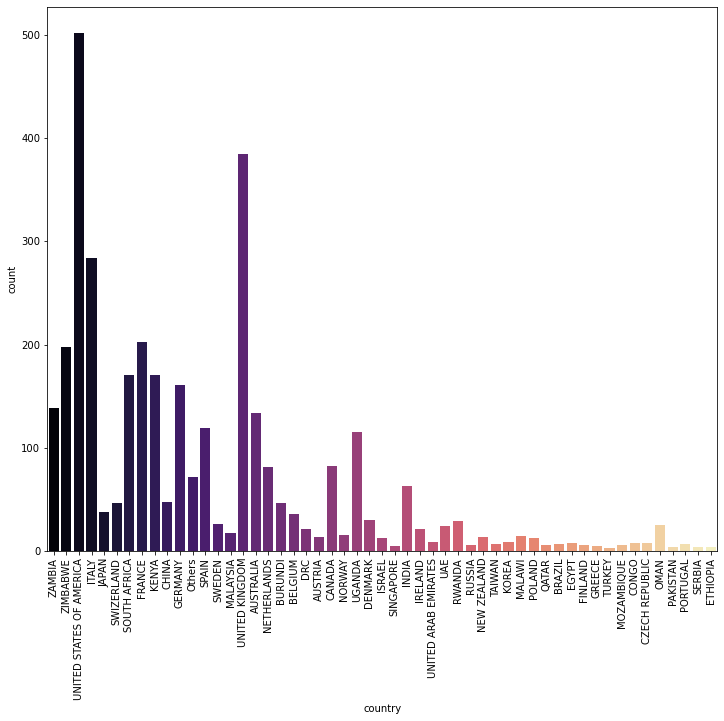

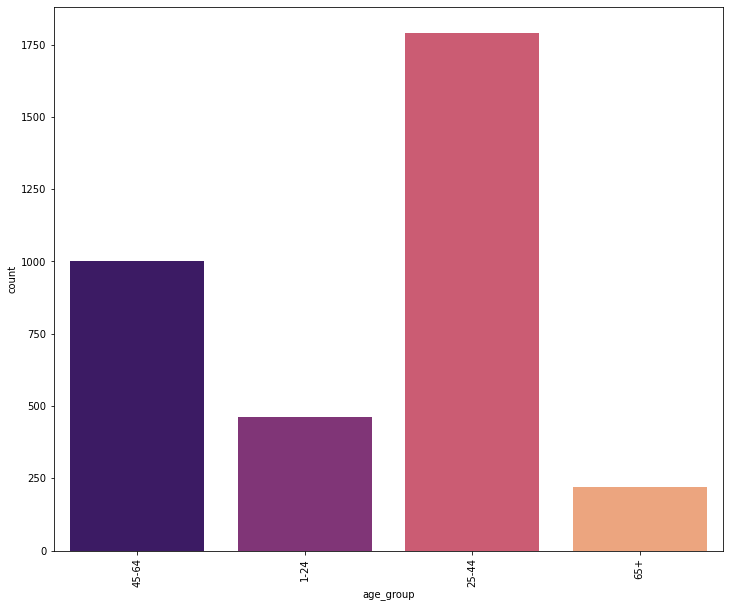

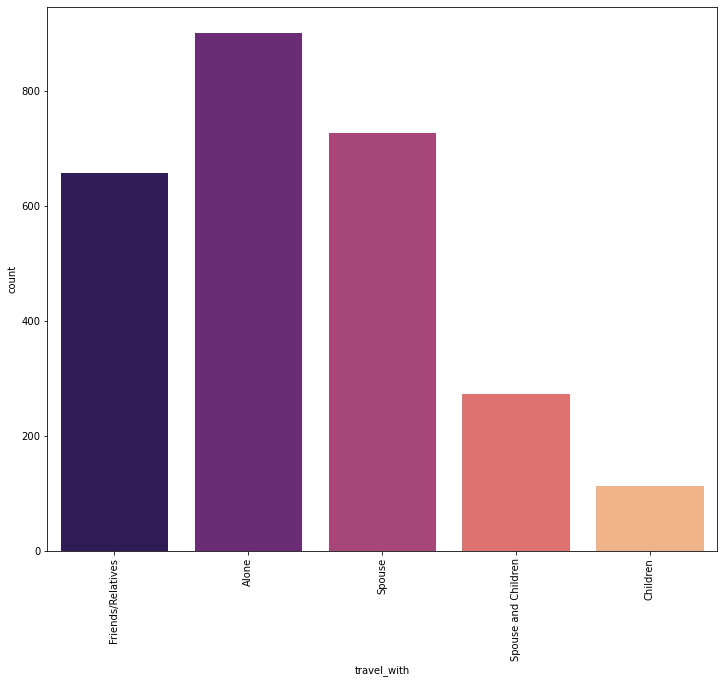

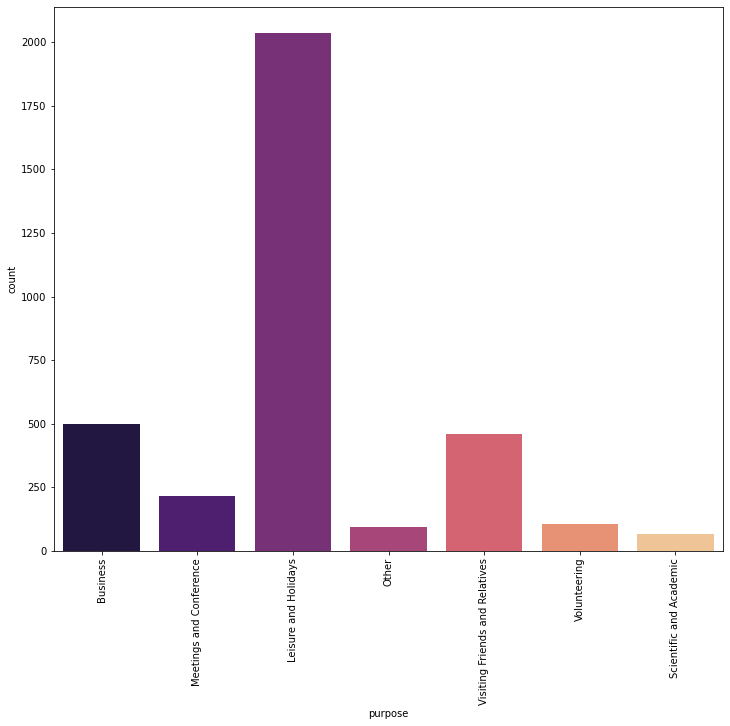

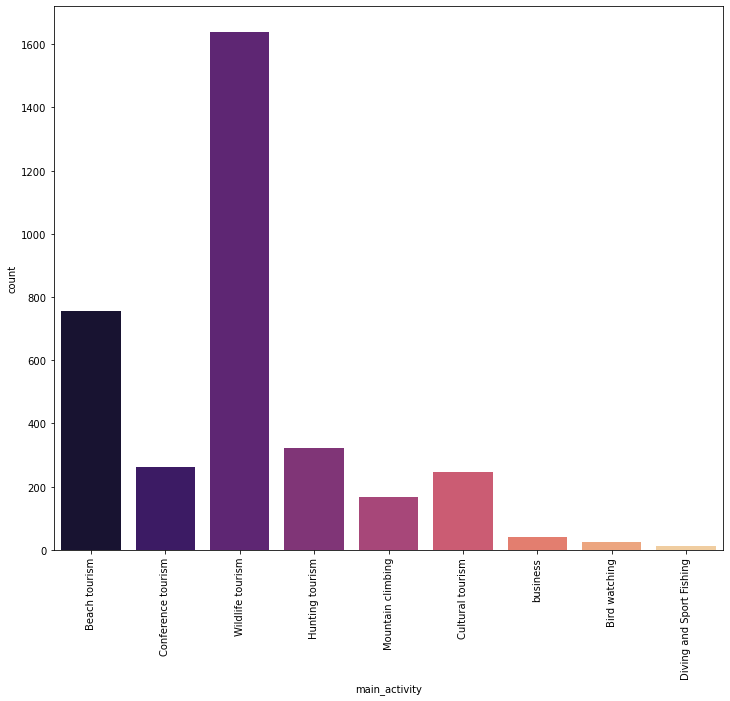

...

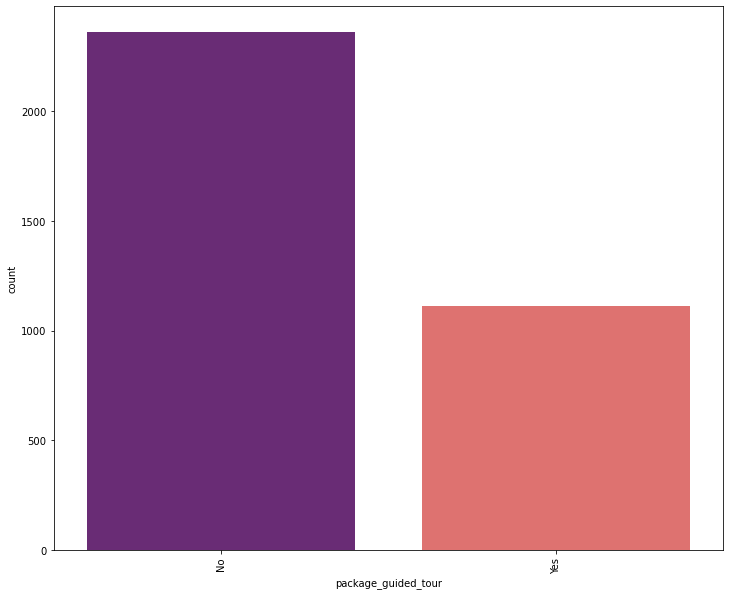

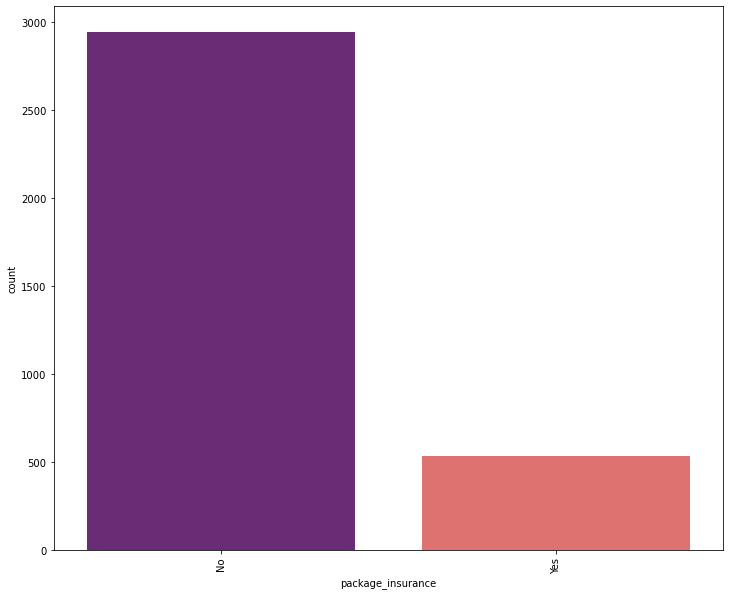

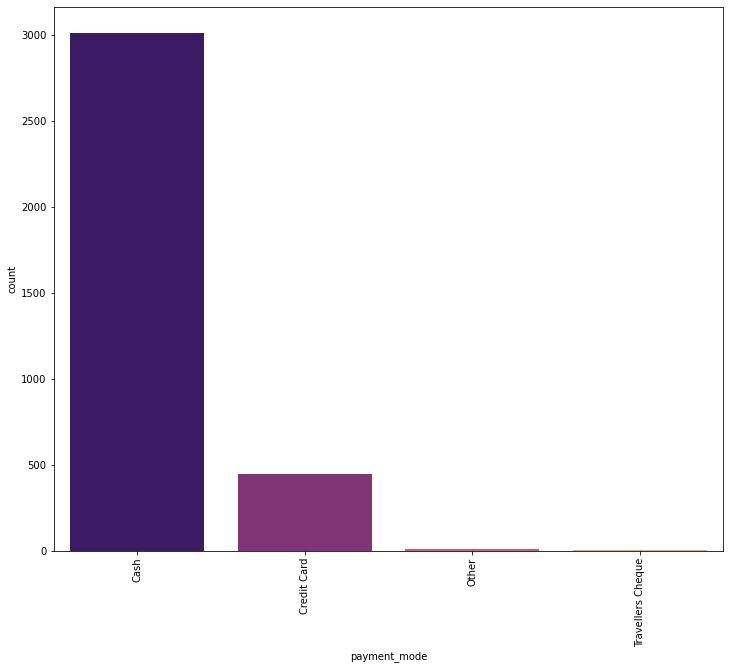

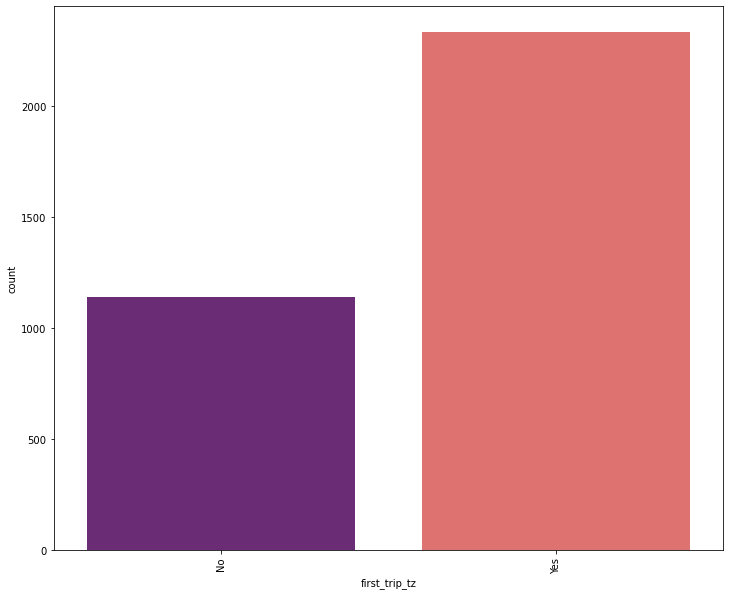

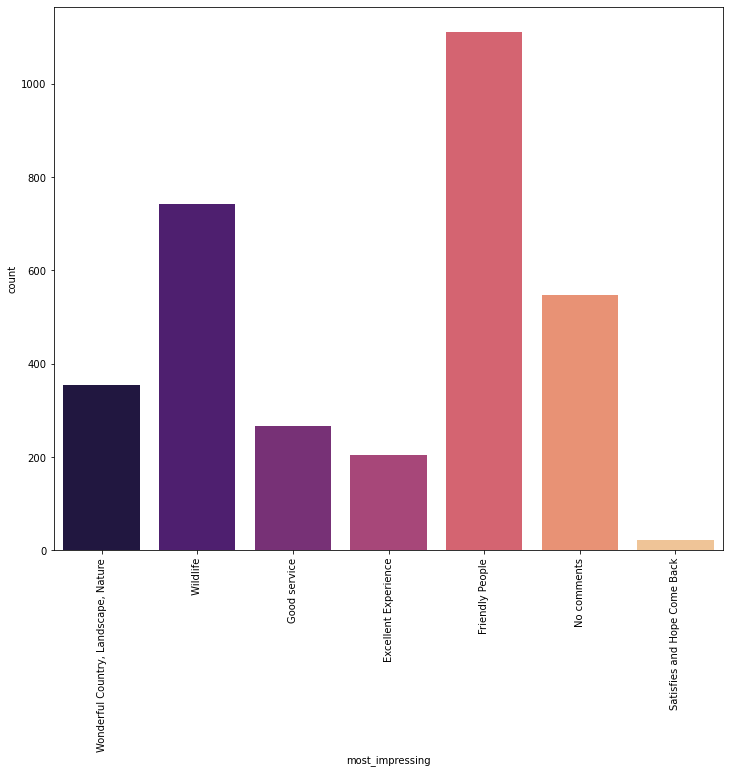

In [153]:
for i in df.select_dtypes('O').iloc[:,1:].columns:
    plt.figure(figsize=(12,10))
    
    sns.countplot(data=df, x=i, palette = 'magma')
    plt.xticks(rotation=90)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

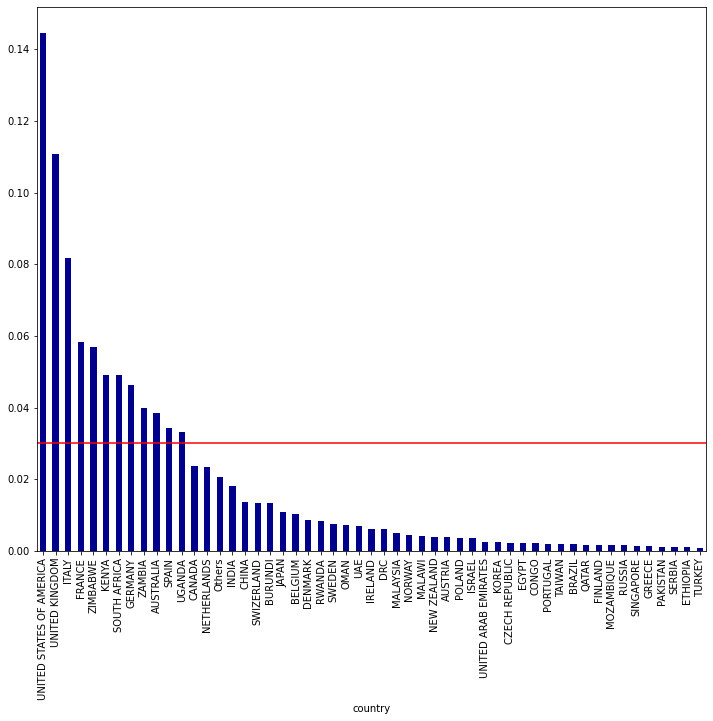

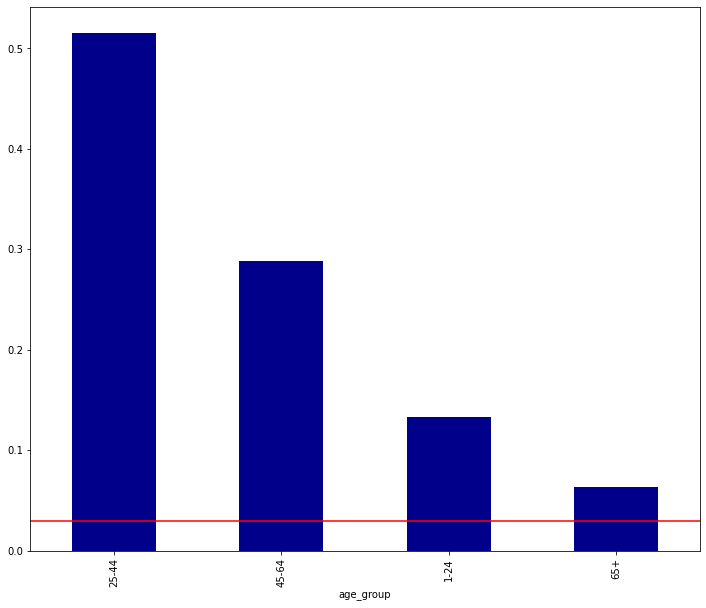

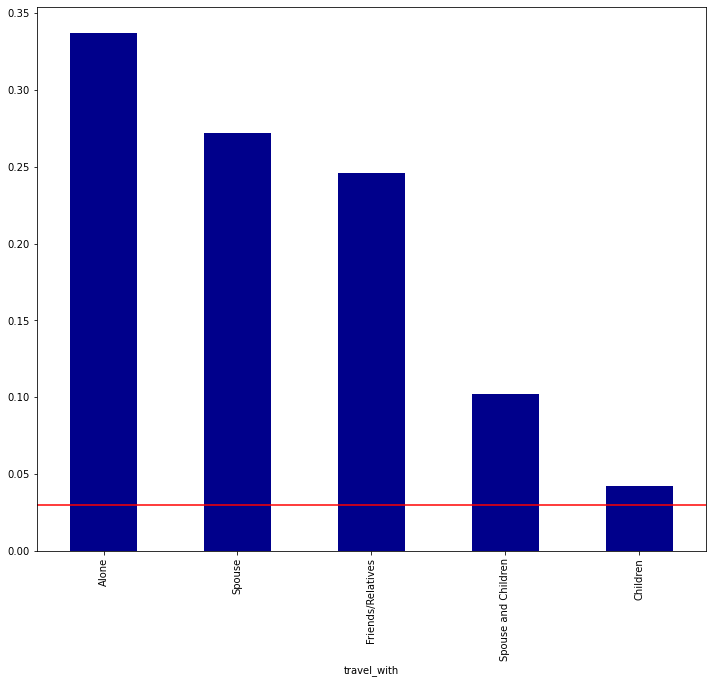

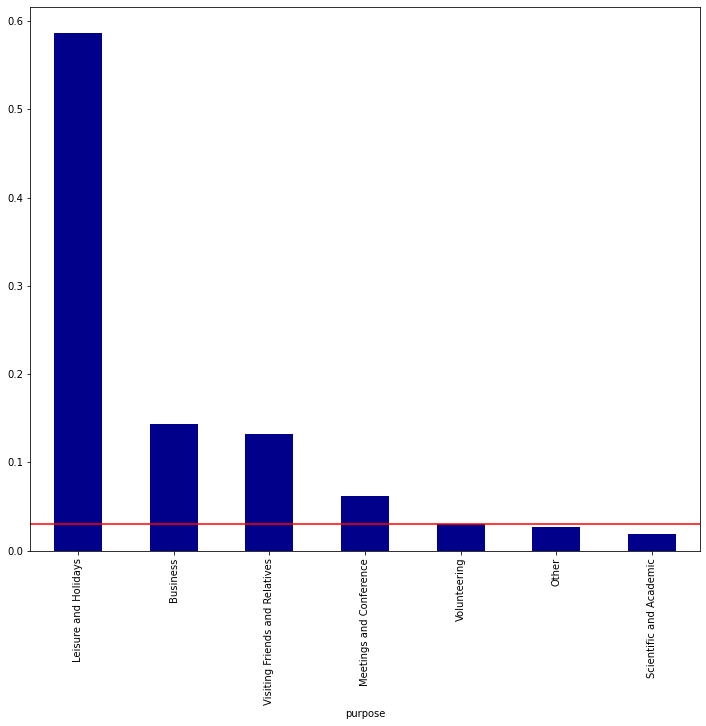

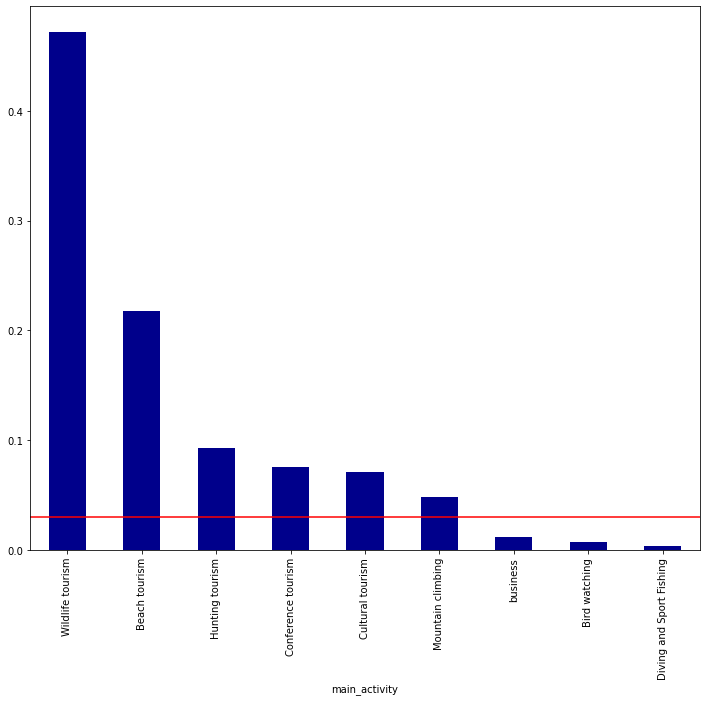

...

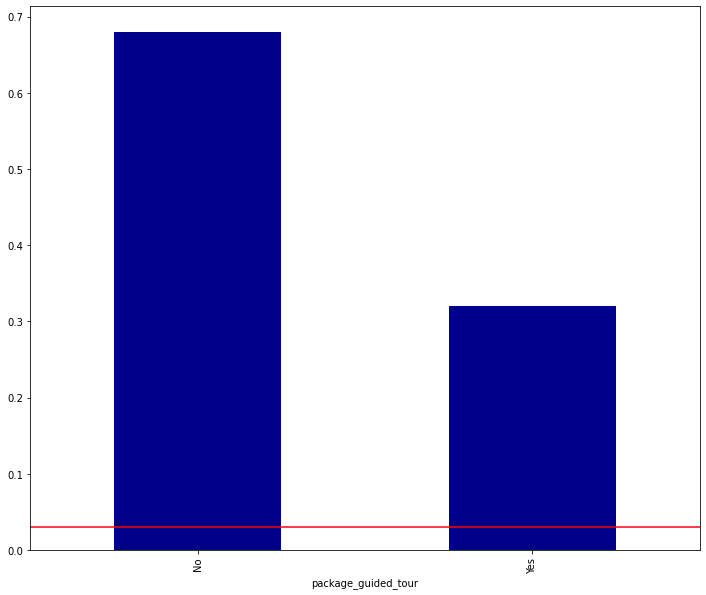

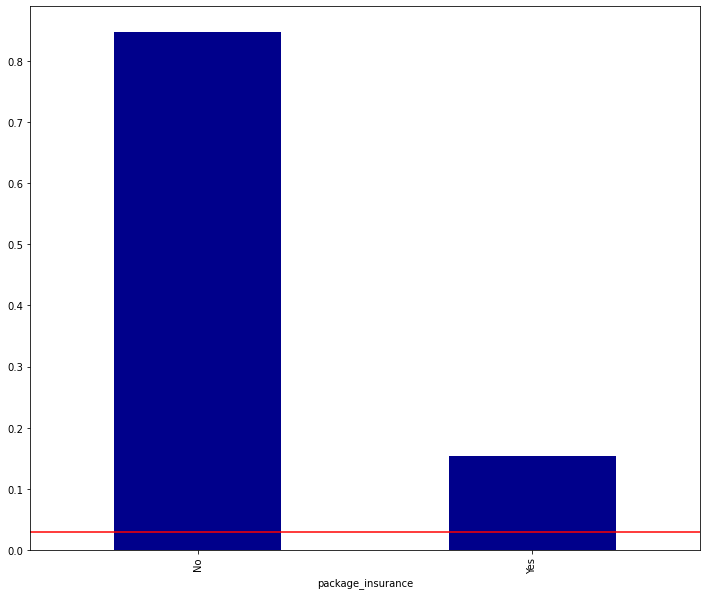

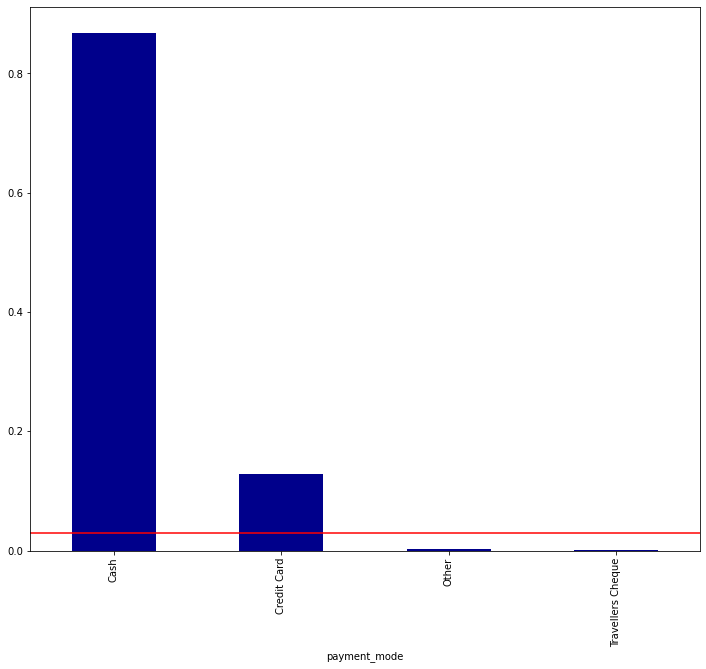

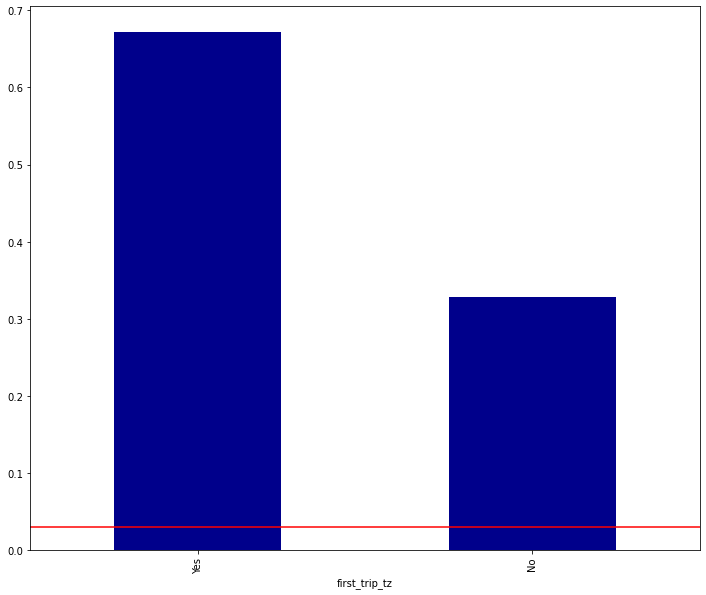

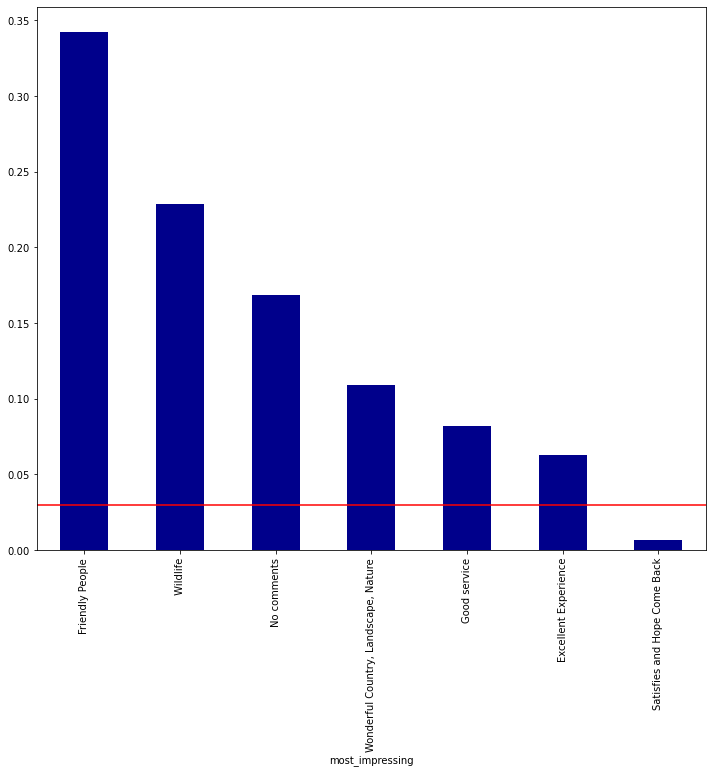

In [154]:
for i in df.select_dtypes('O').iloc[:,1:].columns:
    plt.figure(figsize=(12, 10))
    df[i].value_counts(normalize=True).plot.bar(color='darkblue')
    
    plt.axhline(0.03, color = 'red')
    plt.xlabel(i);

# NULL VALUES

In [155]:
df.isnull().sum()

ID                         0
country                    0
age_group                  0
travel_with              804
total_female               3
total_male                 4
purpose                    0
main_activity              0
info_source                0
tour_arrangement           0
package_transport_int      0
package_accomodation       0
package_food               0
package_transport_tz       0
package_sightseeing        0
package_guided_tour        0
package_insurance          0
night_mainland             0
night_zanzibar             0
payment_mode               0
first_trip_tz              0
most_impressing          228
total_cost                 0
dtype: int64

In [156]:
df.isnull().mean()*100

ID                        0.000000
country                   0.000000
age_group                 0.000000
travel_with              23.150014
total_female              0.086381
total_male                0.115174
purpose                   0.000000
main_activity             0.000000
info_source               0.000000
tour_arrangement          0.000000
package_transport_int     0.000000
package_accomodation      0.000000
package_food              0.000000
package_transport_tz      0.000000
package_sightseeing       0.000000
package_guided_tour       0.000000
package_insurance         0.000000
night_mainland            0.000000
night_zanzibar            0.000000
payment_mode              0.000000
first_trip_tz             0.000000
most_impressing           6.564929
total_cost                0.000000
dtype: float64

<AxesSubplot:>

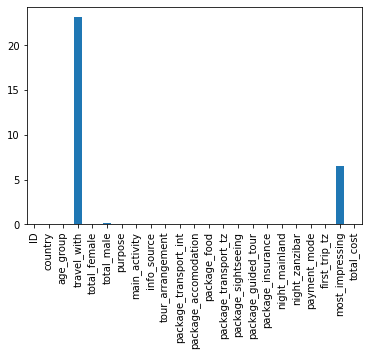

In [157]:
(df.isnull().mean()*100).plot.bar()

# DISTRIBUTION AND UNIVARIATE ANALYSIS OF NUMERICAL FEATURES

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

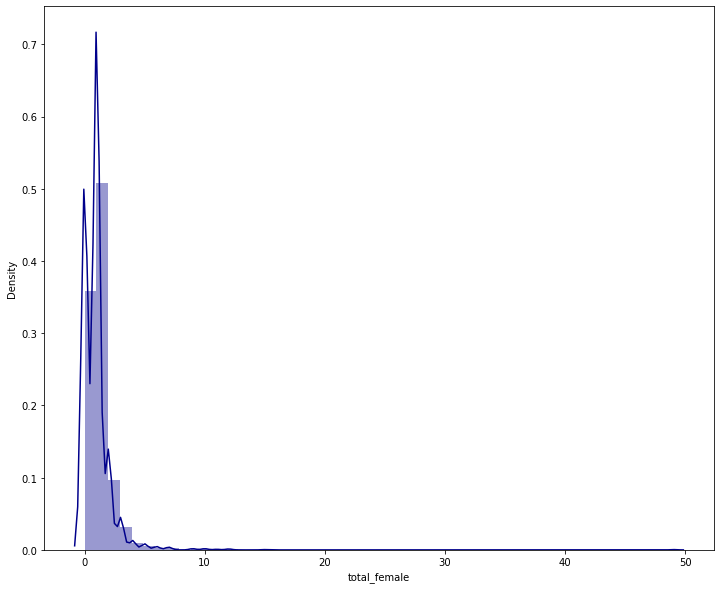

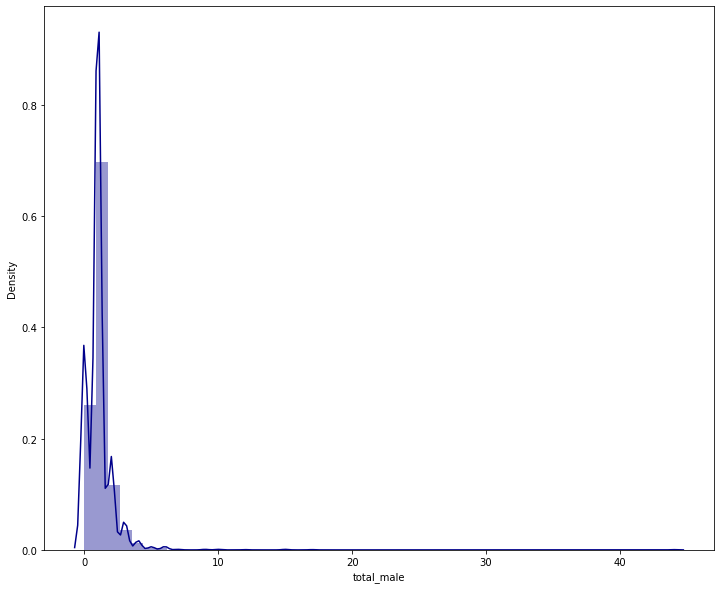

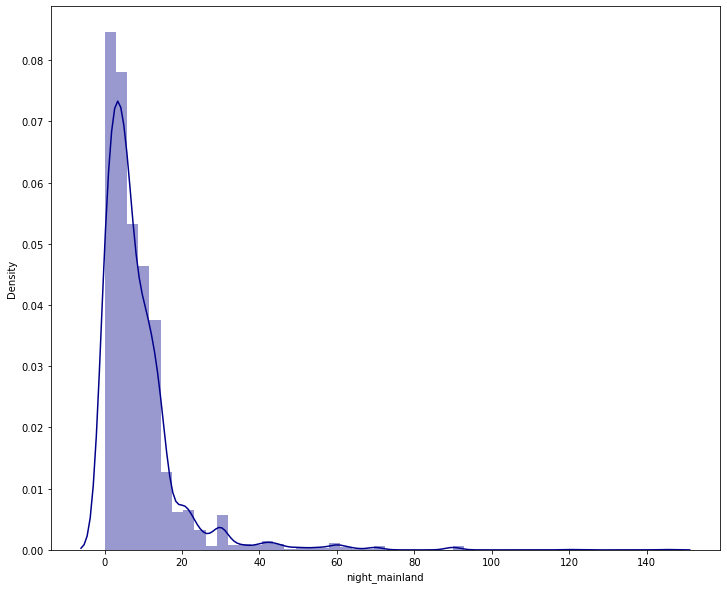

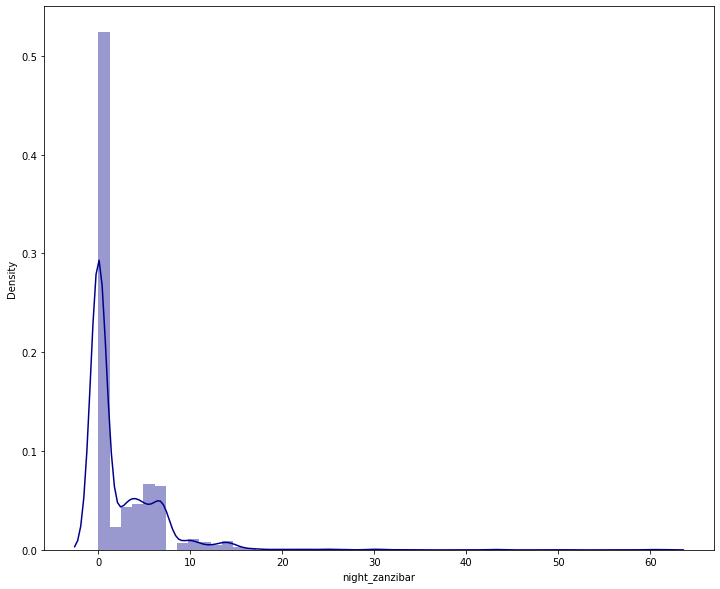

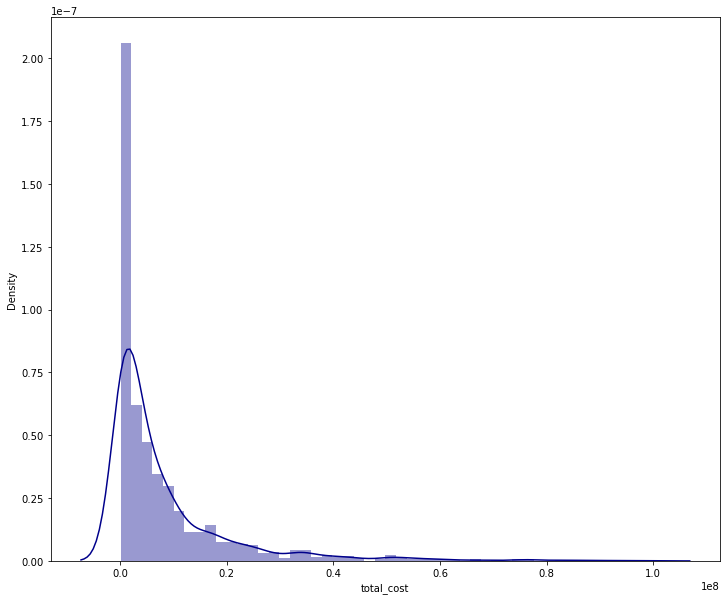

In [158]:
for i in df.select_dtypes('number').columns:
    plt.figure(figsize=(12,10))
    sns.distplot(df[i], color='darkblue')

# BIVARIATE ANALYSIS

In [159]:
df = df.drop(['ID'], axis=1)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

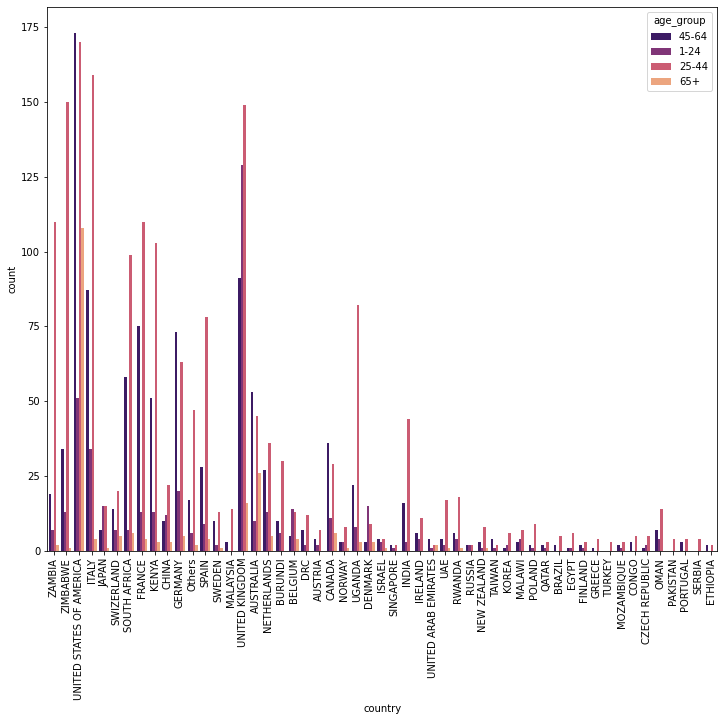

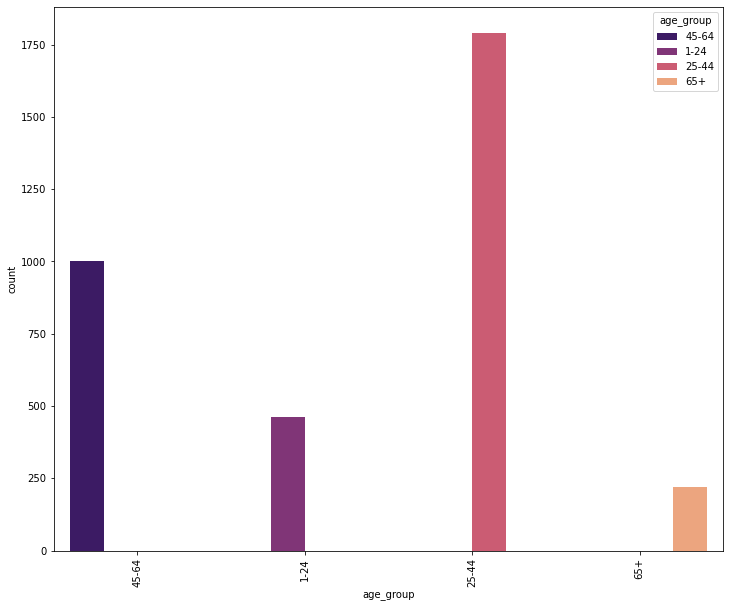

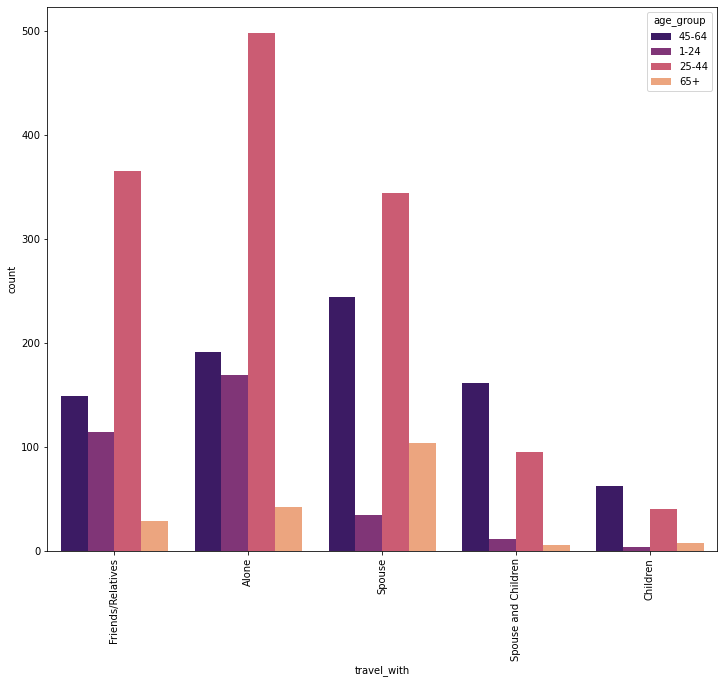

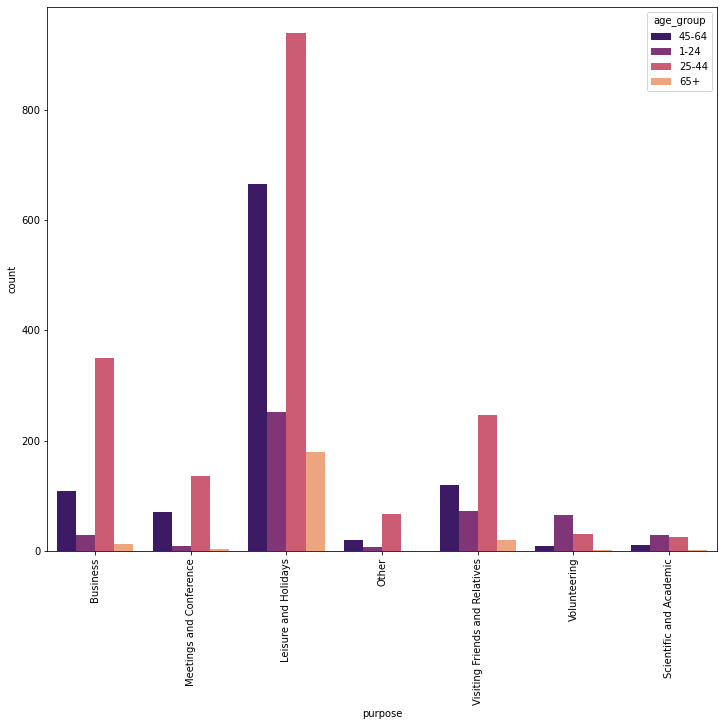

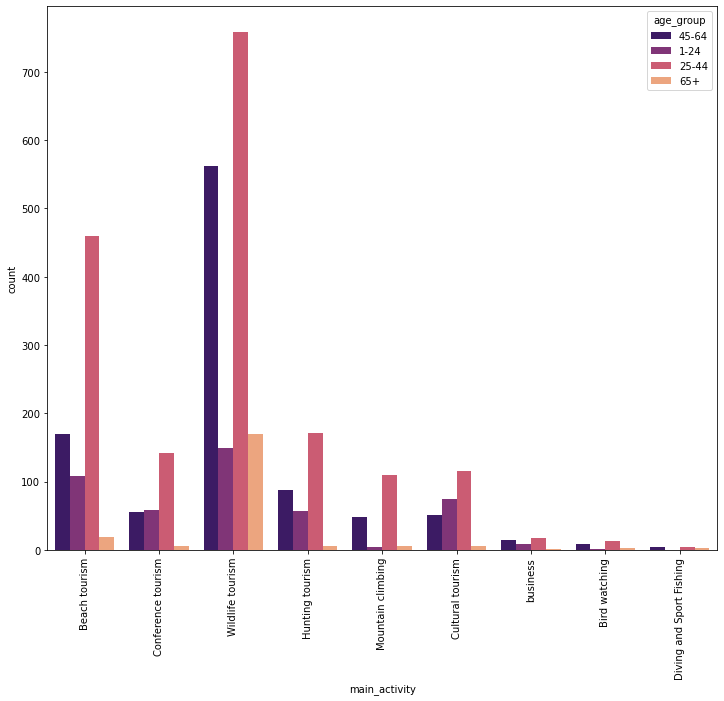

...

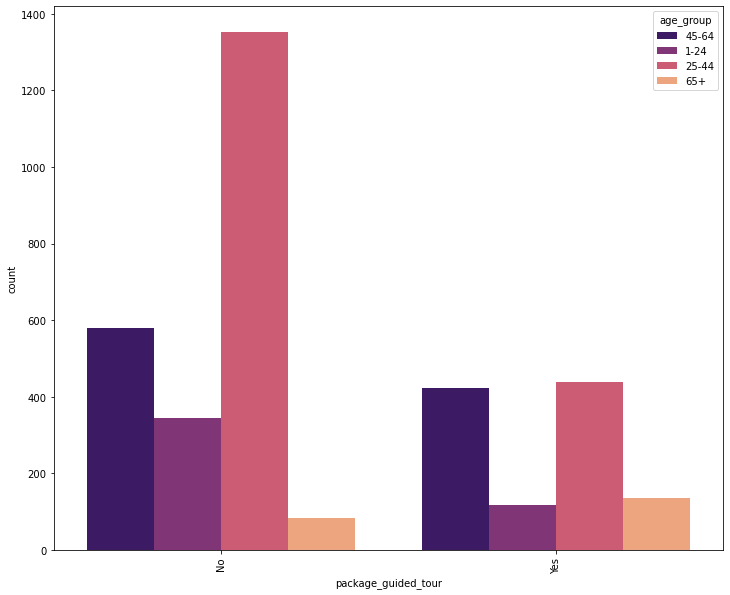

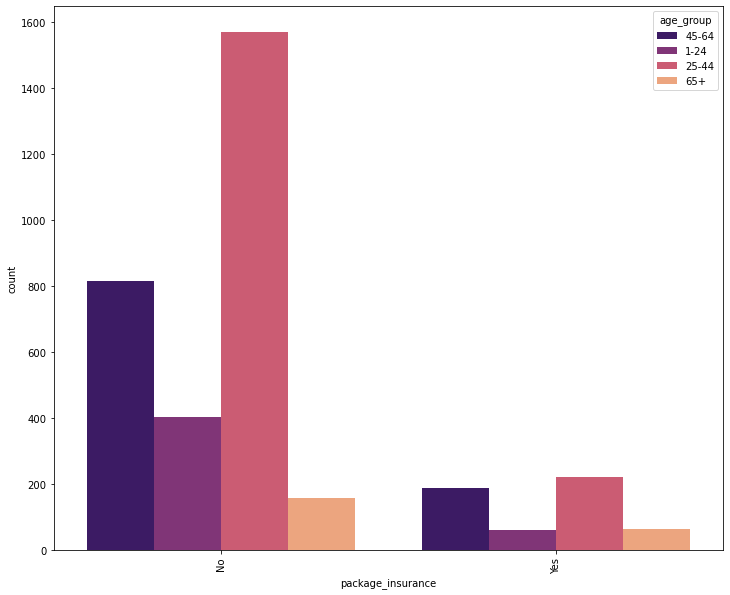

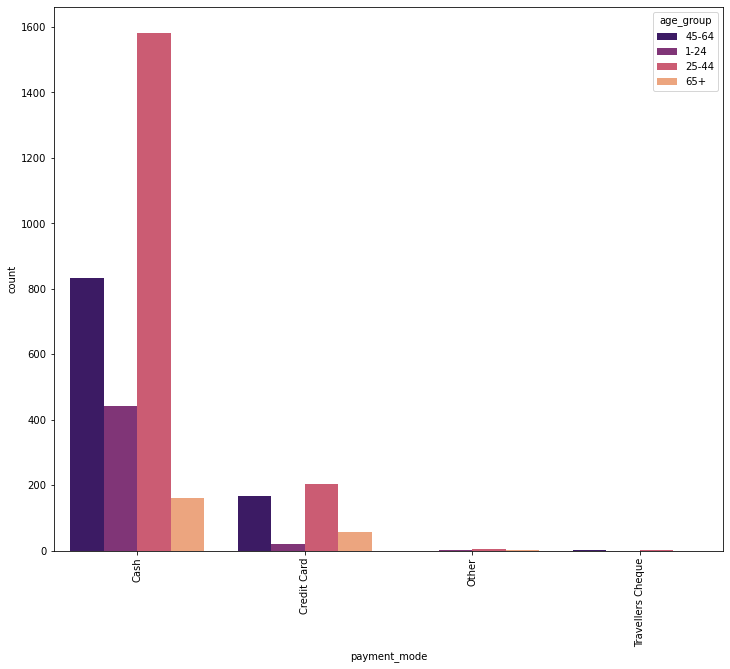

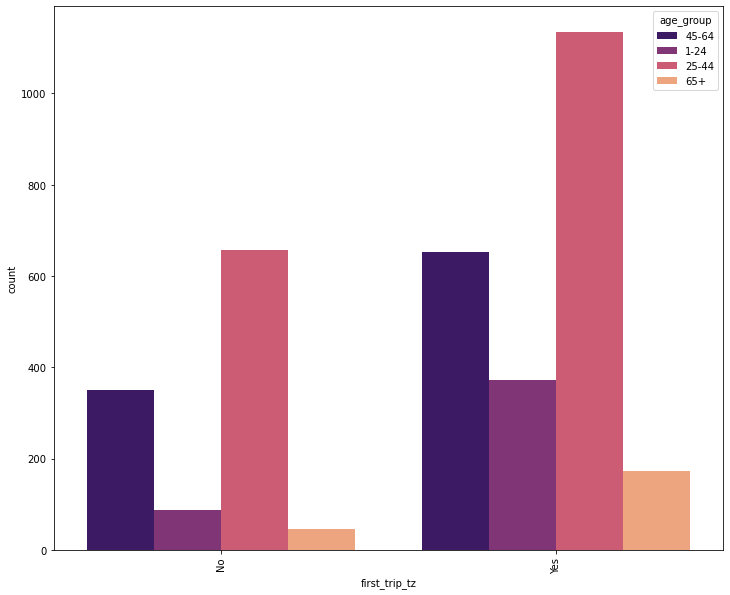

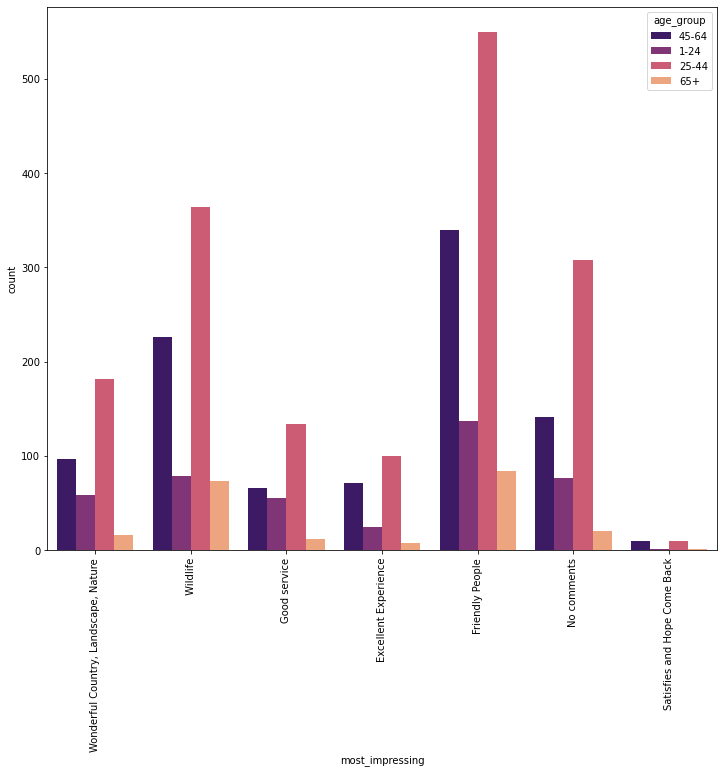

In [160]:
for i in df.select_dtypes('O').columns:
    plt.figure(figsize=(12, 10))
    sns.countplot(data = df, x=i, hue = 'age_group', palette = 'magma')
    plt.xticks(rotation=90);

In [161]:
for i in df.select_dtypes('O').columns:
    print(pd.crosstab(df['age_group'], df[i], normalize=True))
    print('______________________________________________________________________________________________________________')

country    AUSTRALIA   AUSTRIA   BELGIUM    BRAZIL   BURUNDI    CANADA  \
age_group                                                                
1-24        0.002879  0.000576  0.004031  0.000000  0.001728  0.003167   
25-44       0.012957  0.002016  0.003743  0.001440  0.008638  0.008350   
45-64       0.015261  0.001152  0.001440  0.000576  0.002879  0.010366   
65+         0.007486  0.000000  0.001152  0.000000  0.000000  0.001728   

country       CHINA     CONGO  CZECH REPUBLIC   DENMARK       DRC     EGYPT  \
age_group                                                                     
1-24       0.003455  0.000000        0.000576  0.004319  0.000576  0.000288   
25-44      0.006335  0.001440        0.001440  0.002591  0.003455  0.001728   
45-64      0.002879  0.000864        0.000288  0.000864  0.002016  0.000288   
65+        0.000864  0.000000        0.000000  0.000864  0.000000  0.000000   

country    ETHIOPIA   FINLAND    FRANCE   GERMANY    GREECE     INDIA  \
age_gro

most_impressing   Wildlife  Excellent Experience  Friendly People  \
age_group                                                           
1-24              0.024345              0.007704         0.042219   
25-44             0.112173              0.030817         0.169183   
45-64             0.069646              0.021880         0.104777   
65+               0.022496              0.002465         0.025886   

most_impressing  Good service  No comments  Satisfies and Hope Come Back  \
age_group                                                                  
1-24                 0.016949     0.023729                      0.000308   
25-44                0.041294     0.094915                      0.003082   
45-64                0.020339     0.043451                      0.003082   
65+                  0.003698     0.006163                      0.000308   

most_impressing  Wonderful Country, Landscape, Nature  
age_group                                              
1-24            

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

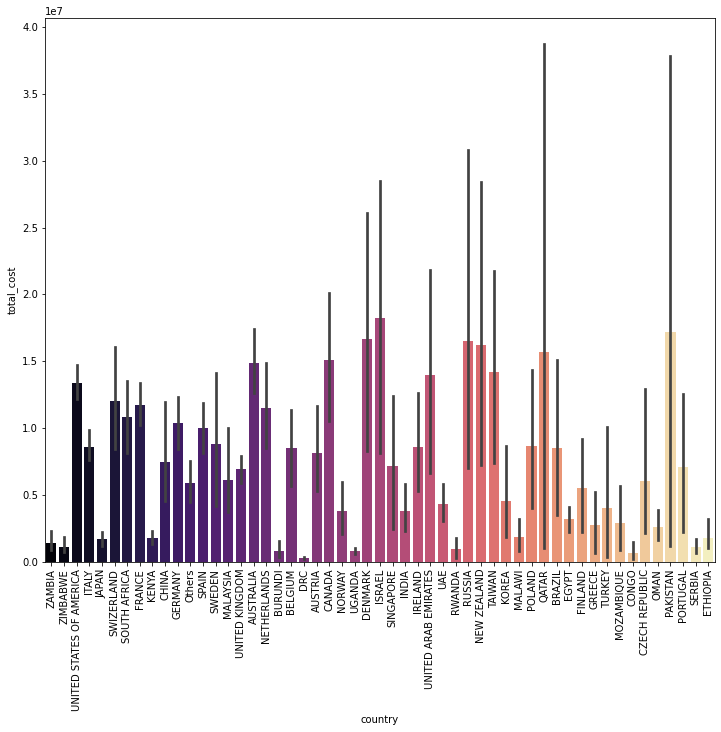

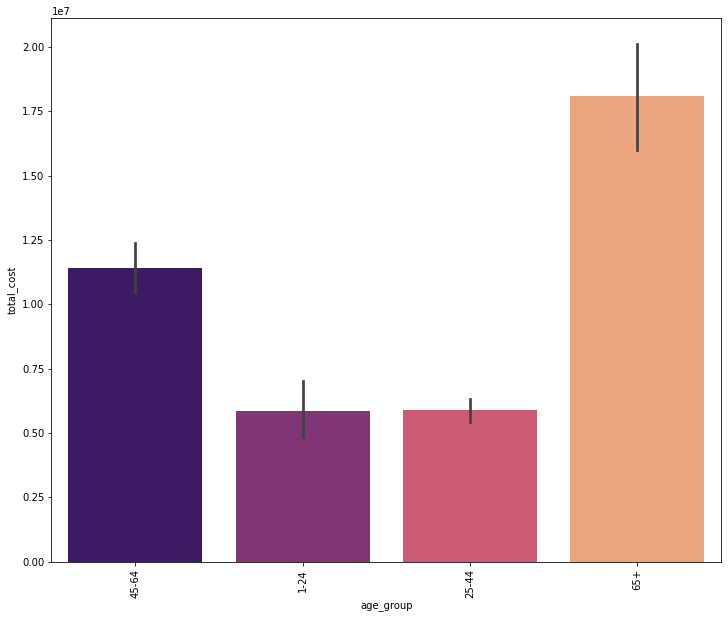

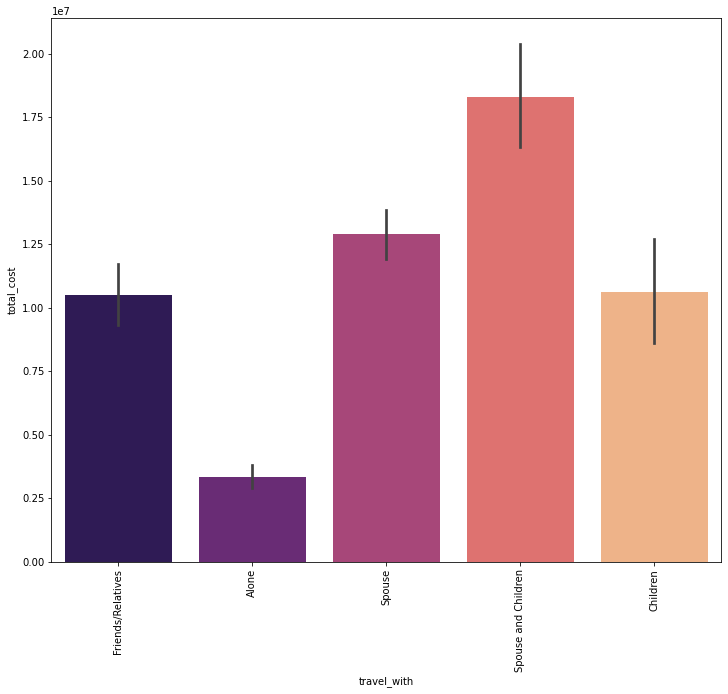

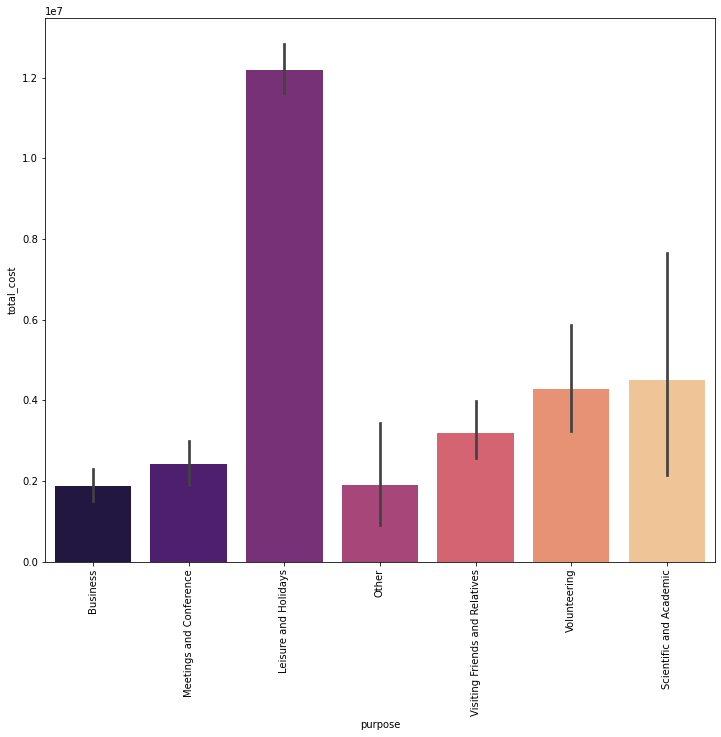

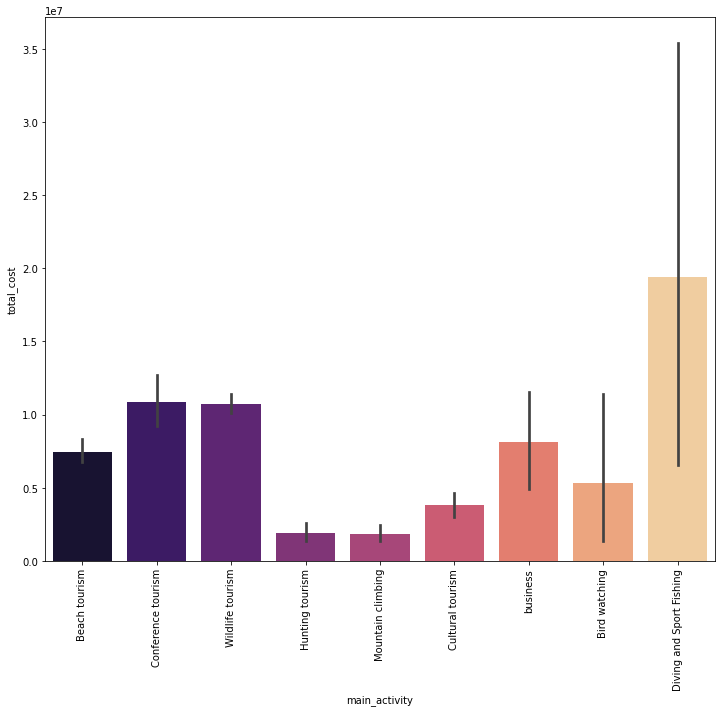

...

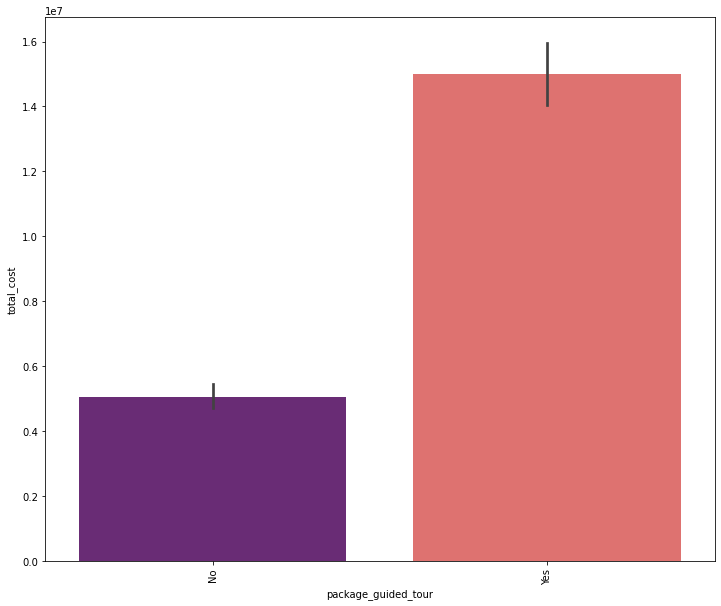

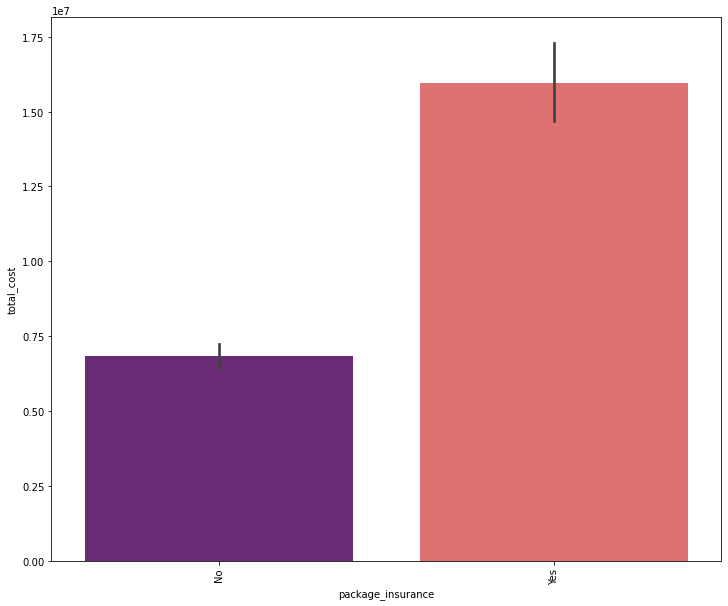

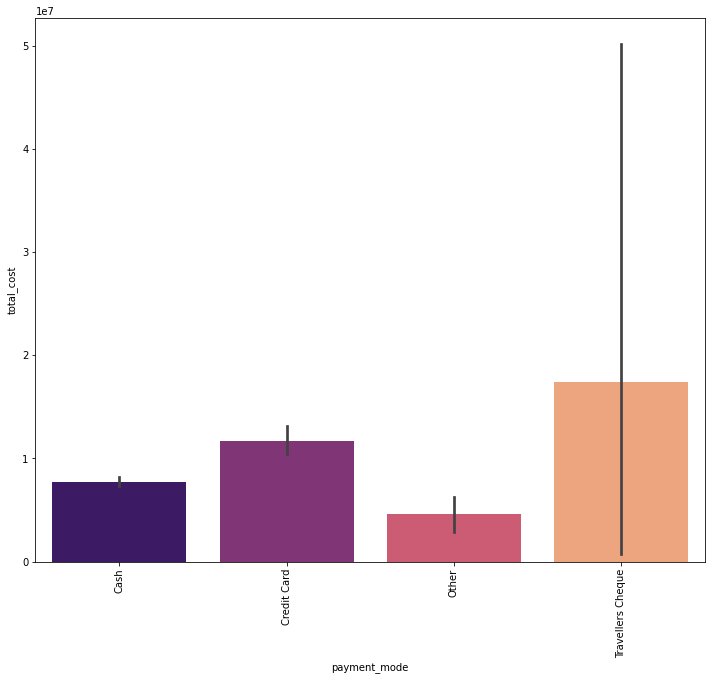

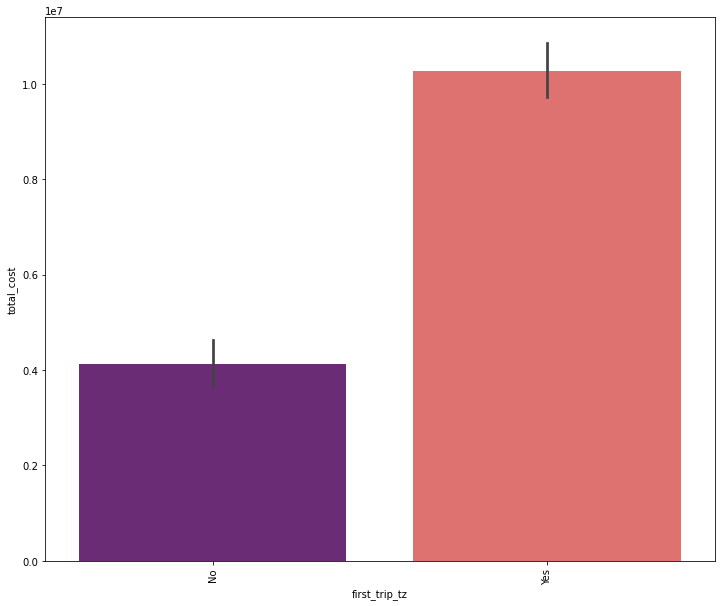

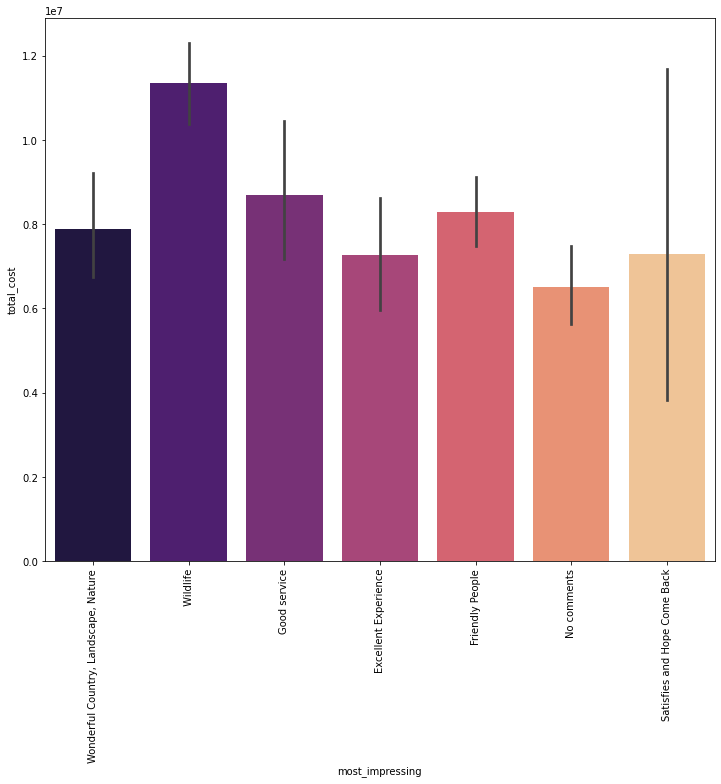

In [162]:
#categorical features relationship with target variable
for i in df.select_dtypes('O').columns:
    plt.figure(figsize=(12, 10))
    sns.barplot(data = df ,x = i, y='total_cost', palette = 'magma')
    plt.xticks(rotation =90)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

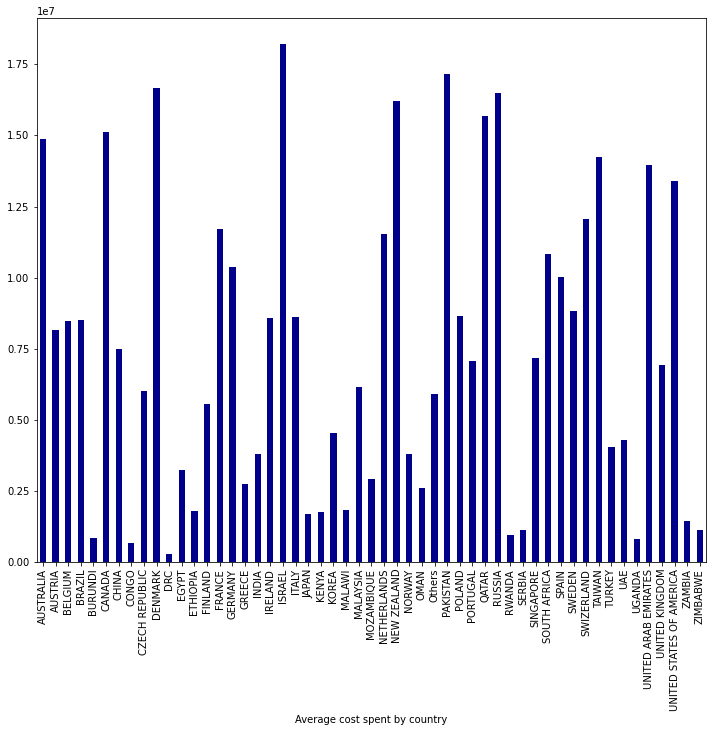

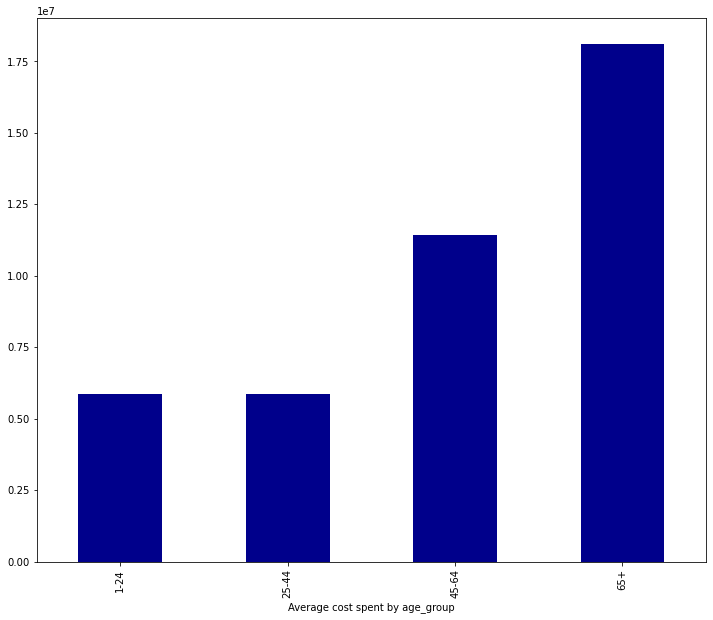

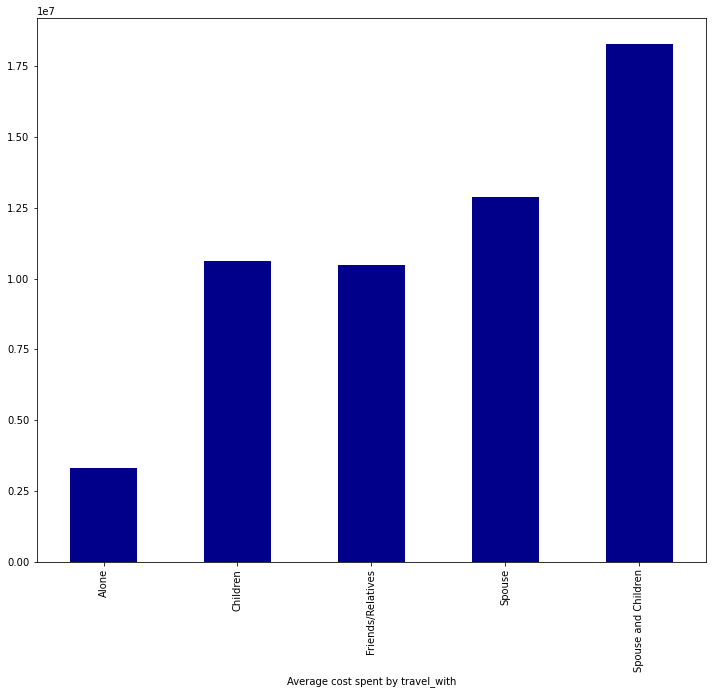

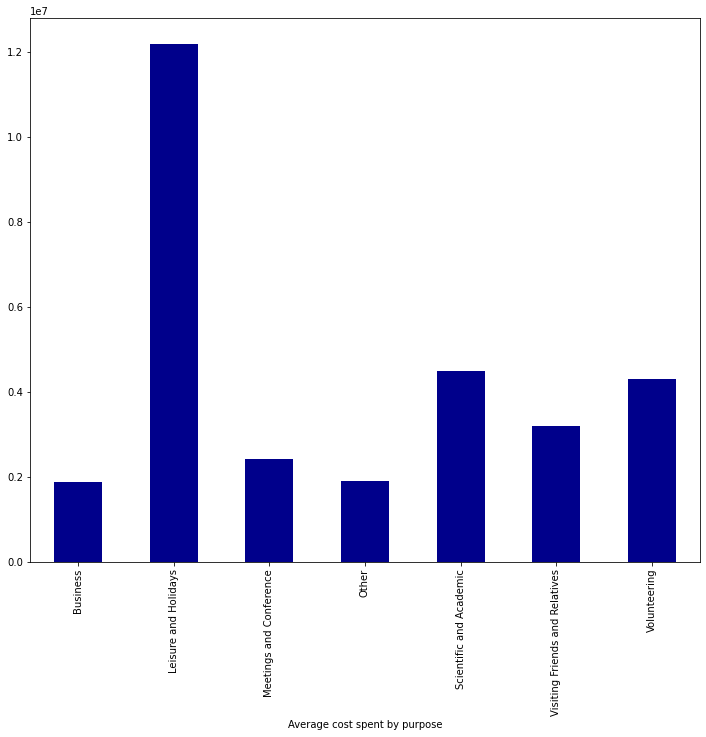

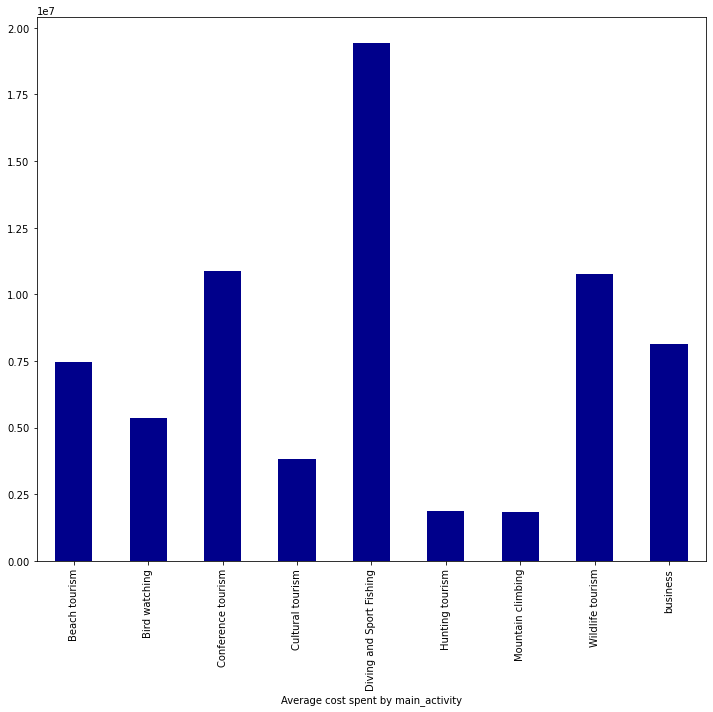

...

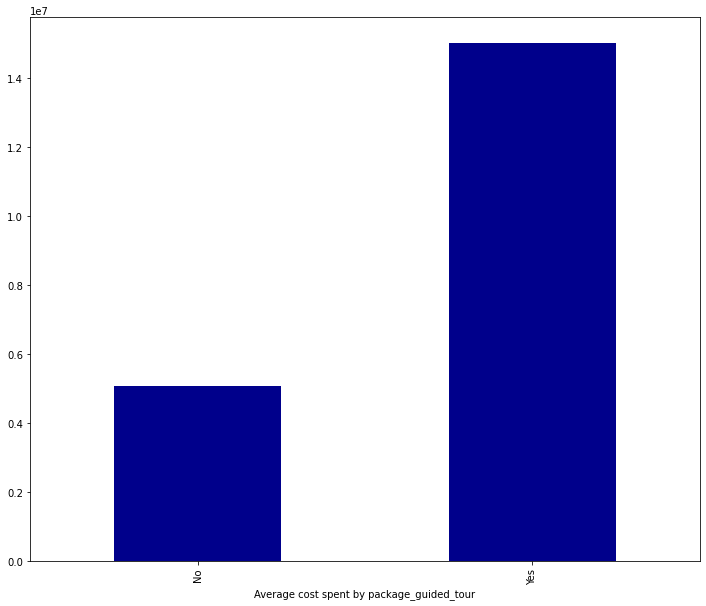

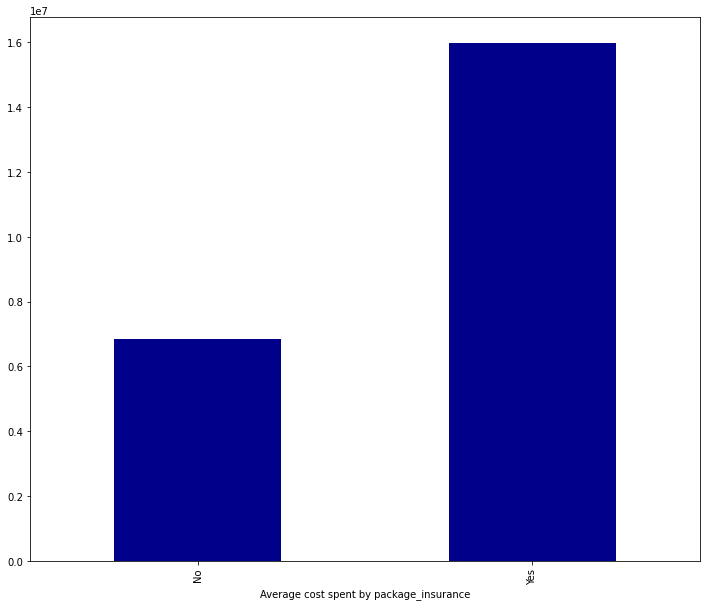

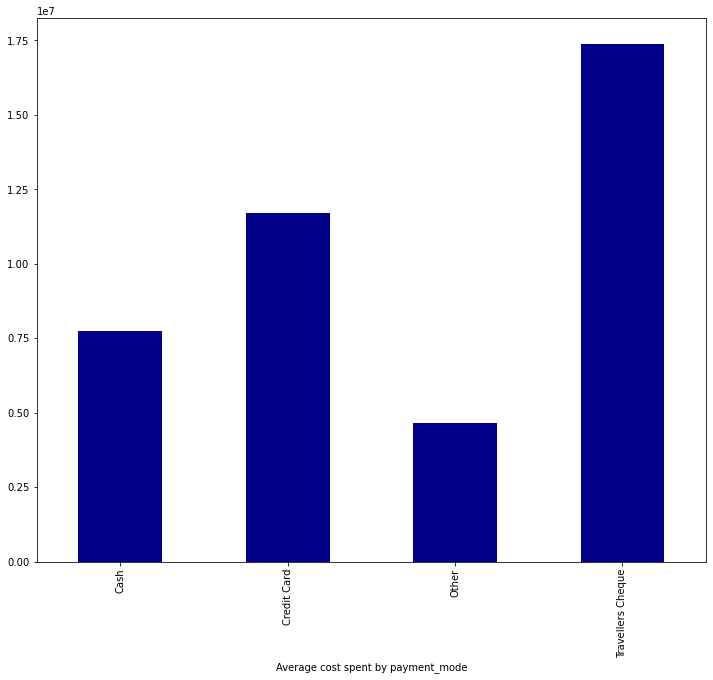

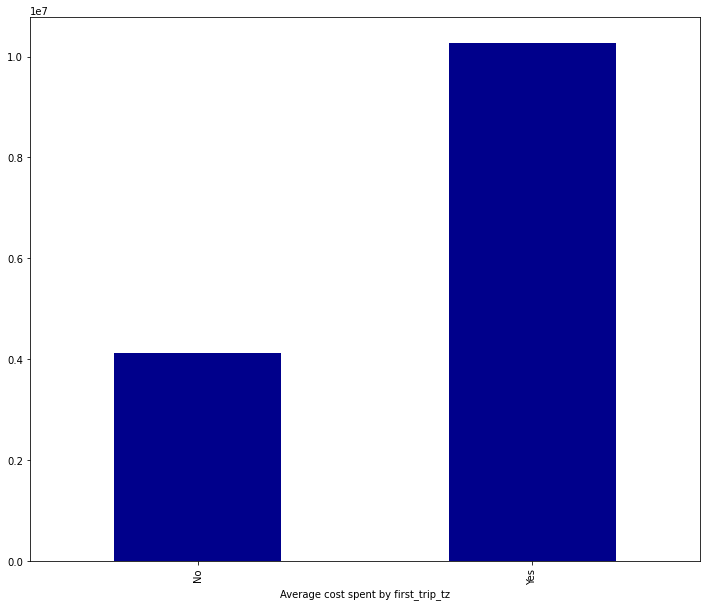

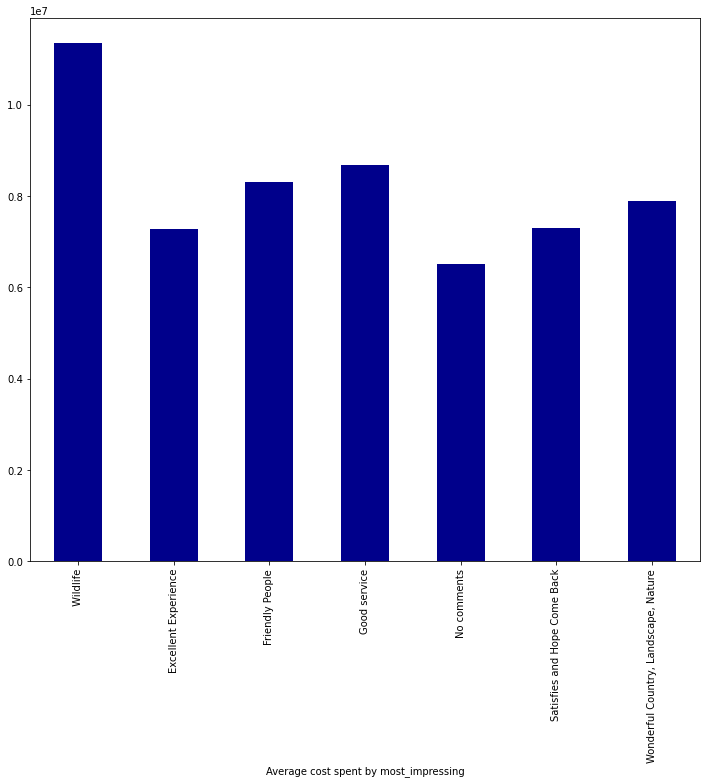

In [163]:
#categorical features relationship with target variable
for i in df.select_dtypes('O').columns:
    plt.figure(figsize=(12, 10))
    df.groupby(i)['total_cost'].mean().plot.bar(color='darkblue')
    plt.xlabel(f'Average cost spent by {i}')
    plt.xticks(rotation =90)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

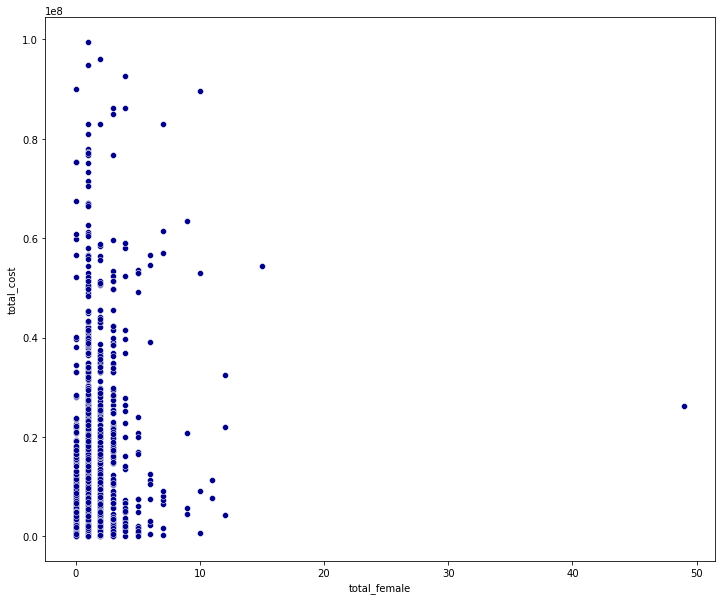

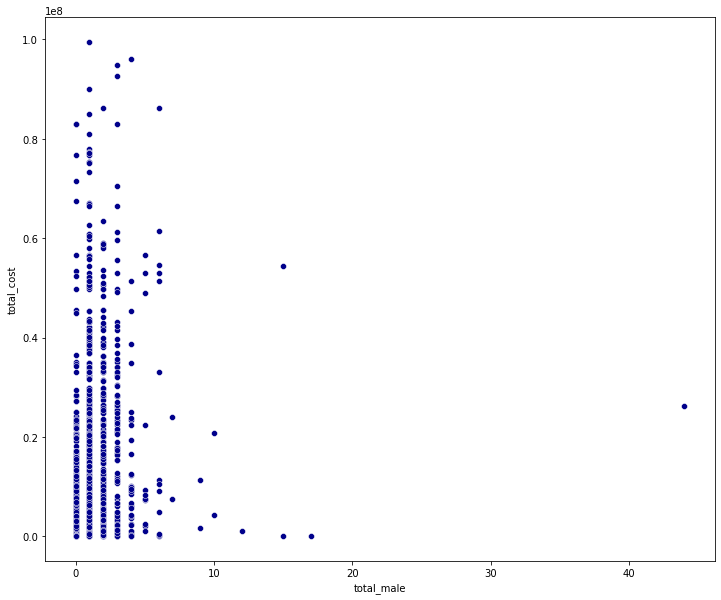

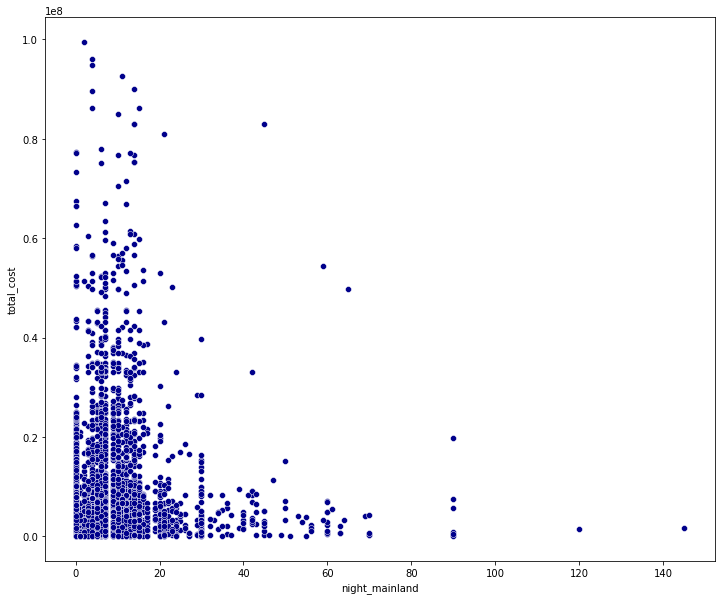

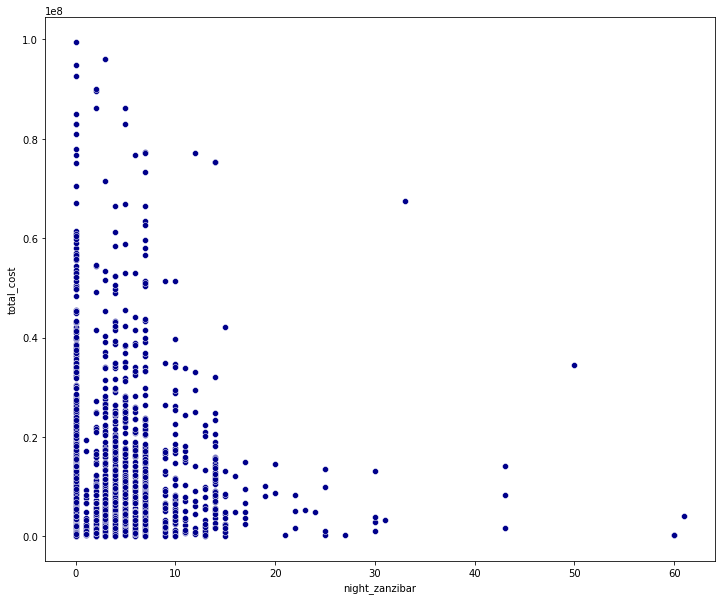

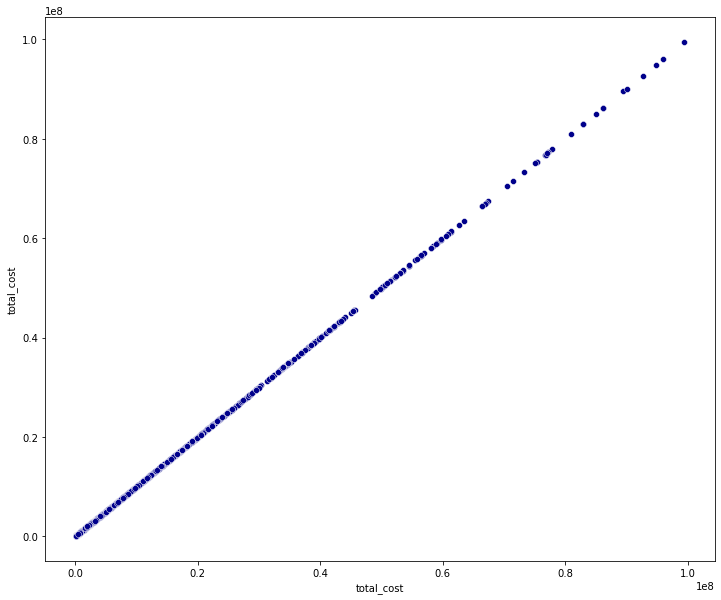

In [164]:
#numerical features relationship with target
for i in df.select_dtypes('number').columns:
    plt.figure(figsize=(12, 10))
    sns.scatterplot(data=df, x =i, y='total_cost', color = 'darkblue')

# STATISTICS

In [165]:
for i in df.select_dtypes('number').columns:
    print(i.upper())
    print(f'Skew of {i} is',df[i].skew())
    print(f'Kurtosis of {i} is',df[i].kurt())
    print(f'Standard deviation of {i} is',df[i].std())
    mean = df[i].mean()
    median = df[i].median()
    print(f'Mean of {i} is',mean)
    print(f'Median of {i} is',median)
          
    if mean>median:
        print(f'{i.upper()} is right skewed')
        
    elif mean<median:
        print(f'{i.upper()} is left skewed')
    elif mean ==  median:
        print(f'{i.upper()} is normal')
    print('____________________________________________________________')
    print()

TOTAL_FEMALE
Skew of total_female is 13.740624636398184
Kurtosis of total_female is 410.6181642490417
Standard deviation of total_female is 1.4007381630520483
Mean of total_female is 0.9397694524495678
Median of total_female is 1.0
TOTAL_FEMALE is left skewed
____________________________________________________________

TOTAL_MALE
Skew of total_male is 14.269084915999464
Kurtosis of total_male is 423.7493535576477
Standard deviation of total_male is 1.2494353153254416
Mean of total_male is 1.0420870567887
Median of total_male is 1.0
TOTAL_MALE is right skewed
____________________________________________________________

NIGHT_MAINLAND
Skew of night_mainland is 3.9980587227948163
Kurtosis of night_mainland is 26.668785939814075
Standard deviation of night_mainland is 10.336839779200346
Mean of night_mainland is 8.493233515692484
Median of night_mainland is 6.0
NIGHT_MAINLAND is right skewed
____________________________________________________________

NIGHT_ZANZIBAR
Skew of night_zanzib

# LINEARITY

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 864x720 with 0 Axes>

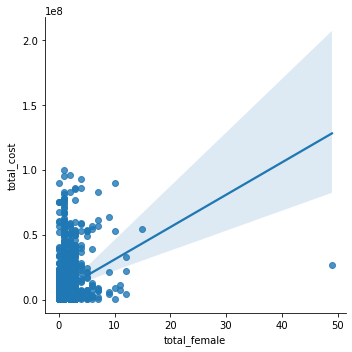

<Figure size 864x720 with 0 Axes>

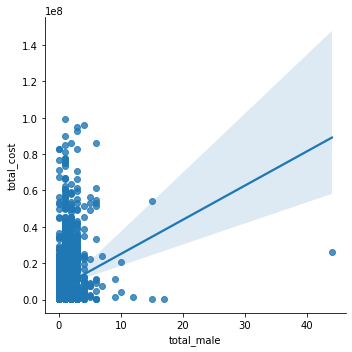

<Figure size 864x720 with 0 Axes>

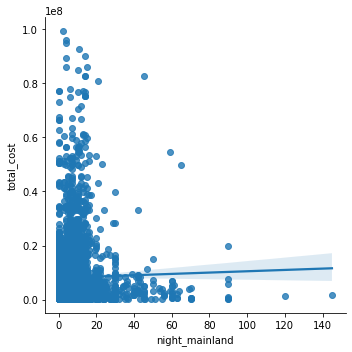

<Figure size 864x720 with 0 Axes>

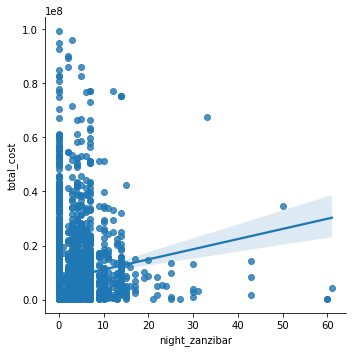

<Figure size 864x720 with 0 Axes>

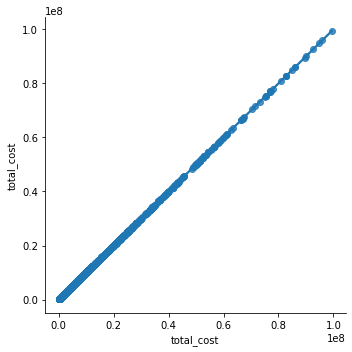

In [166]:
for i in df.select_dtypes('number').columns:
    plt.figure(figsize=(12, 10))
    sns.lmplot(data = df, x =i, y='total_cost');

# CORRELATION/ MULTICOLLINEARITY

<AxesSubplot:>

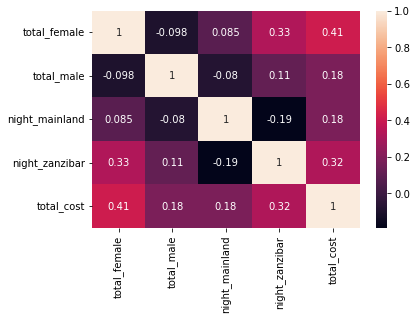

In [167]:
sns.heatmap(df.corr(method = 'spearman'), annot=True)

<AxesSubplot:>

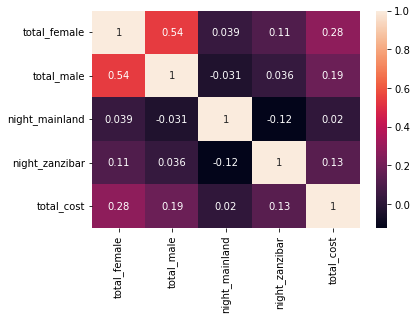

In [168]:
sns.heatmap(df.corr(method = 'pearson'), annot=True)

# OUTLIERS

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

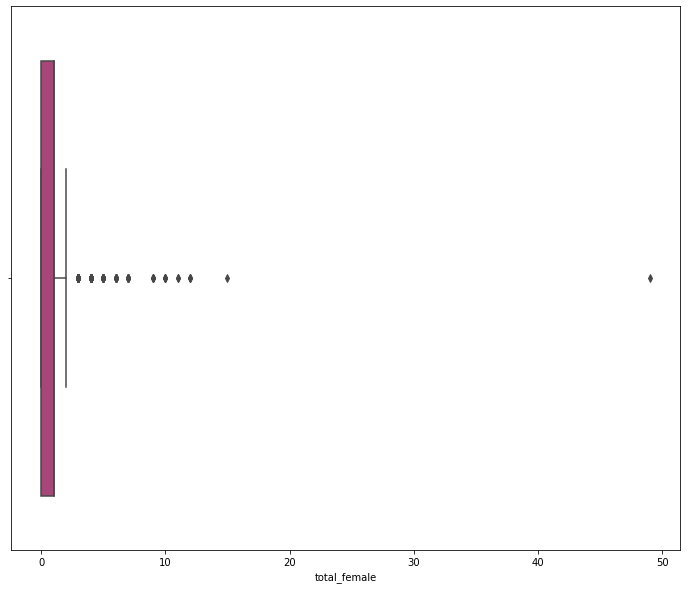

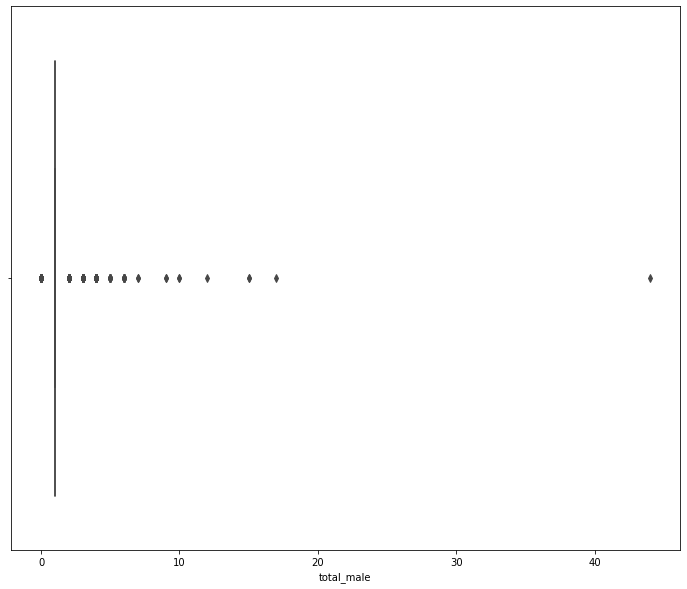

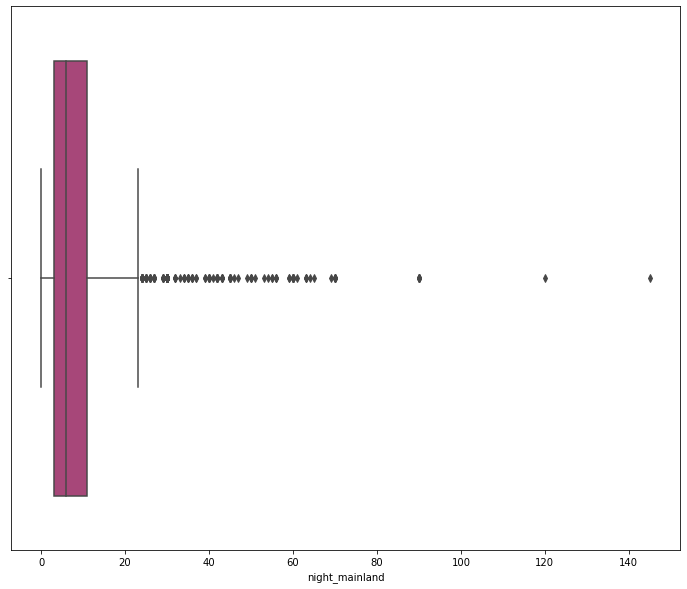

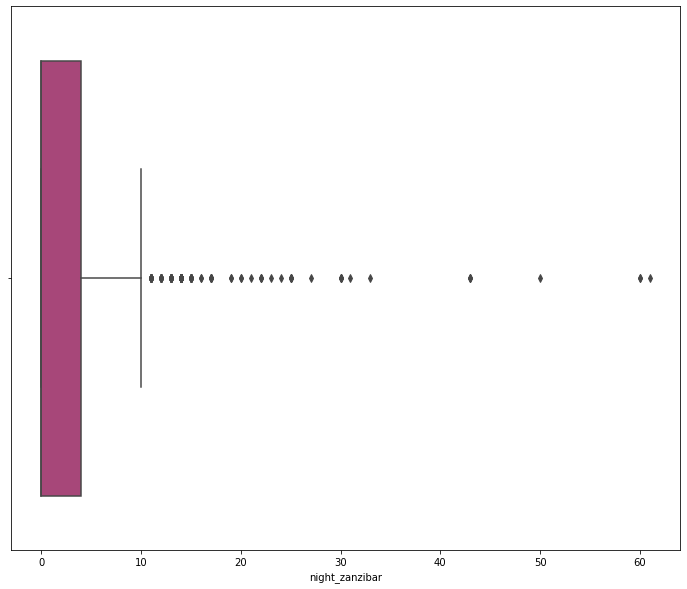

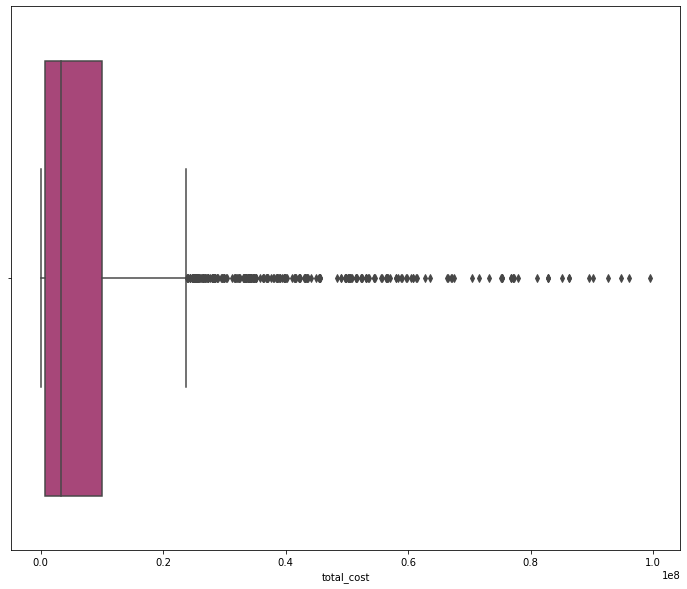

In [169]:
#boxplot
for i in df.select_dtypes('number').columns:
    plt.figure(figsize=(12, 10))
    sns.boxplot(data=df, x=i, palette='magma')

In [170]:
# IQR
Q1 = df['total_cost'].quantile(0.25)
Q3 = df['total_cost'].quantile(0.75)

IQR = Q3 - Q1

upper_limit = Q3 + 1.5*IQR
lower_limit = Q1 - 1.5*IQR

outliers = np.where(df['total_cost']>upper_limit, True, np.where(df['total_cost']<lower_limit, True, False))
print('Number of outliers:', len(df.loc[outliers]))

df.loc[outliers]

Number of outliers: 309


,country,age_group,travel_with,total_female,total_male,purpose,main_activity,info_source,tour_arrangement,package_transport_int,package_accomodation,package_food,package_transport_tz,package_sightseeing,package_guided_tour,package_insurance,night_mainland,night_zanzibar,payment_mode,first_trip_tz,most_impressing,total_cost
3443,AUSTRALIA,65+,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,Yes,Yes,Yes,Yes,Yes,Yes,No,9.0,0.0,Credit Card,Yes,Friendly People,36962250.00
2233,FRANCE,1-24,Spouse and Children,4.0,2.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,Yes,Yes,Yes,Yes,Yes,No,Yes,13.0,3.0,Cash,Yes,"Wonderful Country, Landscape, Nature",26520000.00
476,UNITED STATES OF AMERICA,65+,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,Yes,Yes,Yes,Yes,Yes,No,No,6.0,0.0,Credit Card,Yes,Wildlife,25194000.00
3658,UNITED KINGDOM,65+,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,No,Yes,No,Yes,Yes,No,No,4.0,0.0,Credit Card,Yes,Excellent Experience,34807500.00
3029,GERMANY,25-44,Friends/Relatives,1.0,2.0,Leisure and Holidays,Beach tourism,"Travel, agent, tour operator",Package Tour,Yes,Yes,Yes,Yes,No,No,No,0.0,5.0,Cash,Yes,Good service,24962630.00
2630,SOUTH AFRICA,45-64,Spouse,1.0,1.0,Leisure and Holidays,Beach tourism,others,Package Tour,Yes,Yes,Yes,Yes,No,No,No,0.0,7.0,Cash,Yes,Friendly People,73261500.00
3982,UNITED STATES OF AMERICA,65+,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Friends, relatives",Package Tour,Yes,Yes,Yes,Yes,Yes,Yes,Yes,6.0,0.0,Credit Card,Yes,Good service,25591800.00
435,UNITED STATES OF AMERICA,65+,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,Yes,Yes,Yes,Yes,No,No,No,10.0,0.0,Credit Card,Yes,Friendly People,39780000.00
3152,ZIMBABWE,25-44,Spouse and Children,2.0,2.0,Leisure and Holidays,Beach tourism,"Radio, TV, Web",Package Tour,Yes,Yes,Yes,Yes,No,No,No,0.0,4.0,Cash,Yes,Friendly People,58344000.00
844,GERMANY,45-64,Spouse,1.0,1.0,Leisure and Holidays,Wildlife tourism,"Travel, agent, tour operator",Package Tour,Yes,Yes,Yes,Yes,No,No,No,14.0,0.0,Cash,Yes,No comments,27912759.00


# NORMALITY

In [171]:
#Perform the Shapiro-Wilk test for normality.

#The Shapiro-Wilk test tests the null hypothesis that the data was drawn from a normal distribution.
for i in df.select_dtypes('number').columns:
    pvalue = scipy.stats.shapiro(df[i])[1]
    
    print(i.upper())
    if pvalue<=0.05:
        print('Null hypothesis rejected. Data is not normal')
        
    else:
        print('Null hypothesis accepted. Data is normal')
        
    print()

TOTAL_FEMALE
Null hypothesis accepted. Data is normal

TOTAL_MALE
Null hypothesis accepted. Data is normal

NIGHT_MAINLAND
Null hypothesis rejected. Data is not normal

NIGHT_ZANZIBAR
Null hypothesis rejected. Data is not normal

TOTAL_COST
Null hypothesis rejected. Data is not normal



In [172]:
def normality_viz(data, column):
    plt.figure(figsize = (14, 12))
    plt.subplot(121)
    sns.distplot(data[column], color ='darkblue')
    
    plt.subplot(122)
    scipy.stats.probplot(data[column], dist='norm', plot = plt)
    

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

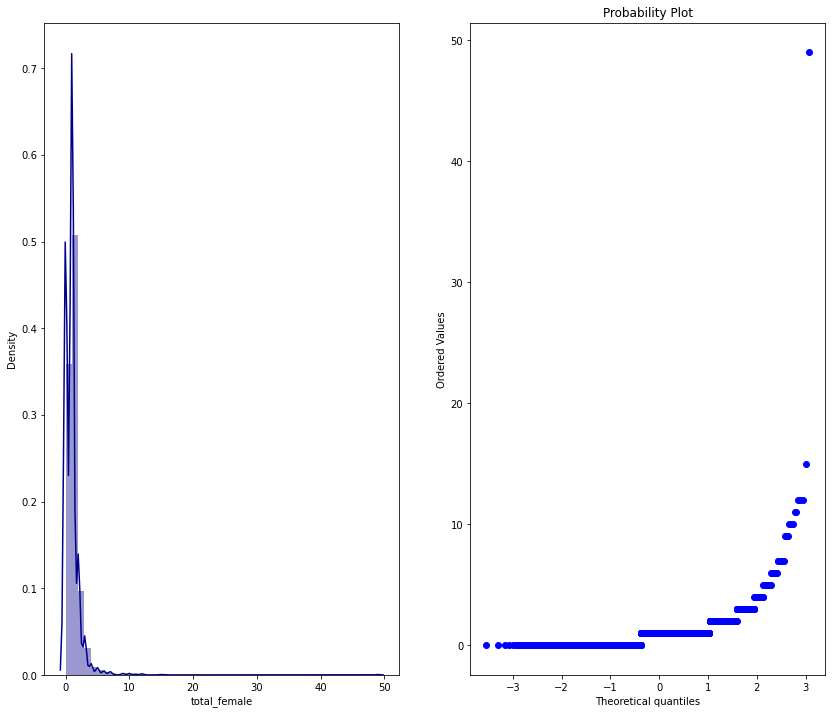

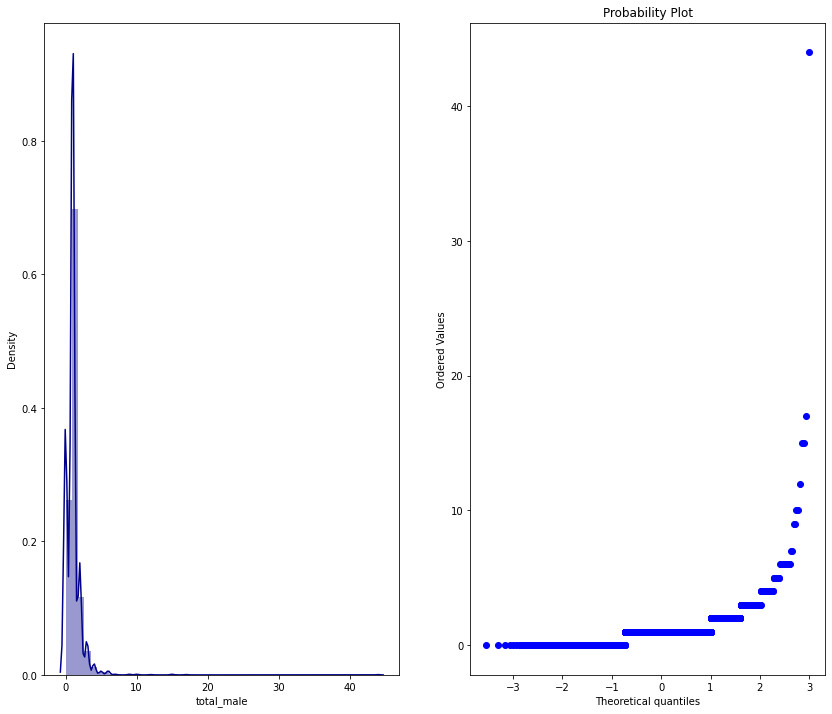

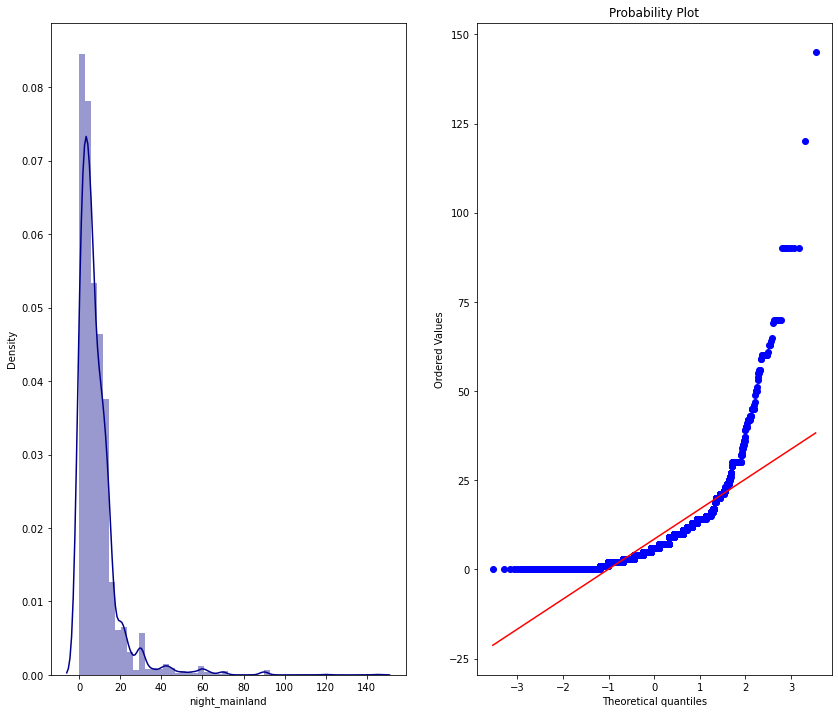

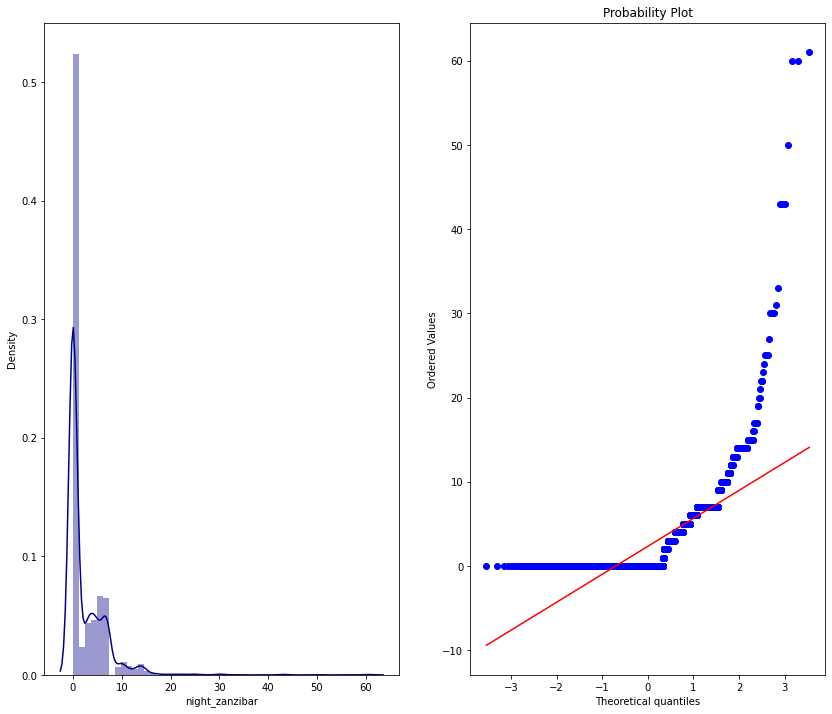

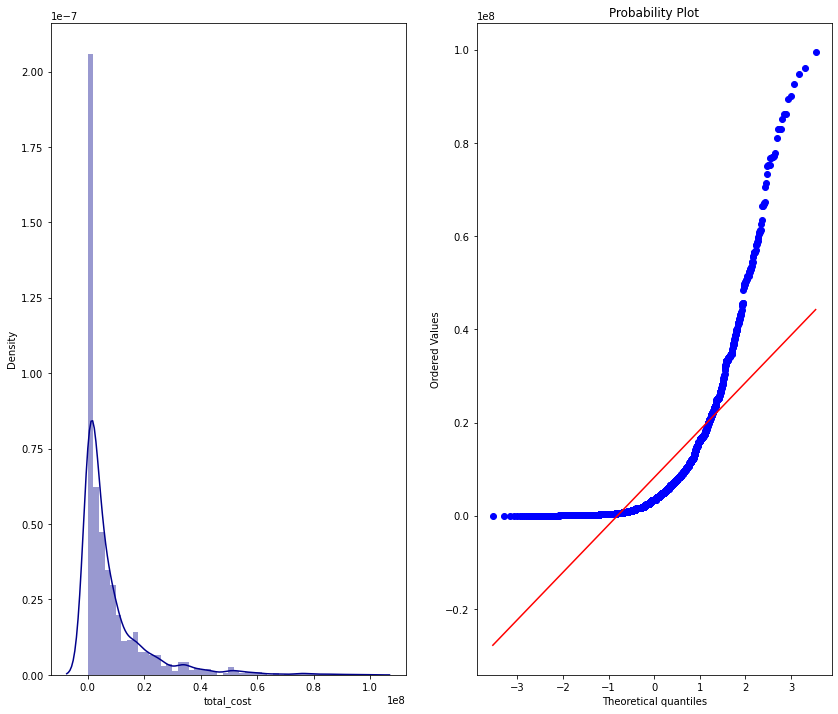

In [173]:
for i in df.select_dtypes('number').columns:
    normality_viz(df, i)

# FEATURE SCALE

In [174]:
for i in df.select_dtypes('number').columns:
    print(i.upper(),':',df[i].max()  - df[i].min())

TOTAL_FEMALE : 49.0
TOTAL_MALE : 44.0
NIGHT_MAINLAND : 145.0
NIGHT_ZANZIBAR : 61.0
TOTAL_COST : 99401000.0


# BASELINE MODEL

In [175]:
train = train.reset_index(drop=True)
train = train.drop(['ID'],axis=1)

In [176]:
xtrain = train.drop(['total_cost'], axis=1)
ytrain = train['total_cost']

ymean = ytrain.mean()
ybase = [ymean] * len(ytrain)

mae = mean_absolute_error(ybase, ytrain)
mse = mean_squared_error(ybase, ytrain)
rmse = np.sqrt(mse)

r2 = r2_score(ybase, ytrain)

n=xtrain.shape[0]
p=xtrain.shape[1]

adjusted_r2 = 1 - (1-r2) *(n-1)/(n-p-1)

baseline_model = pd.DataFrame({'Mean Absolute Error': mae,
                              'Mean Squared Error':mse,
                              'Root Mean Squared Error': rmse,
                              'R2':0.0,
                              'Adjusted R2':0.0}, index = ['Baseline model'])
baseline_model

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Baseline model,8.244835e+06,1.596613e+14,1.263572e+07,0.0,0.0


# EXPERIMENT 0: FEATURE ENGINEERING



 - Cardinality: reduce cardinality in country column by leaving the top 9 countries and setting other countries to Others
 - Encoding : One-Hot Encoding
 - Outliers: Drop
 - Linearity/Transformation/Scaling: Standard scaler
 - Feature selection method: All

In [177]:
train_0 = train.copy()

In [178]:
#outliers
# IQR
Q1 = train_0['total_cost'].quantile(0.25)
Q3 = train_0['total_cost'].quantile(0.75)

IQR = Q3 - Q1

upper_limit = Q3 + 1.5*IQR
lower_limit = Q1 - 1.5*IQR

outliers = np.where(train_0['total_cost']>upper_limit, True, np.where(train_0['total_cost']<lower_limit, True, False))
print('Number of outliers:', len(train_0.loc[outliers]))

train_0 = train_0.loc[~outliers]

Number of outliers: 309


In [179]:
#null values: drop
train_0 = train_0.dropna()

In [180]:
train.shape, train_0.shape

((3473, 22), (2201, 22))

In [181]:
xtrain_0 = train_0.drop(['total_cost'], axis = 1)
ytrain_0 = train_0['total_cost']

In [182]:
# Standard scaling on numerical features
scaler = StandardScaler()
numerical_features = xtrain_0.select_dtypes('number').columns
xtrain_0[numerical_features] = scaler.fit_transform(xtrain_0[numerical_features])



# One-hot encoding on categorical features
categorical_features = xtrain_0.select_dtypes('O').columns
#encoding & cardinality
cardinality = xtrain_0['country'].value_counts(normalize=True)
keep_values = cardinality[cardinality>=0.04].index.tolist()


# Replace the values that are not in the keep_values list with "others"
xtrain_0.loc[~xtrain_0['country'].isin(keep_values), 'country'] = "Others"

xtrain_0 = pd.get_dummies(xtrain_0,columns =categorical_features, drop_first=True)#drop first value to reduce multicollinearity

In [183]:
xtrain_0.head()

,total_female,total_male,night_mainland,night_zanzibar,country_GERMANY,country_ITALY,country_KENYA,country_Others,country_SOUTH AFRICA,country_UNITED KINGDOM,country_UNITED STATES OF AMERICA,country_ZAMBIA,country_ZIMBABWE,age_group_25-44,age_group_45-64,age_group_65+,travel_with_Children,travel_with_Friends/Relatives,travel_with_Spouse,travel_with_Spouse and Children,purpose_Leisure and Holidays,purpose_Meetings and Conference,purpose_Other,purpose_Scientific and Academic,purpose_Visiting Friends and Relatives,purpose_Volunteering,main_activity_Bird watching,main_activity_Conference tourism,main_activity_Cultural tourism,main_activity_Diving and Sport Fishing,main_activity_Hunting tourism,main_activity_Mountain climbing,main_activity_Wildlife tourism,main_activity_business,"info_source_Newspaper, magazines,brochures","info_source_Radio, TV, Web",info_source_Tanzania Mission Abroad,info_source_Trade fair,"info_source_Travel, agent, tour operator",info_source_inflight magazines,info_source_others,tour_arrangement_Package Tour,package_transport_int_Yes,package_accomodation_Yes,package_food_Yes,package_transport_tz_Yes,package_sightseeing_Yes,package_guided_tour_Yes,package_insurance_Yes,payment_mode_Credit Card,payment_mode_Other,payment_mode_Travellers Cheque,first_trip_tz_Yes,most_impressing_Excellent Experience,most_impressing_Friendly People,most_impressing_Good service,most_impressing_No comments,most_impressing_Satisfies and Hope Come Back,"most_impressing_Wonderful Country, Landscape, Nature"
0,-0.908604,-0.072837,-0.509611,-0.604735,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,-0.007370,-1.074804,-0.612232,-0.604735,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,-0.007370,-0.072837,0.106118,-0.604735,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,1,1,1,1,1,1,0,0,0,0,1,0,0,0,0,0
8,-0.007370,0.929129,-0.304368,1.837099,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0
12,-0.007370,-0.072837,0.208740,-0.604735,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


# MODEL BUILDING 

In [184]:
def regression_model_0(model):
    kfold = KFold(n_splits=4)
    
    mae = np.mean(-cross_val_score(model, xtrain_0, ytrain_0, cv=kfold, scoring='neg_mean_absolute_error'))
    mse = np.mean(-cross_val_score(model, xtrain_0, ytrain_0, cv=kfold, scoring='neg_mean_squared_error'))

    r2 = cross_val_score(model,xtrain_0, ytrain_0, cv=kfold, scoring='r2').mean()
    rmse = np.sqrt(-cross_val_score(model,xtrain_0, ytrain_0, cv=kfold, scoring='neg_mean_squared_error')).mean()

    std = np.std(ytrain_0)

    n=xtrain_0.shape[0]
    p=xtrain_0.shape[1]

    adjusted_r2 = 1 - (1-r2) *(n-1)/(n-p-1)

    print('Train_Mean_absolute_error','---',mae)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',rmse)
    print('Standard deviation of dependent variable','---',std)

    print('Train_R2_score','---',r2)
    print('Train_Adjusted_r2','---',adjusted_r2)
    print()
    print()
    
    ypred = cross_val_predict(model, xtrain_0, ytrain_0, cv=kfold)
    
    sns.regplot(x = ypred, y = ytrain_0, color = 'darkblue')
    plt.title('Predicted vs Actual')
    plt.show();
    
    stats = pd.DataFrame(columns = ['Actual', 'Predicted', 'Residuals', 'Diff_in_%'])
    
    stats['Actual'] = ytrain_0
    stats['Predicted'] = ypred
    stats['Residuals'] =  stats['Actual'] - stats['Predicted']
    stats['Diff_in_%'] = abs((stats['Residuals']/stats['Actual'])*100)
    
    print(stats.sort_values(by='Diff_in_%'))
    
    metrics_table =  pd.DataFrame({'Mean Absolute Error': mae,
                                   'Mean Squared Error':mse,
                                   'Root Mean Squared Error': rmse,
                                   'R2':r2,
                                   'Adjusted R2':adjusted_r2}, index = ['Model'])
    return model, metrics_table    

# DECISION TREE

Train_Mean_absolute_error --- 4363613.116795584
Train_Mean_squared_error --- 42120446547505.74
Train_Root_mean_squared_error --- 6475439.33063042
Standard deviation of dependent variable --- 5974335.276799099
Train_R2_score --- -0.2025109142779265
Train_Adjusted_r2 --- -0.23564876759058295




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

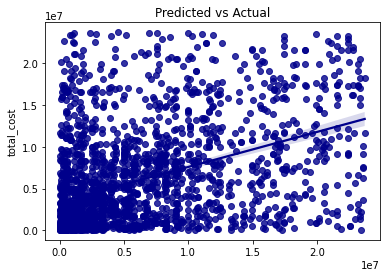

            Actual     Predicted     Residuals     Diff_in_%
2625  1.000000e+06  1.000000e+06  0.000000e+00      0.000000
2106  6.630000e+05  6.630000e+05  0.000000e+00      0.000000
345   3.315000e+06  3.315000e+06  0.000000e+00      0.000000
2073  5.690100e+04  5.690100e+04  0.000000e+00      0.000000
3259  4.972500e+06  4.972500e+06  0.000000e+00      0.000000
96    6.630000e+05  6.630000e+05  0.000000e+00      0.000000
1851  8.287500e+05  8.287500e+05  0.000000e+00      0.000000
1849  1.657500e+06  1.657500e+06  0.000000e+00      0.000000
1193  1.657500e+06  1.657500e+06  0.000000e+00      0.000000
1351  1.300000e+05  1.300000e+05  0.000000e+00      0.000000
290   5.690100e+04  5.690100e+04  0.000000e+00      0.000000
3267  3.149250e+06  3.149250e+06  0.000000e+00      0.000000
1198  5.337150e+06  5.337150e+06  0.000000e+00      0.000000
2441  1.657500e+06  1.657500e+06  0.000000e+00      0.000000
2970  3.315000e+05  3.315000e+05  0.000000e+00      0.000000
946   2.486250e+06  2.48

In [185]:
tree_0 = DecisionTreeRegressor()

dec_tree_0, metrics_table_0 = regression_model_0(tree_0)

In [186]:
metrics_table_0.index = ['Decision_Tree_0']
metrics_table_0

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Decision_Tree_0,4.363613e+06,4.212045e+13,6.475439e+06,-0.202511,-0.235649


# RIDGE

Train_Mean_absolute_error --- 3346425.4837127794
Train_Mean_squared_error --- 21526435885566.277
Train_Root_mean_squared_error --- 4636059.622760486
Standard deviation of dependent variable --- 5974335.276799099
Train_R2_score --- 0.3946945004929773
Train_Adjusted_r2 --- 0.3780139659432742




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

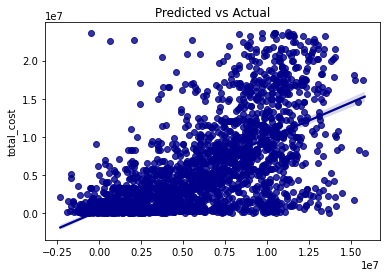

            Actual     Predicted     Residuals     Diff_in_%
2574  1.060800e+07  1.058399e+07  2.401214e+04      0.226359
3273  1.160250e+07  1.157476e+07  2.774229e+04      0.239106
1537  2.605500e+06  2.595979e+06  9.520761e+03      0.365410
1702  3.315000e+06  3.328499e+06 -1.349890e+04      0.407207
620   8.287500e+05  8.247356e+05  4.014422e+03      0.484395
2659  1.055238e+07  1.050056e+07  5.182811e+04      0.491151
2610  8.784750e+06  8.831033e+06 -4.628336e+04      0.526860
2554  1.657500e+06  1.666743e+06 -9.243040e+03      0.557649
2839  8.834475e+06  8.885047e+06 -5.057183e+04      0.572437
2404  1.027650e+07  1.034071e+07 -6.420663e+04      0.624791
1014  1.226550e+07  1.234353e+07 -7.803111e+04      0.636184
1985  1.209975e+07  1.201013e+07  8.962395e+04      0.740709
2438  7.293000e+06  7.350379e+06 -5.737871e+04      0.786764
434   9.613500e+06  9.693960e+06 -8.046015e+04      0.836950
2498  8.668841e+06  8.595786e+06  7.305505e+04      0.842732
515   1.060800e+07  1.05

In [187]:
rid_0 = Ridge()
ridr_0, metrics_table_0a = regression_model_0(rid_0)

In [188]:
metrics_table_0a.index = ['Ridge_0']
metrics_table_0a

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Ridge_0,3.346425e+06,2.152644e+13,4.636060e+06,0.394695,0.378014


# KNN

Train_Mean_absolute_error --- 3416525.412824791
Train_Mean_squared_error --- 24513609081430.98
Train_Root_mean_squared_error --- 4947772.139045872
Standard deviation of dependent variable --- 5974335.276799099
Train_R2_score --- 0.31114853147720956
Train_Adjusted_r2 --- 0.29216570259218166




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

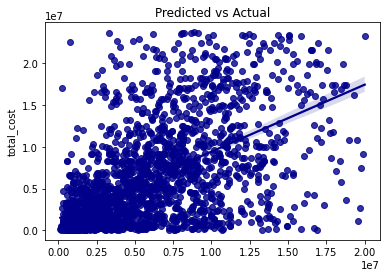

            Actual     Predicted     Residuals     Diff_in_%
2869  6.961500e+06  6.962780e+06 -1.279800e+03      0.018384
2422  7.541625e+06  7.548690e+06 -7.065500e+03      0.093687
2363  8.535150e+06  8.521110e+06  1.404000e+04      0.164496
1589  4.011150e+06  4.004188e+06  6.961500e+03      0.173554
2554  1.657500e+06  1.654185e+06  3.315000e+03      0.200000
2767  1.130000e+07  1.124974e+07  5.025500e+04      0.444735
2659  1.055238e+07  1.050391e+07  4.847550e+04      0.459380
452   6.298500e+06  6.266875e+06  3.162510e+04      0.502105
2932  4.972500e+06  4.947190e+06  2.531003e+04      0.509000
1134  1.656611e+07  1.645364e+07  1.124720e+05      0.678928
1010  5.690100e+06  5.649154e+06  4.094580e+04      0.719597
3437  7.831463e+06  7.768733e+06  6.272998e+04      0.801000
2181  1.633918e+07  1.620806e+07  1.311182e+05      0.802477
2589  2.900625e+06  2.925488e+06 -2.486250e+04      0.857143
595   4.116000e+05  4.076150e+05  3.985000e+03      0.968173
3414  7.852338e+06  7.77

In [189]:
knn_0 = KNeighborsRegressor()

knnr_0, metrics_table_0b = regression_model_0(knn_0)

In [190]:
metrics_table_0b.index = ['KNN_0']
metrics_table_0b

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
KNN_0,3.416525e+06,2.451361e+13,4.947772e+06,0.311149,0.292166


# RANDOM FOREST

Train_Mean_absolute_error --- 3272127.474649507
Train_Mean_squared_error --- 22151888720754.957
Train_Root_mean_squared_error --- 4712724.781774977
Standard deviation of dependent variable --- 5974335.276799099
Train_R2_score --- 0.3797756957293892
Train_Adjusted_r2 --- 0.36268404045056346




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

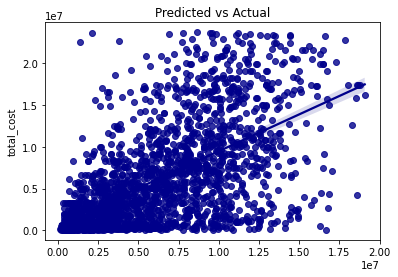

            Actual     Predicted     Residuals     Diff_in_%
3302  1.611224e+07  1.609518e+07  1.706122e+04      0.105890
2301  9.304253e+06  9.318434e+06 -1.418110e+04      0.152415
327   7.839975e+06  7.852604e+06 -1.262866e+04      0.161080
2369  1.077375e+07  1.075595e+07  1.779820e+04      0.165200
2649  1.160250e+07  1.158153e+07  2.097060e+04      0.180742
729   3.315000e+06  3.308545e+06  6.455285e+03      0.194730
3013  7.293000e+06  7.277718e+06  1.528219e+04      0.209546
111   5.337150e+06  5.349194e+06 -1.204419e+04      0.225667
305   3.095366e+06  3.085650e+06  9.715792e+03      0.313882
1062  1.326000e+07  1.330404e+07 -4.403783e+04      0.332110
1456  5.129962e+06  5.149158e+06 -1.919583e+04      0.374191
2831  7.458750e+05  7.489698e+05 -3.094800e+03      0.414922
2464  7.649362e+06  7.686946e+06 -3.758332e+04      0.491326
2717  1.870240e+06  1.859823e+06  1.041713e+04      0.556994
1312  2.143000e+06  2.129706e+06  1.329448e+04      0.620368
3121  7.740525e+06  7.79

In [191]:
rf_0 = RandomForestRegressor()

rfr_0, metrics_table_0c = regression_model_0(rf_0)

In [192]:
metrics_table_0c.index = ['Random_Forest_0']
metrics_table_0c

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Random_Forest_0,3.272127e+06,2.215189e+13,4.712725e+06,0.379776,0.362684


# EXTRA TREES

Train_Mean_absolute_error --- 3620659.406545258
Train_Mean_squared_error --- 28357605431984.285
Train_Root_mean_squared_error --- 5321188.288961301
Standard deviation of dependent variable --- 5974335.276799099
Train_R2_score --- 0.19489584149046033
Train_Adjusted_r2 --- 0.17270941208734836




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

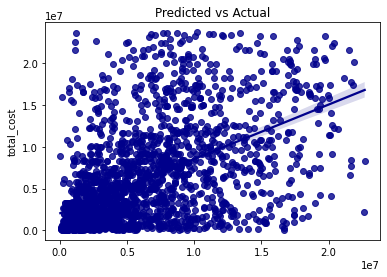

            Actual     Predicted     Residuals     Diff_in_%
111   5.337150e+06  5.337150e+06  0.000000e+00      0.000000
1198  5.337150e+06  5.337150e+06  0.000000e+00      0.000000
2649  1.160250e+07  1.160711e+07 -4.614820e+03      0.039774
2970  3.315000e+05  3.317892e+05 -2.892500e+02      0.087255
3121  7.740525e+06  7.728094e+06  1.243125e+04      0.160600
700   2.154750e+07  2.151269e+07  3.480750e+04      0.161538
1184  1.146012e+07  1.143811e+07  2.201031e+04      0.192060
106   1.657500e+07  1.660975e+07 -3.475084e+04      0.209658
1100  1.238152e+07  1.235472e+07  2.680444e+04      0.216487
1424  1.624350e+07  1.629442e+07 -5.092367e+04      0.313502
295   1.160250e+06  1.164125e+06 -3.875000e+03      0.333980
1454  3.513900e+06  3.501503e+06  1.239729e+04      0.352807
3440  6.464250e+06  6.440673e+06  2.357689e+04      0.364727
1351  1.300000e+05  1.306064e+05 -6.063500e+02      0.466423
2385  6.630000e+06  6.662733e+06 -3.273320e+04      0.493713
100   1.657500e+06  1.64

In [193]:
ext_0 = ExtraTreesRegressor()

extr_0, metrics_table_0d = regression_model_0(ext_0)

In [194]:
metrics_table_0d.index = ['Extra_Trees_0']
metrics_table_0d

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Extra_Trees_0,3.620659e+06,2.835761e+13,5.321188e+06,0.194896,0.172709


# XGBOOST

In [195]:
import xgboost as xgb

Train_Mean_absolute_error --- 3500325.8444454498
Train_Mean_squared_error --- 25512901793355.844
Train_Root_mean_squared_error --- 5043750.902487047
Standard deviation of dependent variable --- 5974335.276799099
Train_R2_score --- 0.28454505537442576
Train_Adjusted_r2 --- 0.26482910874532306




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

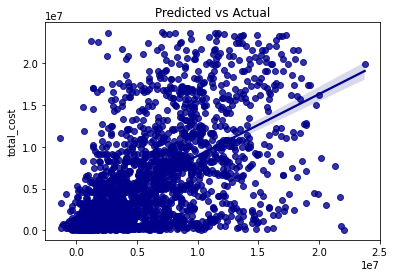

            Actual     Predicted     Residuals     Diff_in_%
620   8.287500e+05  8.293937e+05 -6.436875e+02      0.077670
424   5.138250e+06  5.133852e+06  4.397500e+03      0.085584
269   1.134665e+07  1.137974e+07 -3.308500e+04      0.291584
2266  7.127250e+06  7.105104e+06  2.214650e+04      0.310730
3453  6.807990e+06  6.831580e+06 -2.358950e+04      0.346497
1865  1.060800e+07  1.064713e+07 -3.913300e+04      0.368901
3268  1.021198e+07  1.025419e+07 -4.220400e+04      0.413279
940   3.646500e+06  3.664988e+06 -1.848825e+04      0.507014
2349  8.287500e+06  8.241766e+06  4.573450e+04      0.551849
2505  4.972500e+06  5.003148e+06 -3.064850e+04      0.616360
2106  6.630000e+05  6.586607e+05  4.339312e+03      0.654497
972   9.779250e+06  9.713718e+06  6.553200e+04      0.670113
1093  1.939275e+06  1.952496e+06 -1.322125e+04      0.681763
782   7.774725e+06  7.721593e+06  5.313158e+04      0.683389
2133  2.900625e+06  2.920559e+06 -1.993375e+04      0.687223
2957  3.315000e+06  3.29

In [196]:
xgb_0 = xgb.XGBRegressor()

xgbr_0, metrics_table_0e = regression_model_0(xgb_0)

In [197]:
metrics_table_0e.index = ['Xgboost_0']
metrics_table_0e

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Xgboost_0,3.500326e+06,2.551290e+13,5.043751e+06,0.284545,0.264829


# EXPERIMENT 1: FEATURE ENGINEERING

 - Encoding : Target Encoding
 - Outliers: Winsorization
 - Null values: Mean/Median/Mode imputation
 - Linearity/Transformation/Scaling: Log Transformation
 - Feature selection method: Tree-based Feature selection

In [198]:
train_1 = train.copy()

In [199]:
train_1.head(2)

,country,age_group,travel_with,total_female,total_male,purpose,main_activity,info_source,tour_arrangement,package_transport_int,package_accomodation,package_food,package_transport_tz,package_sightseeing,package_guided_tour,package_insurance,night_mainland,night_zanzibar,payment_mode,first_trip_tz,most_impressing,total_cost
0,ZAMBIA,45-64,Friends/Relatives,0.0,1.0,Business,Beach tourism,"Friends, relatives",Independent,No,No,No,No,No,No,No,3.0,0.0,Cash,No,"Wonderful Country, Landscape, Nature",50000.0
1,ZIMBABWE,1-24,Alone,1.0,0.0,Meetings and Conference,Beach tourism,"Friends, relatives",Independent,No,No,No,No,No,No,No,2.0,0.0,Cash,Yes,Wildlife,497250.0


In [200]:
#mean/median/mode imputation
for i in ['travel_with','total_female','total_male','most_impressing']:
    mode = train_1[i].mode()[0]
    
    train_1[i] = train_1[i].fillna(mode)

#Mean encoding or Target encoding implies replacing the categories with average target value for that category. Target encoding, also known as mean encoding, is a technique used to encode categorical variables with a numerical value, by replacing each category with the mean of the target variable for that category.

In [201]:
for i in train_1.select_dtypes('O').columns:
    labels = train_1.groupby(i)['total_cost'].mean().to_dict()
    
    train_1[i] = train_1[i].map(labels)
    #test[i] = test[i].map(labels)
    

In [202]:
train_1.head()

,country,age_group,travel_with,total_female,total_male,purpose,main_activity,info_source,tour_arrangement,package_transport_int,package_accomodation,package_food,package_transport_tz,package_sightseeing,package_guided_tour,package_insurance,night_mainland,night_zanzibar,payment_mode,first_trip_tz,most_impressing,total_cost
0,1.426942e+06,1.141817e+07,1.049116e+07,0.0,1.0,1.878852e+06,7.458268e+06,4.263611e+06,2.781409e+06,4.760011e+06,2.936973e+06,3.514139e+06,3.926546e+06,4.984393e+06,5.059134e+06,6.853909e+06,3.0,0.0,7.728271e+06,4.119553e+06,7.894919e+06,50000.0
1,1.120926e+06,5.864593e+06,3.639780e+06,1.0,0.0,2.415203e+06,7.458268e+06,4.263611e+06,2.781409e+06,4.760011e+06,2.936973e+06,3.514139e+06,3.926546e+06,4.984393e+06,5.059134e+06,6.853909e+06,2.0,0.0,7.728271e+06,1.026474e+07,1.134379e+07,497250.0
2,1.340388e+07,5.878170e+06,3.639780e+06,1.0,1.0,1.218059e+07,1.086673e+07,6.500071e+06,2.781409e+06,4.760011e+06,2.936973e+06,3.514139e+06,3.926546e+06,4.984393e+06,5.059134e+06,6.853909e+06,11.0,0.0,7.728271e+06,1.026474e+07,8.683368e+06,6630000.0
3,8.622660e+06,5.878170e+06,1.288867e+07,1.0,1.0,1.218059e+07,1.074548e+07,1.344549e+07,1.453626e+07,4.760011e+06,1.454415e+07,1.460679e+07,1.502642e+07,1.572669e+07,1.500841e+07,1.596934e+07,9.0,0.0,7.728271e+06,4.119553e+06,7.269446e+06,11602500.0
4,1.686815e+06,1.141817e+07,3.639780e+06,1.0,0.0,1.218059e+07,1.883481e+06,4.402800e+06,1.453626e+07,4.760011e+06,1.454415e+07,1.460679e+07,3.926546e+06,4.984393e+06,1.500841e+07,6.853909e+06,3.0,0.0,7.728271e+06,1.026474e+07,8.683368e+06,232050.0


In [203]:
xtrain_1 = train_1.drop(['total_cost'],axis=1)
ytrain_1 = train_1['total_cost']

In [204]:
#log transformation
xtrain_1 = np.log1p(xtrain_1)

#winsorization
This is process of replacing the outliers with another value, in order to bring the outliers closer to the mean of the distribution. A typical strategy involoves seting the outliers to a specified percentile.
For example at 90% winsorization, we replace the values below the 5th percentile with the value of the 5th percentile and we replace values above 95th percentile with the value at the 95th percentile.

In [205]:
def winsorize(data, column):
    """at 90% winsorization"""
    upper_limit = data[column].quantile(0.95)
    lower_limit = data[column].quantile(0.05)
    
    return np.where(data[column]>upper_limit, upper_limit, np.where(data[column]<lower_limit, lower_limit, data[column]))

In [206]:
for i in xtrain_1.columns:
    xtrain_1[i] = winsorize(xtrain_1, i)

In [207]:
xtrain_1.head()

,country,age_group,travel_with,total_female,total_male,purpose,main_activity,info_source,tour_arrangement,package_transport_int,package_accomodation,package_food,package_transport_tz,package_sightseeing,package_guided_tour,package_insurance,night_mainland,night_zanzibar,payment_mode,first_trip_tz,most_impressing
0,14.171045,16.250716,16.166043,0.000000,0.693147,14.446172,15.824834,15.265627,14.838468,15.375761,14.89289,15.072306,15.183271,15.421822,15.436706,15.740330,1.386294,0.0,15.860396,15.231256,15.881730
1,13.929666,15.584444,15.107434,0.693147,0.000000,14.697294,15.824834,15.265627,14.838468,15.375761,14.89289,15.072306,15.183271,15.421822,15.436706,15.740330,1.098612,0.0,15.860396,16.144225,16.244181
2,16.411055,15.586756,15.107434,0.693147,0.693147,16.315354,16.201216,15.687324,14.838468,15.375761,14.89289,15.072306,15.183271,15.421822,15.436706,15.740330,2.484907,0.0,15.860396,16.144225,15.976920
3,15.969904,15.586756,16.371859,0.693147,0.693147,16.315354,16.189996,16.414154,16.492157,15.375761,16.49270,16.496997,16.525320,16.570870,16.524121,16.586181,2.302585,0.0,15.860396,15.231256,15.799191
4,14.338353,16.250716,15.107434,0.693147,0.000000,16.315354,14.448633,15.297752,16.492157,15.375761,16.49270,16.496997,15.183271,15.421822,16.524121,15.740330,1.386294,0.0,15.860396,16.144225,15.976920


<IPython.core.display.Javascript object>

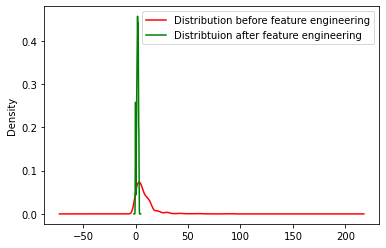

In [208]:
train['night_mainland'].plot.kde(color='red', label = 'Distribution before feature engineering')
xtrain_1['night_mainland'].plot.kde(color='green',label = 'Distribtuion after feature engineering')
plt.legend()

In [209]:
rf = RandomForestRegressor().fit(xtrain_1, ytrain_1)
feat = pd.DataFrame(rf.feature_importances_, index = xtrain_1.columns, columns = ['Feature_importance']).sort_values(by='Feature_importance')
feat

,Feature_importance
package_food,0.006758
package_guided_tour,0.012568
package_sightseeing,0.012637
package_transport_tz,0.014309
package_accomodation,0.016458
purpose,0.016803
first_trip_tz,0.018324
package_transport_int,0.019218
package_insurance,0.019795
payment_mode,0.020050


In [210]:
xtrain_1 = xtrain_1[feat[feat['Feature_importance']>=0.02].index]

# MODEL BUILDING

In [211]:
def regression_model_1(model):
    kfold = KFold(n_splits=4)
    
    mae = -cross_val_score(model, xtrain_1, ytrain_1, cv=kfold, scoring='neg_mean_absolute_error').mean()
    mse = -cross_val_score(model, xtrain_1, ytrain_1, cv=kfold, scoring='neg_mean_squared_error').mean()

    r2 = cross_val_score(model,xtrain_1, ytrain_1, cv=kfold, scoring='r2').mean()
    rmse = np.sqrt(-cross_val_score(model,xtrain_1, ytrain_1, cv=kfold, scoring='neg_mean_squared_error')).mean()

    std = np.std(ytrain_1)

    n=xtrain_1.shape[0]
    p=xtrain_1.shape[1]

    adjusted_r2 = 1 - (1-r2) *(n-1)/(n-p-1)

    print('Train_Mean_absolute_error','---',mae)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',rmse)
    print('Standard deviation of dependent variable','---',std)

    print('Train_R2_score','---',r2)
    print('Train_Adjusted_r2','---',adjusted_r2)
    print()
    print()
    
    ypred = cross_val_predict(model, xtrain_1, ytrain_1, cv=kfold)
    
    sns.regplot(x = ypred, y = ytrain_1, color = 'darkblue')
    plt.title('Predicted vs Actual')
    plt.show();
    
    stats = pd.DataFrame(columns = ['Actual', 'Predicted', 'Residuals', 'Diff_in_%'])
    
    stats['Actual'] = ytrain_1
    stats['Predicted'] = ypred
    stats['Residuals'] =  stats['Actual'] - stats['Predicted']
    stats['Diff_in_%'] = abs((stats['Residuals']/stats['Actual'])*100)
    
    print(stats.sort_values(by='Diff_in_%'))
    
    metrics_table =  pd.DataFrame({'Mean Absolute Error': mae,
                                   'Mean Squared Error':mse,
                                   'Root Mean Squared Error': rmse,
                                   'R2':r2,
                                   'Adjusted R2':adjusted_r2}, index = ['Model'])
    return model, metrics_table    

# DECISION TREE

Train_Mean_absolute_error --- 7459435.521011395
Train_Mean_squared_error --- 207579476012293.8
Train_Root_mean_squared_error --- 14483287.821559392
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- -0.34588999273596227
Train_Adjusted_r2 --- -0.35055781930036445




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

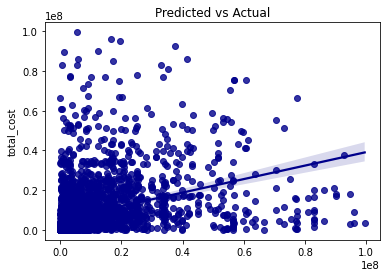

            Actual     Predicted     Residuals      Diff_in_%
1536  8.287500e+06  8.287500e+06  0.000000e+00       0.000000
1198  5.337150e+06  5.337150e+06  0.000000e+00       0.000000
1235  4.972500e+06  4.972500e+06  0.000000e+00       0.000000
1520  8.287500e+05  8.287500e+05  0.000000e+00       0.000000
838   1.657500e+07  1.657500e+07  0.000000e+00       0.000000
2646  4.972500e+05  4.972500e+05  0.000000e+00       0.000000
2670  2.269330e+06  2.269330e+06  0.000000e+00       0.000000
2682  1.000000e+05  1.000000e+05  0.000000e+00       0.000000
311   1.500000e+05  1.500000e+05  0.000000e+00       0.000000
3402  1.160250e+06  1.160250e+06  0.000000e+00       0.000000
787   4.000000e+05  4.000000e+05  0.000000e+00       0.000000
3239  1.300000e+05  1.300000e+05  0.000000e+00       0.000000
2734  3.315000e+06  3.315000e+06  0.000000e+00       0.000000
2069  1.657500e+06  1.657500e+06  0.000000e+00       0.000000
2745  6.630000e+05  6.630000e+05  0.000000e+00       0.000000
329   3.

In [212]:
tree_1 = DecisionTreeRegressor()

dec_tree_1, metrics_table_1 = regression_model_1(tree_1)

In [213]:
metrics_table_1.index = ['Decision_Tree_1']
metrics_table_1

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Decision_Tree_1,7.459436e+06,2.075795e+14,1.448329e+07,-0.34589,-0.350558


# RIDGE

Train_Mean_absolute_error --- 5984134.165761391
Train_Mean_squared_error --- 105927091956149.16
Train_Root_mean_squared_error --- 10271601.149291456
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.33814322888502907
Train_Adjusted_r2 --- 0.33584777187538173




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

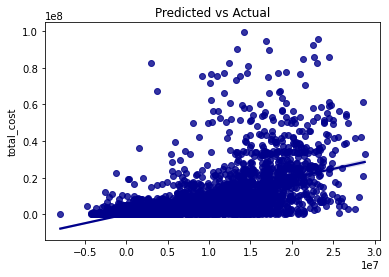

            Actual     Predicted     Residuals     Diff_in_%
3299  1.417761e+07  1.419167e+07 -1.406297e+04      0.099191
599   1.906125e+07  1.908284e+07 -2.158833e+04      0.113258
580   1.679304e+07  1.682381e+07 -3.076631e+04      0.183209
149   2.005575e+07  2.010622e+07 -5.047008e+04      0.251649
3007  1.160250e+07  1.163211e+07 -2.960906e+04      0.255196
2190  5.304000e+06  5.318325e+06 -1.432493e+04      0.270078
406   4.972500e+06  4.959058e+06  1.344245e+04      0.270336
888   3.315000e+06  3.324191e+06 -9.190664e+03      0.277245
2163  1.989000e+07  1.981416e+07  7.584288e+04      0.381312
163   1.823250e+07  1.831304e+07 -8.054469e+04      0.441764
2983  8.287500e+05  8.324382e+05 -3.688186e+03      0.445030
2533  1.243125e+07  1.248948e+07 -5.823279e+04      0.468439
1243  1.528215e+07  1.520717e+07  7.498300e+04      0.490657
1982  1.200000e+06  1.194005e+06  5.995221e+03      0.499602
33    1.657500e+06  1.666112e+06 -8.612316e+03      0.519597
3466  9.706000e+06  9.65

In [214]:
rid_1 = Ridge()
ridr_1, metrics_table_1a = regression_model_1(rid_1)

In [215]:
metrics_table_1a.index = ['Ridge_1']
metrics_table_1a

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Ridge_1,5.984134e+06,1.059271e+14,1.027160e+07,0.338143,0.335848


# KNN

Train_Mean_absolute_error --- 5555138.850630777
Train_Mean_squared_error --- 112854305882812.36
Train_Root_mean_squared_error --- 10593223.127143959
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.2963080516482517
Train_Adjusted_r2 --- 0.29386750153836116




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

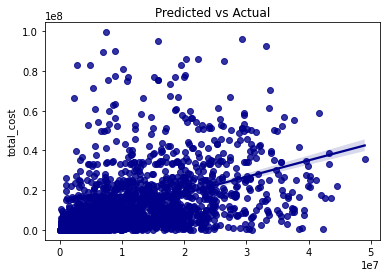

            Actual     Predicted     Residuals     Diff_in_%
1702  3.315000e+06  3.315000e+06  0.000000e+00      0.000000
306   1.160250e+07  1.160792e+07 -5.419000e+03      0.046705
2715  7.044375e+06  7.049640e+06 -5.265000e+03      0.074740
2454  1.906125e+07  1.904690e+07  1.434800e+04      0.075273
2382  9.077320e+06  9.084436e+06 -7.116200e+03      0.078395
1061  9.077320e+06  9.069952e+06  7.367800e+03      0.081167
1507  4.832256e+05  4.840482e+05 -8.226000e+02      0.170231
1726  2.845050e+06  2.839785e+06  5.265000e+03      0.185058
3021  2.845050e+06  2.851999e+06 -6.949000e+03      0.244249
2232  1.740375e+07  1.745348e+07 -4.972500e+04      0.285714
552   1.657500e+06  1.663818e+06 -6.318000e+03      0.381176
989   2.544262e+07  2.554853e+07 -1.059066e+05      0.416257
2313  3.734348e+06  3.718274e+06  1.607370e+04      0.430429
1899  4.309500e+06  4.328126e+06 -1.862640e+04      0.432217
1784  4.309500e+06  4.328126e+06 -1.862640e+04      0.432217
2829  2.013862e+07  2.02

In [216]:
knn_1 = KNeighborsRegressor()

knnr_1, metrics_table_1b = regression_model_1(knn_1)

In [217]:
metrics_table_1b.index = ['KNN_1']
metrics_table_1b

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
KNN_1,5.555139e+06,1.128543e+14,1.059322e+07,0.296308,0.293868


# RANDOM FOREST

Train_Mean_absolute_error --- 5589722.563509049
Train_Mean_squared_error --- 108642077298759.75
Train_Root_mean_squared_error --- 10547317.911760386
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.30842459324101135
Train_Adjusted_r2 --- 0.3060260658187258




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

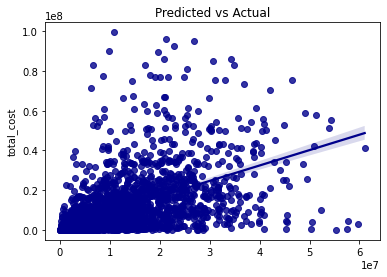

            Actual     Predicted     Residuals     Diff_in_%
2466  5.138250e+06  5.138012e+06  2.375750e+02      0.004624
979   7.453778e+06  7.455690e+06 -1.912715e+03      0.025661
3142  4.839900e+06  4.842992e+06 -3.092273e+03      0.063891
44    2.486250e+06  2.488919e+06 -2.668630e+03      0.107336
2505  4.972500e+06  4.967149e+06  5.351228e+03      0.107616
502   1.277427e+07  1.278894e+07 -1.466718e+04      0.114818
2027  6.807990e+06  6.799249e+06  8.741155e+03      0.128396
3156  7.942655e+06  7.953865e+06 -1.121047e+04      0.141143
2335  1.887600e+05  1.884096e+05  3.503580e+02      0.185610
3470  6.807990e+06  6.791161e+06  1.682889e+04      0.247193
1621  1.657500e+06  1.653085e+06  4.415365e+03      0.266387
1509  2.013862e+06  2.020522e+06 -6.659812e+03      0.330698
801   3.315000e+06  3.303585e+06  1.141504e+04      0.344345
1959  3.480750e+06  3.466523e+06  1.422686e+04      0.408730
495   2.677993e+07  2.666966e+07  1.102661e+05      0.411749
3119  6.630000e+06  6.66

In [218]:
rf_1 = RandomForestRegressor()

rfr_1, metrics_table_1c = regression_model_1(rf_1)

In [219]:
metrics_table_1c.index = ['Random_Forest_1']
metrics_table_1c

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Random_Forest_1,5.589723e+06,1.086421e+14,1.054732e+07,0.308425,0.306026


# EXTRA TREES

Train_Mean_absolute_error --- 5823893.54530449
Train_Mean_squared_error --- 123544326736833.98
Train_Root_mean_squared_error --- 11125840.00098031
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.2190851105607897
Train_Adjusted_r2 --- 0.2163767352216942




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

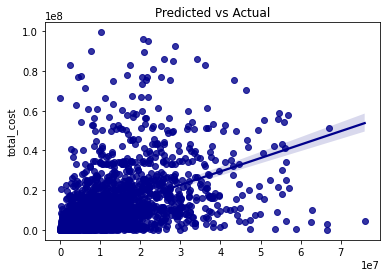

            Actual     Predicted     Residuals      Diff_in_%
1351  1.300000e+05  1.300000e+05  0.000000e+00       0.000000
3410  2.229338e+07  2.229338e+07  0.000000e+00       0.000000
2983  8.287500e+05  8.287500e+05  0.000000e+00       0.000000
2331  3.149250e+05  3.149250e+05  0.000000e+00       0.000000
620   8.287500e+05  8.287500e+05  0.000000e+00       0.000000
1440  2.229338e+07  2.229338e+07  0.000000e+00       0.000000
1898  1.315000e+05  1.315000e+05  0.000000e+00       0.000000
1198  5.337150e+06  5.337150e+06  0.000000e+00       0.000000
2506  1.300000e+05  1.300000e+05  0.000000e+00       0.000000
2012  5.304000e+06  5.304000e+06  0.000000e+00       0.000000
3226  1.500000e+05  1.500000e+05  0.000000e+00       0.000000
311   1.500000e+05  1.500000e+05  0.000000e+00       0.000000
3469  1.315000e+05  1.315000e+05  0.000000e+00       0.000000
1301  5.304000e+06  5.304000e+06  0.000000e+00       0.000000
111   5.337150e+06  5.337150e+06  0.000000e+00       0.000000
556   6.

In [220]:
ext_1 = ExtraTreesRegressor()

extr_1, metrics_table_1d = regression_model_1(ext_1)

In [221]:
metrics_table_1d.index = ['Extra_Trees_1']
metrics_table_1d

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Extra_Trees_1,5.823894e+06,1.235443e+14,1.112584e+07,0.219085,0.216377


# XGBOOST

In [222]:
import xgboost

Train_Mean_absolute_error --- 5942697.282911854
Train_Mean_squared_error --- 119898924895283.66
Train_Root_mean_squared_error --- 10931859.212872762
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.24940660017125757
Train_Adjusted_r2 --- 0.24680338606780527




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

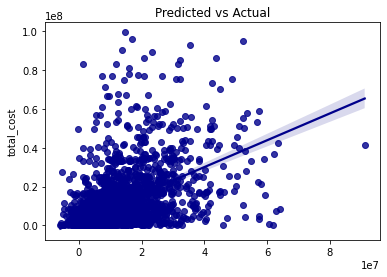

            Actual     Predicted     Residuals     Diff_in_%
3122  1.657500e+06  1.657626e+06 -1.261250e+02      0.007609
26    3.480750e+06  3.480030e+06  7.195000e+02      0.020671
1013  1.723800e+07  1.724785e+07 -9.854000e+03      0.057164
2838  1.670000e+05  1.666112e+05  3.888125e+02      0.232822
2487  8.287500e+05  8.263892e+05  2.360750e+03      0.284857
336   2.652000e+06  2.659862e+06 -7.862500e+03      0.296474
3156  7.942655e+06  7.967311e+06 -2.465600e+04      0.310425
1465  9.945000e+06  9.980581e+06 -3.558100e+04      0.357778
1216  6.523000e+06  6.498315e+06  2.468500e+04      0.378430
3098  1.491750e+07  1.498417e+07 -6.666900e+04      0.446918
1372  4.523630e+06  4.502658e+06  2.097150e+04      0.463599
180   2.246637e+07  2.236211e+07  1.042590e+05      0.464067
2543  1.452371e+07  1.459636e+07 -7.264400e+04      0.500175
168   7.458750e+06  7.417047e+06  4.170300e+04      0.559115
2789  5.138250e+07  5.108881e+07  2.936920e+05      0.571580
1434  6.259110e+06  6.29

In [223]:
xgb_1 = xgboost.XGBRegressor()

xgbr_1, metrics_table_1e = regression_model_1(xgb_1)

In [224]:
metrics_table_1e.index = ['Xgboost_1']
metrics_table_1e

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Xgboost_1,5.942697e+06,1.198989e+14,1.093186e+07,0.249407,0.246803


# EXPERIMENT 2: FEATURE ENGINEERING

 - Encoding : Replacing categorical variable with the frequency of observations
 - Outliers: Winsorization
 - Null values: Bayesian imputation
 - Linearity/Transformation/Scaling: Sqrt Transformation
 - Feature selection method: RFE

In [225]:
train_2 = train.copy()

In [226]:
xtrain_2 = train_2.drop(['total_cost'], axis=1)
ytrain_2 = train_2['total_cost']

REPLACING CATEGORIES WITH COUNTS OR FREQUENCY OF OBSERVATION


In count or frequency observation, we replace categories with the count or precentage of observation in that category. For example, lets say we have a gender variable with 50 females, females will be replaced with 50. This technique captures the representation of each label in a dataset and are very popular in data science competitions.

In [227]:
for i in xtrain_2.select_dtypes('O').columns:
    labels = xtrain_2[i].value_counts(normalize=True).to_dict()
    xtrain_2[i]=xtrain_2[i].map(labels)

REPLACING MISSING VALUES WITH THE VALUES AT THE END OF DISTRIBUTION


This is similar to arbitrary imputation but instead of identifying the values manually, we automatically detect them by selecting those values at the end of the distribution. These values are estimated using mean +/- 3 * std if they are normally distributed or IQR proximity rule if otherwise. According to IQR proximity rule, the values wil be replaced by the upper limit(Q3 + (IQR * 1.5)) at the right tail or lower limit(Q1 - (IQR * 1.5)) at the left tail.

Note: This method may distort the original distribution so it may not suitable for linear models

In [228]:
# Bayesian imputation
imputer_bayesian = IterativeImputer(estimator = BayesianRidge(), random_state=0, max_iter =10)

xtrain_2_imptd = imputer_bayesian.fit_transform(xtrain_2)
xtrain_2 = pd.DataFrame(xtrain_2_imptd, columns = xtrain_2.columns)

In [229]:
# sqrt transformation
xtrain_2 = np.sqrt(xtrain_2)

In [230]:
# 98% winsorization
def winsorize_98(data, column):
    upper_limit = data[column].quantile(0.98)
    lower_limit = data[column].quantile(0.02)
    
    return np.where(data[column]>upper_limit,upper_limit,np.where(data[column]<lower_limit,lower_limit, data[column]))

for i in xtrain_2.select_dtypes('number').columns:
    xtrain_2[i] = winsorize_98(xtrain_2, i)

<IPython.core.display.Javascript object>

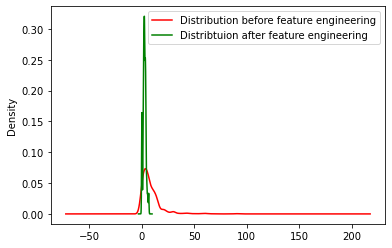

In [231]:
train['night_mainland'].plot.kde(color='red', label = 'Distribution before feature engineering')
xtrain_2['night_mainland'].plot.kde(color='green',label = 'Distribtuion after feature engineering')
plt.legend()

In [232]:
from sklearn.feature_selection import RFE

rfe = RFE(estimator = Lasso(),n_features_to_select=15)
rfe =rfe.fit(xtrain_2, ytrain_2)

In [233]:
xtrain_2 =xtrain_2.loc[:,rfe.support_]

# MODEL BUILDING

In [234]:
def regression_model_2(model):
    kfold = KFold(n_splits=4)
    
    mae = -cross_val_score(model, xtrain_2, ytrain_2, cv=kfold, scoring='neg_mean_absolute_error').mean()
    mse = -cross_val_score(model, xtrain_2, ytrain_2, cv=kfold, scoring='neg_mean_squared_error').mean()

    r2 = cross_val_score(model,xtrain_2, ytrain_2, cv=kfold, scoring='r2').mean()
    rmse = np.sqrt(-cross_val_score(model,xtrain_2, ytrain_2, cv=kfold, scoring='neg_mean_squared_error')).mean()

    std = np.std(ytrain_2)

    n=xtrain_2.shape[0]
    p=xtrain_2.shape[1]

    adjusted_r2 = 1 - (1-r2) *(n-1)/(n-p-1)

    print('Train_Mean_absolute_error','---',mae)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',rmse)
    print('Standard deviation of dependent variable','---',std)

    print('Train_R2_score','---',r2)
    print('Train_Adjusted_r2','---',adjusted_r2)
    print()
    print()
    
    ypred = cross_val_predict(model, xtrain_2, ytrain_2, cv=kfold)
    
    sns.regplot(x = ypred, y = ytrain_2, color = 'darkblue')
    plt.title('Predicted vs Actual')
    plt.show();
    
    stats = pd.DataFrame(columns = ['Actual', 'Predicted', 'Residuals', 'Diff_in_%'])
    
    stats['Actual'] = ytrain_2
    stats['Predicted'] = ypred
    stats['Residuals'] =  stats['Actual'] - stats['Predicted']
    stats['Diff_in_%'] = abs((stats['Residuals']/stats['Actual'])*100)
    
    print(stats.sort_values(by='Diff_in_%'))
    
    metrics_table =  pd.DataFrame({'Mean Absolute Error': mae,
                                   'Mean Squared Error':mse,
                                   'Root Mean Squared Error': rmse,
                                   'R2':r2,
                                   'Adjusted R2':adjusted_r2}, index = ['Model'])
    return model, metrics_table    

# DECISION TREE

Train_Mean_absolute_error --- 7676787.078107838
Train_Mean_squared_error --- 227527551971181.88
Train_Root_mean_squared_error --- 15028618.612143517
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- -0.41505680013611274
Train_Adjusted_r2 --- -0.4211967631103799




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

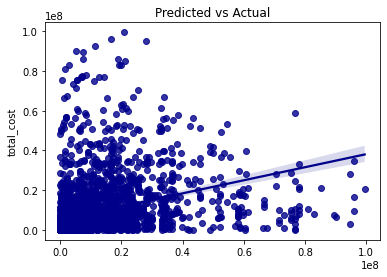

            Actual     Predicted     Residuals     Diff_in_%
2657  3.315000e+06  3.315000e+06  0.000000e+00      0.000000
3304  1.000000e+06  1.000000e+06  0.000000e+00      0.000000
1200  3.315000e+05  3.315000e+05  0.000000e+00      0.000000
1752  3.480750e+06  3.480750e+06  0.000000e+00      0.000000
1259  4.972500e+06  4.972500e+06  0.000000e+00      0.000000
1264  1.500000e+05  1.500000e+05  0.000000e+00      0.000000
100   1.657500e+06  1.657500e+06  0.000000e+00      0.000000
2426  3.315000e+05  3.315000e+05  0.000000e+00      0.000000
96    6.630000e+05  6.630000e+05  0.000000e+00      0.000000
2147  1.989000e+07  1.989000e+07  0.000000e+00      0.000000
2106  6.630000e+05  6.630000e+05  0.000000e+00      0.000000
1651  4.972500e+06  4.972500e+06  0.000000e+00      0.000000
2066  1.657500e+06  1.657500e+06  0.000000e+00      0.000000
3410  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
1440  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
1301  5.304000e+06  5.30

In [235]:
tree_2 = DecisionTreeRegressor()

dec_tree_2, metrics_table_2 = regression_model_2(tree_2)

In [236]:
metrics_table_2.index = ['Decision_Tree_2']
metrics_table_2

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Decision_Tree_2,7.676787e+06,2.275276e+14,1.502862e+07,-0.415057,-0.421197


# RIDGE

Train_Mean_absolute_error --- 5911841.151358971
Train_Mean_squared_error --- 106805223377943.06
Train_Root_mean_squared_error --- 10314477.768290818
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.332481878086495
Train_Adjusted_r2 --- 0.32958550208744875




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

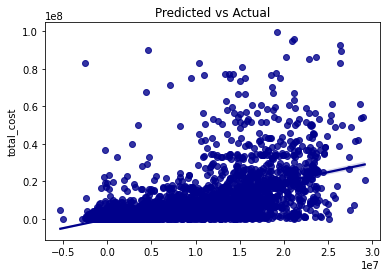

            Actual     Predicted     Residuals     Diff_in_%
1672  2.486250e+06  2.487834e+06 -1.583950e+03      0.063708
1993  2.257056e+06  2.255413e+06  1.643433e+03      0.072813
1366  1.773525e+07  1.775012e+07 -1.486963e+04      0.083842
1079  2.154750e+07  2.152462e+07  2.287667e+04      0.106169
2361  6.630000e+06  6.646946e+06 -1.694635e+04      0.255601
1036  1.698938e+07  1.691474e+07  7.463185e+04      0.439285
3183  1.595178e+07  1.602972e+07 -7.794263e+04      0.488614
2560  1.170195e+07  1.176242e+07 -6.047290e+04      0.516776
2771  1.677390e+07  1.686078e+07 -8.688086e+04      0.517953
1511  1.209975e+07  1.216497e+07 -6.521802e+04      0.539003
3248  1.326000e+07  1.333958e+07 -7.958314e+04      0.600175
3440  6.464250e+06  6.423220e+06  4.102977e+04      0.634718
1866  1.715512e+07  1.704079e+07  1.143379e+05      0.666494
1038  5.801250e+06  5.840067e+06 -3.881720e+04      0.669118
2414  1.160250e+06  1.152384e+06  7.865620e+03      0.677925
2847  6.807990e+06  6.76

In [237]:
rid_2 = Ridge()

ridr_2, metrics_table_2a = regression_model_2(rid_2)

In [238]:
metrics_table_2a.index = ['Ridge_2']
metrics_table_2a

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Ridge_2,5.911841e+06,1.068052e+14,1.031448e+07,0.332482,0.329586


# XGBOOST

Train_Mean_absolute_error --- 6222358.526347319
Train_Mean_squared_error --- 128874666588693.16
Train_Root_mean_squared_error --- 11328803.602229077
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.1919213404464762
Train_Adjusted_r2 --- 0.18841506914381412




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

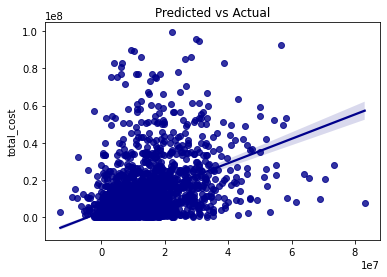

            Actual     Predicted     Residuals     Diff_in_%
2670  2.269330e+06  2.269314e+06  1.550000e+01      0.000683
3411  1.989000e+06  1.991262e+06 -2.262125e+03      0.113732
780   2.652000e+07  2.647744e+07  4.256000e+04      0.160483
622   1.160250e+06  1.162845e+06 -2.595250e+03      0.223680
2048  4.100000e+05  4.088402e+05  1.159781e+03      0.282873
682   3.315000e+06  3.324392e+06 -9.391500e+03      0.283303
652   3.315000e+05  3.305318e+05  9.681875e+02      0.292063
388   1.209975e+06  1.206091e+06  3.884375e+03      0.321029
3295  1.011075e+07  1.014660e+07 -3.585100e+04      0.354583
3337  1.588531e+07  1.594629e+07 -6.098100e+04      0.383883
40    6.961500e+06  6.989612e+06 -2.811250e+04      0.403828
2363  8.535150e+06  8.499152e+06  3.599800e+04      0.421762
2042  1.715512e+07  1.708204e+07  7.308300e+04      0.426013
1832  9.945000e+05  1.000058e+06 -5.558062e+03      0.558880
2537  1.657500e+06  1.647402e+06  1.009762e+04      0.609208
2362  3.327431e+07  3.30

In [240]:
import xgboost as xgb
xgb_2 = xgb.XGBRegressor()

xgbr_2, metrics_table_2e = regression_model_2(xgb_2)

In [241]:
metrics_table_2e.index = ['Xgboost_2']
metrics_table_2e

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Xgboost_2,6.222359e+06,1.288747e+14,1.132880e+07,0.191921,0.188415


# KNN

Train_Mean_absolute_error --- 5939542.505573472
Train_Mean_squared_error --- 122562890561280.25
Train_Root_mean_squared_error --- 11038388.907474207
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.23484519617351482
Train_Adjusted_r2 --- 0.23152517243692317




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

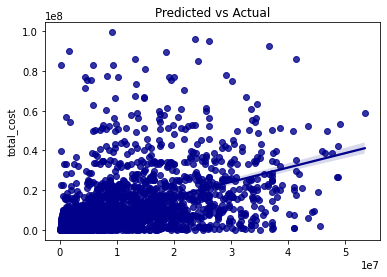

            Actual     Predicted     Residuals     Diff_in_%
255   5.304000e+06  5.308253e+06 -4.252580e+03      0.080177
3251  4.972500e+05  4.968482e+05  4.018000e+02      0.080804
1175  8.701875e+06  8.685739e+06  1.613610e+04      0.185432
378   3.500000e+05  3.508250e+05 -8.250000e+02      0.235714
3088  6.807990e+06  6.828900e+06 -2.091000e+04      0.307139
2664  2.154750e+06  2.147315e+06  7.435000e+03      0.345052
1233  1.747384e+07  1.741355e+07  6.029560e+04      0.345062
383   1.044225e+06  1.048272e+06 -4.047500e+03      0.387608
2732  2.983500e+07  2.995931e+07 -1.243125e+05      0.416667
2950  3.978000e+06  3.994575e+06 -1.657500e+04      0.416667
2886  4.226625e+06  4.245648e+06 -1.902300e+04      0.450075
1726  2.845050e+06  2.858465e+06 -1.341500e+04      0.471521
1359  3.315000e+06  3.298425e+06  1.657500e+04      0.500000
3310  2.008661e+07  1.998244e+07  1.041712e+05      0.518610
3204  4.392375e+06  4.415580e+06 -2.320500e+04      0.528302
3177  4.143750e+06  4.17

In [242]:
knn_2 = KNeighborsRegressor()

knnr_2, metrics_table_2b = regression_model_2(knn_2)

In [243]:
metrics_table_2b.index = ['KNN_2']
metrics_table_2b


,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
KNN_2,5.939543e+06,1.225629e+14,1.103839e+07,0.234845,0.231525


# RANDOM FOREST

Train_Mean_absolute_error --- 6150315.431287231
Train_Mean_squared_error --- 125886992221384.73
Train_Root_mean_squared_error --- 11143626.536137292
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.21722202135240068
Train_Adjusted_r2 --- 0.21382553026772777




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

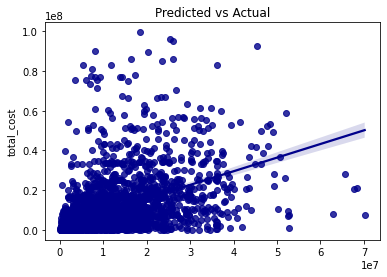

            Actual     Predicted     Residuals     Diff_in_%
1733  8.169588e+06  8.169545e+06  4.336632e+01      0.000531
3100  8.373828e+06  8.380701e+06 -6.873744e+03      0.082086
581   1.657500e+06  1.656067e+06  1.433049e+03      0.086458
2925  1.326000e+07  1.327194e+07 -1.193779e+04      0.090029
1563  1.011075e+07  1.012203e+07 -1.127604e+04      0.111525
3471  6.961500e+06  6.953128e+06  8.371959e+03      0.120261
433   9.945000e+06  9.931732e+06  1.326765e+04      0.133410
506   1.110525e+07  1.108818e+07  1.706513e+04      0.153667
2341  2.237625e+07  2.242086e+07 -4.461361e+04      0.199379
2417  4.907711e+07  4.897441e+07  1.026993e+05      0.209261
2147  1.989000e+07  1.984121e+07  4.879268e+04      0.245313
633   1.160250e+06  1.157173e+06  3.076859e+03      0.265189
898   4.624425e+06  4.607353e+06  1.707225e+04      0.369176
3109  3.754238e+07  3.738773e+07  1.546455e+05      0.411923
2252  8.138325e+05  8.098271e+05  4.005414e+03      0.492167
129   3.149250e+06  3.13

In [244]:
rf_2 = RandomForestRegressor()

rfr_2, metrics_table_2c = regression_model_2(rf_2)

In [245]:
metrics_table_2c.index = ['Random_Forest_2']
metrics_table_2c

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Random_Forest_2,6.150315e+06,1.258870e+14,1.114363e+07,0.217222,0.213826


# EXTRA TREES

Train_Mean_absolute_error --- 6376584.34966009
Train_Mean_squared_error --- 140688250364123.17
Train_Root_mean_squared_error --- 11870132.042932997
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.10958968441376493
Train_Adjusted_r2 --- 0.10572617422175057




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

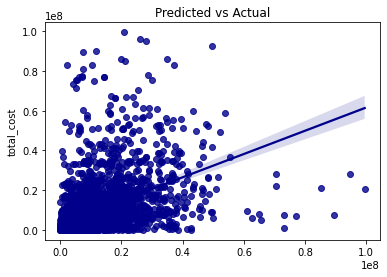

            Actual     Predicted     Residuals     Diff_in_%
1440  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
3226  1.500000e+05  1.500000e+05  0.000000e+00      0.000000
311   1.500000e+05  1.500000e+05  0.000000e+00      0.000000
96    6.630000e+05  6.630000e+05  0.000000e+00      0.000000
2106  6.630000e+05  6.630000e+05  0.000000e+00      0.000000
1264  1.500000e+05  1.500000e+05  0.000000e+00      0.000000
2012  5.304000e+06  5.304000e+06  0.000000e+00      0.000000
1301  5.304000e+06  5.304000e+06  0.000000e+00      0.000000
3410  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
764   2.652000e+07  2.652094e+07 -9.379000e+02      0.003537
2186  1.657500e+05  1.658949e+05 -1.448500e+02      0.087391
1200  3.315000e+05  3.311671e+05  3.329340e+02      0.100433
2546  8.169588e+06  8.158360e+06  1.122820e+04      0.137439
184   1.010000e+05  1.008590e+05  1.410000e+02      0.139604
227   5.500000e+05  5.490000e+05  1.000000e+03      0.181818
2423  5.490000e+05  5.50

In [246]:
ext_2 = ExtraTreesRegressor()

extr_2, metrics_table_2d = regression_model_2(ext_2)

In [247]:
metrics_table_2d.index = ['Extra_Trees_2']
metrics_table_2d

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Extra_Trees_2,6.376584e+06,1.406883e+14,1.187013e+07,0.10959,0.105726


# EXPERIMENT 3: FEATURE ENGINEERING
- Encoding : Label Encoding
- Outliers: Winsorization
- Null values: KNN imputation
- Linearity/Transformation/Scaling: Box-cox Transformation
- Feature selection method: F-regression

In [248]:
train_3 = train.copy()

In [249]:
xtrain_3 = train_3.drop(['total_cost'], axis=1)
ytrain_3 = train_3['total_cost']

In [250]:
for i in xtrain_3.select_dtypes('O').columns:
    le = LabelEncoder()
    xtrain_3[i] = le.fit_transform(xtrain_3[i]) 

In [251]:
imputer_knn = IterativeImputer(estimator = KNeighborsRegressor(), max_iter = 10)
xtrain_3_imptd = imputer_knn.fit_transform(xtrain_3)
xtrain_3 = pd.DataFrame(xtrain_3_imptd, columns =xtrain_3.columns)

In [252]:
#transformation: box-cox
power = PowerTransformer(method = 'yeo-johnson')

xtrain_3 = pd.DataFrame(power.fit_transform(xtrain_3), columns = xtrain_3.columns)

In [253]:
# winsorize at 98%
# 98% winsorization
def winsorize_98(data, column):
    upper_limit = data[column].quantile(0.98)
    lower_limit = data[column].quantile(0.02)
    
    return np.where(data[column]>upper_limit,upper_limit,np.where(data[column]<lower_limit,lower_limit, data[column]))

for i in xtrain_3.select_dtypes('number').columns:
    xtrain_3[i] = winsorize_98(xtrain_3, i)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

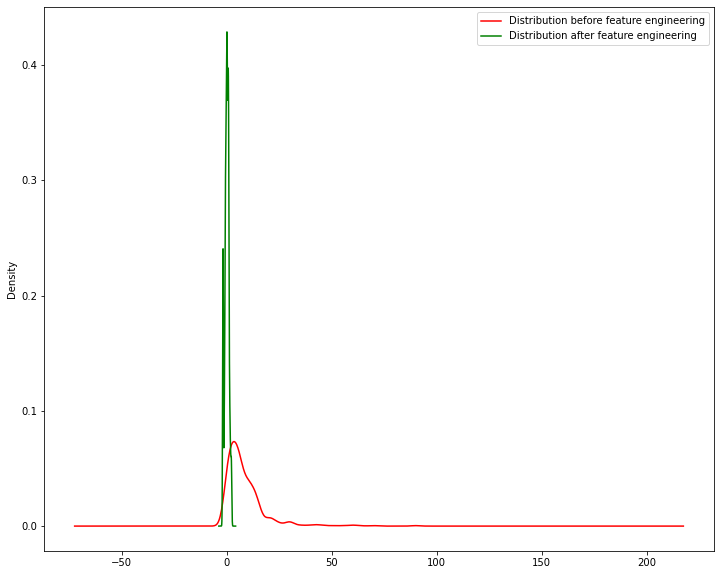

In [254]:
plt.figure(figsize=(12, 10))
train['night_mainland'].plot.kde(color='red', label = 'Distribution before feature engineering')
xtrain_3['night_mainland'].plot.kde(color = 'green', label = ('Distribution after feature engineering'))
plt.legend()

# MODEL BUILDING

In [255]:
def regression_model_3(model):
    kfold = KFold(n_splits=4)
    
    mae = -cross_val_score(model, xtrain_3, ytrain_3, cv=kfold, scoring='neg_mean_absolute_error').mean()
    mse = -cross_val_score(model, xtrain_3, ytrain_3, cv=kfold, scoring='neg_mean_squared_error').mean()

    r2 = cross_val_score(model,xtrain_3, ytrain_3, cv=kfold, scoring='r2').mean()
    rmse = np.sqrt(-cross_val_score(model,xtrain_3, ytrain_3, cv=kfold, scoring='neg_mean_squared_error')).mean()

    std = np.std(ytrain_3)

    n=xtrain_3.shape[0]
    p=xtrain_3.shape[1]

    adjusted_r2 = 1 - (1-r2) *(n-1)/(n-p-1)

    print('Train_Mean_absolute_error','---',mae)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',rmse)
    print('Standard deviation of dependent variable','---',std)

    print('Train_R2_score','---',r2)
    print('Train_Adjusted_r2','---',adjusted_r2)
    print()
    print()
    
    ypred = cross_val_predict(model, xtrain_3, ytrain_3, cv=kfold)
    
    sns.regplot(x = ypred, y = ytrain_3, color = 'darkblue')
    plt.title('Predicted vs Actual')
    plt.show();
    
    stats = pd.DataFrame(columns = ['Actual', 'Predicted', 'Residuals', 'Diff_in_%'])
    
    stats['Actual'] = ytrain_3
    stats['Predicted'] = ypred
    stats['Residuals'] =  stats['Actual'] - stats['Predicted']
    stats['Diff_in_%'] = abs((stats['Residuals']/stats['Actual'])*100)
    
    print(stats.sort_values(by='Diff_in_%'))
    
    metrics_table =  pd.DataFrame({'Mean Absolute Error': mae,
                                   'Mean Squared Error':mse,
                                   'Root Mean Squared Error': rmse,
                                   'R2':r2,
                                   'Adjusted R2':adjusted_r2}, index = ['Model'])
    return model, metrics_table    

# DECISION TREE

Train_Mean_absolute_error --- 7578174.172999024
Train_Mean_squared_error --- 198344571394290.25
Train_Root_mean_squared_error --- 14340968.054111253
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- -0.3522011248535
Train_Adjusted_r2 --- -0.3604295292643731




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

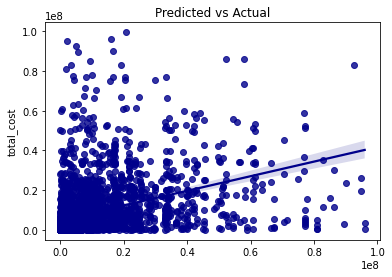

            Actual     Predicted     Residuals     Diff_in_%
2682  1.000000e+05  1.000000e+05  0.000000e+00      0.000000
1440  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
2073  5.690100e+04  5.690100e+04  0.000000e+00      0.000000
851   2.502825e+07  2.502825e+07  0.000000e+00      0.000000
3304  1.000000e+06  1.000000e+06  0.000000e+00      0.000000
1083  1.491750e+06  1.491750e+06  0.000000e+00      0.000000
346   6.630000e+05  6.630000e+05  0.000000e+00      0.000000
3399  3.315000e+05  3.315000e+05  0.000000e+00      0.000000
3048  1.000000e+05  1.000000e+05  0.000000e+00      0.000000
1167  3.315000e+06  3.315000e+06  0.000000e+00      0.000000
1334  2.000000e+05  2.000000e+05  0.000000e+00      0.000000
1301  5.304000e+06  5.304000e+06  0.000000e+00      0.000000
1744  3.315000e+05  3.315000e+05  0.000000e+00      0.000000
2354  1.657500e+06  1.657500e+06  0.000000e+00      0.000000
3410  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
2012  5.304000e+06  5.30

In [256]:
tree_3 = DecisionTreeRegressor()

dec_tree_3, metrics_table_3 = regression_model_3(tree_3)

In [257]:
metrics_table_3.index = ['Decision_Tree_3']
metrics_table_3

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Decision_Tree_3,7.578174e+06,1.983446e+14,1.434097e+07,-0.352201,-0.36043


# XGBOOST

Train_Mean_absolute_error --- 5977627.907169727
Train_Mean_squared_error --- 119561271482694.97
Train_Root_mean_squared_error --- 10907788.56663941
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.2521426958188677
Train_Adjusted_r2 --- 0.24759184001249168




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

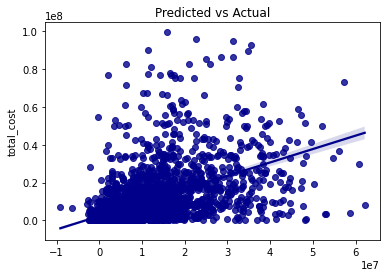

            Actual     Predicted     Residuals     Diff_in_%
572   1.491750e+06  1.491716e+06  3.400000e+01      0.002279
2712  5.138250e+06  5.135734e+06  2.516000e+03      0.048966
1424  1.624350e+07  1.623483e+07  8.671000e+03      0.053381
767   8.287500e+05  8.297812e+05 -1.031250e+03      0.124434
1364  9.417720e+06  9.401157e+06  1.656250e+04      0.175865
3330  1.408875e+07  1.412430e+07 -3.554600e+04      0.252301
1573  4.143750e+06  4.132993e+06  1.075700e+04      0.259596
2776  5.121675e+06  5.137109e+06 -1.543400e+04      0.301347
3369  8.121750e+06  8.146385e+06 -2.463500e+04      0.303321
527   6.961500e+06  6.937710e+06  2.378950e+04      0.341730
3307  1.582912e+07  1.577247e+07  5.665700e+04      0.357929
536   3.978000e+06  3.962437e+06  1.556300e+04      0.391227
3350  1.502296e+07  1.495846e+07  6.450160e+04      0.429353
1856  1.657500e+06  1.665152e+06 -7.652500e+03      0.461689
496   1.491750e+06  1.484796e+06  6.954000e+03      0.466164
1552  1.361598e+06  1.36

In [258]:
import xgboost as xgb
xgb_3 = xgb.XGBRegressor()

xgbr_3, metrics_table_3e = regression_model_3(xgb_3)

In [259]:
metrics_table_3e.index = ['Xgboost_3']
metrics_table_3e

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Xgboost_3,5.977628e+06,1.195613e+14,1.090779e+07,0.252143,0.247592


In [260]:
# RIDGE

Train_Mean_absolute_error --- 5832206.750378977
Train_Mean_squared_error --- 105595821833756.34
Train_Root_mean_squared_error --- 10253834.38969925
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.3404029685561465
Train_Adjusted_r2 --- 0.3363891935169344




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

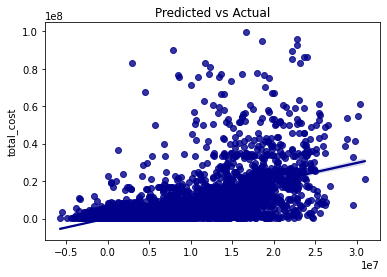

            Actual     Predicted     Residuals     Diff_in_%
1956  2.105025e+07  2.105186e+07 -1.607969e+03      0.007639
2376  2.486250e+06  2.487060e+06 -8.098220e+02      0.032572
3304  1.000000e+06  1.000351e+06 -3.512125e+02      0.035121
3337  1.588531e+07  1.587969e+07  5.623658e+03      0.035402
2242  2.005575e+06  2.006826e+06 -1.251012e+03      0.062377
644   1.947562e+07  1.949387e+07 -1.824271e+04      0.093669
2060  1.679304e+07  1.677534e+07  1.770547e+04      0.105433
2622  1.740375e+07  1.743000e+07 -2.624525e+04      0.150802
2313  3.734348e+06  3.740708e+06 -6.360372e+03      0.170321
2218  8.370375e+06  8.387251e+06 -1.687585e+04      0.201614
673   4.972500e+05  4.984987e+05 -1.248693e+03      0.251120
2194  1.361598e+07  1.365018e+07 -3.420150e+04      0.251186
1584  1.790100e+07  1.795818e+07 -5.718401e+04      0.319446
2361  6.630000e+06  6.651433e+06 -2.143273e+04      0.323269
5     8.287500e+05  8.256748e+05  3.075241e+03      0.371070
2336  8.287500e+05  8.25

In [261]:
rid_3 = Ridge()
ridr_3, metrics_table_3a = regression_model_3(rid_3)

In [262]:
metrics_table_3a.index = ['Ridge_3']
metrics_table_3a

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Ridge_3,5.832207e+06,1.055958e+14,1.025383e+07,0.340403,0.336389


# KNN

Train_Mean_absolute_error --- 5823842.559184625
Train_Mean_squared_error --- 115471926208617.34
Train_Root_mean_squared_error --- 10705297.272950286
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.2810961588952563
Train_Adjusted_r2 --- 0.27672149049096784




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

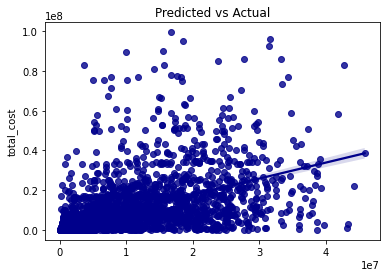

            Actual     Predicted     Residuals     Diff_in_%
182   4.574700e+06  4.574700e+06  0.000000e+00      0.000000
2205  5.068350e+06  5.069400e+06 -1.049600e+03      0.020709
1668  5.138250e+06  5.130976e+06  7.274300e+03      0.141572
3460  5.469750e+06  5.458560e+06  1.119000e+04      0.204580
2449  1.823250e+07  1.818876e+07  4.374500e+04      0.239929
2494  1.102238e+07  1.105242e+07 -3.004750e+04      0.272605
3149  1.558050e+06  1.553600e+06  4.450000e+03      0.285613
1130  2.817750e+07  2.826038e+07 -8.287500e+04      0.294118
3411  1.989000e+06  1.995302e+06 -6.301520e+03      0.316819
2239  8.287500e+05  8.318750e+05 -3.125000e+03      0.377074
2804  3.129555e+07  3.141994e+07 -1.243875e+05      0.397461
2277  6.630000e+06  6.664808e+06 -3.480750e+04      0.525000
1321  1.657500e+06  1.666303e+06 -8.803000e+03      0.531101
2586  2.701725e+07  2.716311e+07 -1.458600e+05      0.539877
2180  6.807990e+06  6.764863e+06  4.312676e+04      0.633473
886   2.552550e+07  2.56

In [263]:
knn_3 = KNeighborsRegressor()

knnr_3, metrics_table_3b = regression_model_3(knn_3)

In [264]:
metrics_table_3b.index = ['KNN_3']
metrics_table_3b

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
KNN_3,5.823843e+06,1.154719e+14,1.070530e+07,0.281096,0.276721


# RANDOM FOREST

Train_Mean_absolute_error --- 5634275.783283683
Train_Mean_squared_error --- 110533758685161.78
Train_Root_mean_squared_error --- 10498403.378423674
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.3075541253047589
Train_Adjusted_r2 --- 0.30334045872446336




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

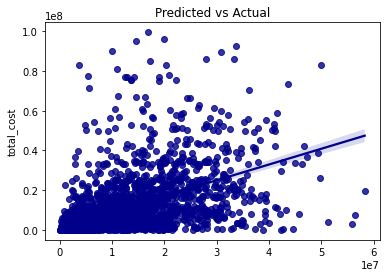

            Actual     Predicted     Residuals     Diff_in_%
1639  2.320500e+07  2.320852e+07 -3.523076e+03      0.015182
1556  3.315000e+06  3.316353e+06 -1.352765e+03      0.040807
3335  1.060800e+06  1.061521e+06 -7.208750e+02      0.067956
1003  3.403995e+06  3.400023e+06  3.972021e+03      0.116687
248   4.143750e+06  4.148633e+06 -4.882965e+03      0.117839
1647  5.038800e+06  5.047624e+06 -8.824228e+03      0.175126
3104  4.538660e+06  4.530711e+06  7.948520e+03      0.175129
2194  1.361598e+07  1.359027e+07  2.570778e+04      0.188806
2976  6.712875e+06  6.728294e+06 -1.541876e+04      0.229689
2152  2.983500e+07  2.990411e+07 -6.910541e+04      0.231625
958   4.992390e+06  4.980542e+06  1.184836e+04      0.237328
2464  7.649362e+06  7.629809e+06  1.955324e+04      0.255619
2013  2.593988e+06  2.601346e+06 -7.358165e+03      0.283662
1652  8.287500e+05  8.311373e+05 -2.387275e+03      0.288057
3013  7.293000e+06  7.315767e+06 -2.276657e+04      0.312170
3387  2.047012e+07  2.05

In [265]:
rf_3 = RandomForestRegressor()

rfr_3, metrics_table_3c = regression_model_3(rf_3)

In [266]:
metrics_table_3c.index = ['Random_Forest_3']
metrics_table_3c

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Random_Forest_3,5.634276e+06,1.105338e+14,1.049840e+07,0.307554,0.30334


# EXTRA TREES

Train_Mean_absolute_error --- 5852129.060887058
Train_Mean_squared_error --- 122075532421441.28
Train_Root_mean_squared_error --- 10995054.576824404
Standard deviation of dependent variable --- 12635716.96621537
Train_R2_score --- 0.24445277948658695
Train_Adjusted_r2 --- 0.23985512905749917




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

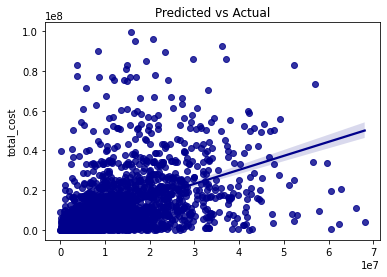

            Actual     Predicted     Residuals     Diff_in_%
3226  1.500000e+05  1.500000e+05  0.000000e+00      0.000000
311   1.500000e+05  1.500000e+05  0.000000e+00      0.000000
1440  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
2012  5.304000e+06  5.304000e+06  0.000000e+00      0.000000
1301  5.304000e+06  5.304000e+06  0.000000e+00      0.000000
3410  2.229338e+07  2.229338e+07  0.000000e+00      0.000000
547   6.630000e+05  6.629354e+05  6.458832e+01      0.009742
1833  1.200000e+06  1.200253e+06 -2.528550e+02      0.021071
3103  1.226550e+07  1.225947e+07  6.030130e+03      0.049163
3196  4.823325e+06  4.820382e+06  2.943100e+03      0.061018
3123  1.309168e+07  1.307919e+07  1.249018e+04      0.095405
1738  2.320500e+06  2.316955e+06  3.544605e+03      0.152752
3121  7.740525e+06  7.728094e+06  1.243125e+04      0.160600
1447  2.486250e+06  2.490288e+06 -4.037680e+03      0.162400
881   1.044225e+07  1.045978e+07 -1.753130e+04      0.167888
1938  2.320500e+06  2.31

In [267]:
ext_3 = ExtraTreesRegressor()

extr_3, metrics_table_3d = regression_model_3(ext_3)

In [268]:
metrics_table_3d.index = ['Extra_Trees_3']
metrics_table_3d

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Extra_Trees_3,5.852129e+06,1.220755e+14,1.099505e+07,0.244453,0.239855


# EXPERIMENT 4: FEATURE ENGINEERING
- Encoding : One Hot Encoding
- Outliers: Winsorization
- Null values: Decision Tree imputation
- Linearity/Transformation/Scaling: Log Transformation of independent and dependent variable
- Feature selection method: Lasso

In [269]:
train_4 = train.copy()

In [270]:
xtrain_4 = train_4.drop(['total_cost'], axis=1)
ytrain_4 = train_4['total_cost']

In [271]:
# encoding:one-hot encoding
xtrain_4 = pd.get_dummies(xtrain_4, drop_first=True)

In [272]:
#imputation
imputer_tree = IterativeImputer(estimator = DecisionTreeRegressor(), max_iter =10)
xtrain_4_imptd = imputer_tree.fit_transform(xtrain_4)

xtrain_4 = pd.DataFrame(xtrain_4_imptd, columns = xtrain_4.columns)

In [273]:
# log transformation
# Define the log transformation function
log_transform = FunctionTransformer(np.log1p, validate=True)

# Apply log transformation to X and y
xtrain_4 = pd.DataFrame(log_transform.fit_transform(xtrain_4), columns = xtrain_4.columns)
ytrain_4 = log_transform.fit_transform(ytrain_4.values.reshape(-1, 1))

In [274]:
# 98% winsorization
def winsorize_98(data, column):
    upper_limit = data[column].quantile(0.98)
    lower_limit = data[column].quantile(0.02)
    
    return np.where(data[column]>upper_limit,upper_limit,np.where(data[column]<lower_limit,lower_limit, data[column]))

for i in xtrain_4.select_dtypes('number').columns:
    xtrain_4[i] = winsorize_98(xtrain_4, i)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

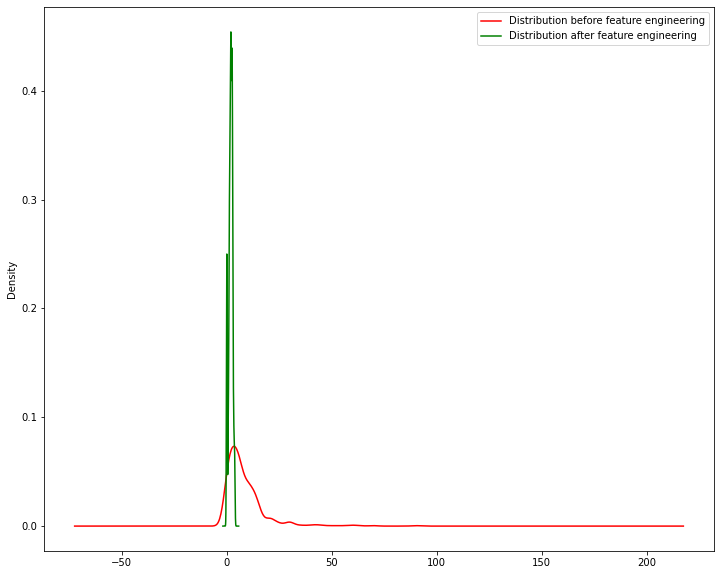

In [275]:
plt.figure(figsize=(12, 10))
train['night_mainland'].plot.kde(color='red', label = 'Distribution before feature engineering')
xtrain_4['night_mainland'].plot.kde(color = 'green', label = ('Distribution after feature engineering'))
plt.legend()

# MODEL BUILDING

In [276]:
def regression_model_4(model):
    kfold = KFold(n_splits=5)
    y_pred = cross_val_predict(model, xtrain_4, ytrain_4, cv=kfold)
    ypred = np.expm1(y_pred)
    ytrain_4_ = np.expm1(ytrain_4)


    kfold = KFold(n_splits=4)
    
    mae =  np.abs(ypred - ytrain_4_).mean()
    mse = mean_squared_error(ytrain_4_, ypred)

    r2 = r2_score(ypred,ytrain_4_ )
    rmse = np.sqrt(mse)

    std = np.std(ytrain_4_)

    n=xtrain_4.shape[0]
    p=xtrain_4.shape[1]

    adjusted_r2 = 1 - (1-r2) *(n-1)/(n-p-1)

    print('Train_Mean_absolute_error','---',mae)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',rmse)
    print('Standard deviation of dependent variable','---',std)

    print('Train_R2_score','---',r2)
    print('Train_Adjusted_r2','---',adjusted_r2)
    print()
    print()
        
    sns.regplot(x = ypred, y = ytrain_4_, color = 'darkblue')
    plt.title('Predicted vs Actual')
    plt.show();
    
    stats = pd.DataFrame(columns = ['Actual', 'Predicted', 'Residuals', 'Diff_in_%'])
    
    stats['Actual'] = pd.Series(ytrain_4_.reshape(-1, 1).flatten())
    stats['Predicted'] = ypred
    stats['Residuals'] =  stats['Actual'] - stats['Predicted']
    stats['Diff_in_%'] = abs((stats['Residuals']/stats['Actual'])*100)
    
    print(stats.sort_values(by='Diff_in_%'))
    
    metrics_table =  pd.DataFrame({'Mean Absolute Error': mae,
                                   'Mean Squared Error':mse,
                                   'Root Mean Squared Error': rmse,
                                   'R2':r2,
                                   'Adjusted R2':adjusted_r2}, index = ['Model'])
    return model, metrics_table    

# DECISION TREE

Train_Mean_absolute_error --- 10825555.640663635
Train_Mean_squared_error --- 191482139166490.62
Train_Root_mean_squared_error --- 13837707.149903506
Standard deviation of dependent variable --- 12635716.9662154
Train_R2_score --- -0.1859968038464157
Train_Adjusted_r2 --- -0.2218934430132804




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

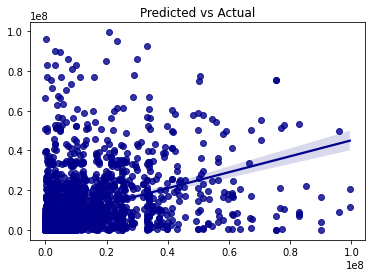

            Actual     Predicted     Residuals     Diff_in_%
2328  4.972500e+06  4.972500e+06  0.000000e+00  0.000000e+00
3410  2.229337e+07  2.229337e+07  0.000000e+00  0.000000e+00
2670  2.269330e+06  2.269330e+06  0.000000e+00  0.000000e+00
2012  5.304000e+06  5.304000e+06  0.000000e+00  0.000000e+00
2635  7.533338e+07  7.533338e+07  0.000000e+00  0.000000e+00
1440  2.229337e+07  2.229337e+07  0.000000e+00  0.000000e+00
533   1.657500e+06  1.657500e+06  0.000000e+00  0.000000e+00
2073  5.690100e+04  5.690100e+04  0.000000e+00  0.000000e+00
2579  1.657500e+06  1.657500e+06  0.000000e+00  0.000000e+00
2085  3.403995e+06  3.403995e+06  0.000000e+00  0.000000e+00
2555  1.027650e+07  1.027650e+07  0.000000e+00  0.000000e+00
2106  6.630000e+05  6.630000e+05  0.000000e+00  0.000000e+00
2116  1.657500e+06  1.657500e+06  0.000000e+00  0.000000e+00
2120  2.496263e+06  2.496263e+06  0.000000e+00  0.000000e+00
2523  3.315000e+06  3.315000e+06  0.000000e+00  0.000000e+00
1520  8.287500e+05  8.28

In [277]:
tree_4 = DecisionTreeRegressor()

dec_tree_4, metrics_table_4 = regression_model_4(tree_4)

In [278]:
metrics_table_4.index = ['Decision_Tree_4']
metrics_table_4

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Decision_Tree_4,1.082556e+07,1.914821e+14,1.383771e+07,-0.185997,-0.221893


# RIDGE

Train_Mean_absolute_error --- 5040947.169298712
Train_Mean_squared_error --- 113484195691362.89
Train_Root_mean_squared_error --- 10652896.117552396
Standard deviation of dependent variable --- 12635716.9662154
Train_R2_score --- -1.9015424616598047
Train_Adjusted_r2 --- -1.9893636281551461




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

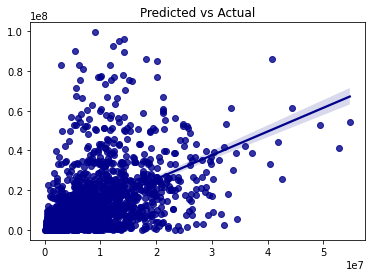

            Actual     Predicted     Residuals     Diff_in_%
3464  7.276000e+05  7.279251e+05 -3.250840e+02      0.044679
3227  7.210125e+05  7.221502e+05 -1.137672e+03      0.157788
2870  8.287500e+05  8.269809e+05  1.769084e+03      0.213464
428   1.674075e+07  1.670447e+07  3.627583e+04      0.216692
3348  8.287500e+06  8.266066e+06  2.143408e+04      0.258631
1110  2.390115e+06  2.383732e+06  6.383179e+03      0.267066
987   2.353650e+06  2.347144e+06  6.505955e+03      0.276420
583   4.009492e+06  4.021576e+06 -1.208396e+04      0.301384
959   1.657500e+07  1.662709e+07 -5.208626e+04      0.314246
3081  5.453175e+07  5.475447e+07 -2.227164e+05      0.408416
142   6.630000e+05  6.658227e+05 -2.822741e+03      0.425753
475   2.900625e+07  2.887020e+07  1.360466e+05      0.469025
828   3.149250e+06  3.132863e+06  1.638748e+04      0.520361
564   2.652000e+07  2.666527e+07 -1.452732e+05      0.547787
2497  8.619000e+06  8.674158e+06 -5.515804e+04      0.639959
424   5.138250e+06  5.10

In [279]:
rid_4 = Ridge()
ridr_4, metrics_table_4a = regression_model_4(rid_4)

In [280]:
metrics_table_4a.index = ['Ridge_4']
metrics_table_4a

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Ridge_4,5.040947e+06,1.134842e+14,1.065290e+07,-1.901542,-1.989364


# XGBOOST

Train_Mean_absolute_error --- 9191276.46693451
Train_Mean_squared_error --- 121077798087748.08
Train_Root_mean_squared_error --- 11003535.708477892
Standard deviation of dependent variable --- 12635716.9662154
Train_R2_score --- -0.8736660106600014
Train_Adjusted_r2 --- -0.9303763765612831




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

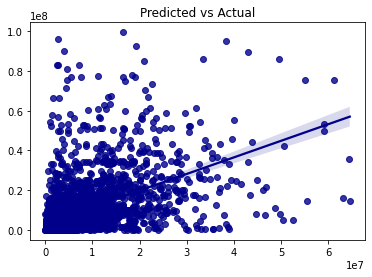

            Actual     Predicted     Residuals     Diff_in_%
3260  2.587036e+06  2.588122e+06 -1.085300e+03      0.041951
3385  4.436000e+05  4.432443e+05  3.556562e+02      0.080175
1202  8.453250e+06  8.446361e+06  6.889000e+03      0.081495
3449  4.972500e+06  4.965620e+06  6.880500e+03      0.138371
212   1.160250e+06  1.162092e+06 -1.842375e+03      0.158791
1390  2.187900e+06  2.192412e+06 -4.512250e+03      0.206237
502   1.277427e+07  1.280108e+07 -2.680050e+04      0.209801
247   2.000000e+05  1.995642e+05  4.357500e+02      0.217875
1401  1.674075e+06  1.670397e+06  3.678375e+03      0.219726
386   1.657500e+05  1.661414e+05 -3.913594e+02      0.236114
1900  5.000000e+05  4.986346e+05  1.365406e+03      0.273081
298   8.287500e+05  8.259372e+05  2.812813e+03      0.339404
2487  8.287500e+05  8.258128e+05  2.937250e+03      0.354419
2002  3.149250e+05  3.136964e+05  1.228563e+03      0.390113
1953  4.972500e+05  4.951729e+05  2.077125e+03      0.417722
2383  4.972500e+06  4.99

In [281]:
import xgboost as xgb
xgb_4 = xgb.XGBRegressor()

xgbr_4, metrics_table_4e = regression_model_4(xgb_4)

In [282]:
metrics_table_4e.index = ['Xgboost_4']
metrics_table_4e

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Xgboost_4,9.191276e+06,1.210778e+14,1.100354e+07,-0.873666,-0.930376


# KNN

Train_Mean_absolute_error --- 5344290.901856159
Train_Mean_squared_error --- 116440316421441.97
Train_Root_mean_squared_error --- 10790751.429879291
Standard deviation of dependent variable --- 12635716.9662154
Train_R2_score --- -1.3164190780328298
Train_Adjusted_r2 --- -1.3865302786142388




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

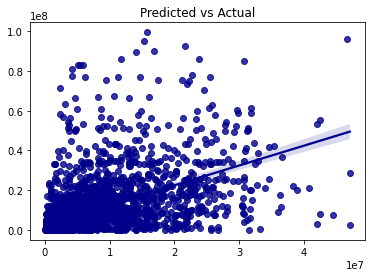

            Actual     Predicted     Residuals     Diff_in_%
1134  1.656611e+07  1.656485e+07  1.258474e+03      0.007597
1263  3.472075e+06  3.467512e+06  4.563050e+03      0.131421
2270  1.939275e+06  1.936314e+06  2.960881e+03      0.152680
1767  2.000000e+06  1.996750e+06  3.249647e+03      0.162482
3352  3.149250e+05  3.154643e+05 -5.393422e+02      0.171261
1154  7.942655e+06  7.927498e+06  1.515710e+04      0.190832
279   6.464250e+06  6.476707e+06 -1.245725e+04      0.192710
3088  6.807990e+06  6.821788e+06 -1.379815e+04      0.202676
1869  8.287500e+05  8.305457e+05 -1.795663e+03      0.216671
2745  6.630000e+05  6.648157e+05 -1.815692e+03      0.273860
1431  9.994725e+05  1.002282e+06 -2.809034e+03      0.281052
2007  1.657500e+06  1.652354e+06  5.146383e+03      0.310491
1641  2.269330e+06  2.276980e+06 -7.650434e+03      0.337123
2536  5.370300e+06  5.389599e+06 -1.929931e+04      0.359371
331   3.978000e+06  3.961364e+06  1.663567e+04      0.418192
513   4.259775e+06  4.27

In [283]:
knn_4 = KNeighborsRegressor()

knnr_4, metrics_table_4b = regression_model_4(knn_4)

In [284]:
metrics_table_4b.index = ['KNN_4']
metrics_table_4b

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
KNN_4,5.344291e+06,1.164403e+14,1.079075e+07,-1.316419,-1.38653


# RANDOM FOREST

Train_Mean_absolute_error --- 8637890.088342914
Train_Mean_squared_error --- 116754777887188.55
Train_Root_mean_squared_error --- 10805312.484476723
Standard deviation of dependent variable --- 12635716.9662154
Train_R2_score --- -1.9377691512343342
Train_Adjusted_r2 --- -2.026686793200477




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

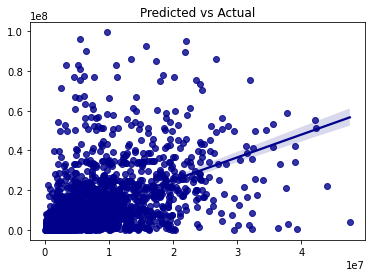

            Actual     Predicted     Residuals     Diff_in_%
1020  4.000000e+05  3.998890e+05  1.110496e+02      0.027762
560   1.823250e+07  1.824058e+07 -8.080859e+03      0.044321
2427  2.269330e+06  2.268052e+06  1.278271e+03      0.056328
2577  1.135387e+07  1.134376e+07  1.011228e+04      0.089065
351   1.989000e+06  1.991675e+06 -2.675341e+03      0.134507
3034  1.657500e+06  1.660568e+06 -3.068174e+03      0.185109
572   1.491750e+06  1.488460e+06  3.290234e+03      0.220562
2847  6.807990e+06  6.824042e+06 -1.605172e+04      0.235778
2909  2.486250e+07  2.492692e+07 -6.441564e+04      0.259088
2880  1.657500e+06  1.652091e+06  5.409468e+03      0.326363
333   1.160250e+06  1.156236e+06  4.014464e+03      0.346000
2940  3.315000e+06  3.326802e+06 -1.180191e+04      0.356015
2464  7.649363e+06  7.621269e+06  2.809336e+04      0.367264
884   5.673325e+06  5.694885e+06 -2.156039e+04      0.380031
1632  1.125442e+07  1.121002e+07  4.440367e+04      0.394544
2991  7.790250e+06  7.82

In [285]:
rf_4 = RandomForestRegressor()

rfr_4, metrics_table_4c = regression_model_4(rf_4)

In [286]:
metrics_table_4c.index = ['Random_Forest_4']
metrics_table_4c

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Random_Forest_4,8.637890e+06,1.167548e+14,1.080531e+07,-1.937769,-2.026687


# EXTRA TREES

Train_Mean_absolute_error --- 9185746.542687938
Train_Mean_squared_error --- 130410040660385.3
Train_Root_mean_squared_error --- 11419721.56667514
Standard deviation of dependent variable --- 12635716.9662154
Train_R2_score --- -1.0017754435113524
Train_Adjusted_r2 --- -1.0623633055998267




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

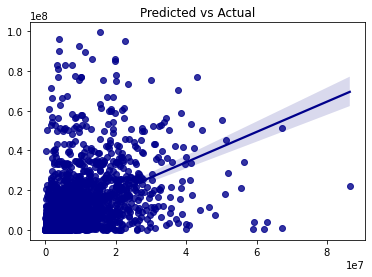

            Actual     Predicted     Residuals     Diff_in_%
3226  1.500000e+05  1.500000e+05 -7.858034e-10  5.238689e-13
311   1.500000e+05  1.500000e+05 -7.858034e-10  5.238689e-13
2073  5.690100e+04  5.690100e+04  9.167707e-10  1.611168e-12
1440  2.229337e+07  2.229338e+07 -3.948808e-07  1.771292e-12
3410  2.229337e+07  2.229338e+07 -3.948808e-07  1.771292e-12
2139  3.149250e+05  3.149250e+05  7.275958e-09  2.310378e-12
2331  3.149250e+05  3.149250e+05  7.275958e-09  2.310378e-12
2012  5.304000e+06  5.304000e+06  1.695007e-07  3.195715e-12
1301  5.304000e+06  5.304000e+06  1.695007e-07  3.195715e-12
2395  1.340000e+05  1.341152e+05 -1.151653e+02  8.594427e-02
2895  1.454900e+06  1.456715e+06 -1.814959e+03  1.247480e-01
3121  7.740525e+06  7.727658e+06  1.286714e+04  1.662308e-01
958   4.992390e+06  4.983228e+06  9.162249e+03  1.835243e-01
2157  3.315000e+06  3.321615e+06 -6.614748e+03  1.995399e-01
3100  8.373828e+06  8.393151e+06 -1.932315e+04  2.307565e-01
471   5.801250e+06  5.78

In [287]:
ext_4 = ExtraTreesRegressor()

extr_4, metrics_table_4d = regression_model_4(ext_4)

In [288]:
metrics_table_4d.index = ['Extra_Trees_4']
metrics_table_4d

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Extra_Trees_4,9.185747e+06,1.304100e+14,1.141972e+07,-1.001775,-1.062363


# EXPERIMENT 5: ENSEMBLE MODEL
- Encoding : Label Encoding
- Outliers: Winsorization
- Null values: KNN imputation
- Linearity/Transformation/Scaling: Yeo-johnson  Transformation
- Feature selection method: None

In [289]:
train_5 = train.copy()
xtrain_5 = train_5.drop(['total_cost'], axis=1)
ytrain_5 = train_5['total_cost']

In [290]:
for i in xtrain_5.select_dtypes('O').columns:
    le = LabelEncoder()
    xtrain_5[i] = le.fit_transform(xtrain_5[i]) 
    

In [291]:
imputer_knn = IterativeImputer(estimator = KNeighborsRegressor(), max_iter = 10)
xtrain_5_imptd = imputer_knn.fit_transform(xtrain_5)
xtrain_5 = pd.DataFrame(xtrain_5_imptd, columns =xtrain_5.columns)

In [292]:
#transformation: box-cox
power = PowerTransformer(method = 'yeo-johnson')

xtrain_5 = pd.DataFrame(power.fit_transform(xtrain_5), columns = xtrain_5.columns)

In [293]:
# winsorize at 98%
# 98% winsorization
def winsorize_98(data, column):
    upper_limit = data[column].quantile(0.98)
    lower_limit = data[column].quantile(0.02)
    
    return np.where(data[column]>upper_limit,upper_limit,np.where(data[column]<lower_limit,lower_limit, data[column]))

for i in xtrain_5.select_dtypes('number').columns:
    xtrain_5[i] = winsorize_98(xtrain_5, i)

# MODEL BUILDING

In [294]:
def regression_model_5(model):
    
    model.fit(xtrain_5,ytrain_5)
    
    train_pred=model.predict(xtrain_5)
     
    r2score=r2_score(ytrain_5,train_pred)
    
    mae=mean_absolute_error(train_pred,ytrain_5)
    
    mse=mean_squared_error(ytrain_5,train_pred)
    
     #to evaluate whether the RMSE is high or low, we can compare it with the standard deviation of the dependent variable. 
    # A RMSE value lower than the standard deviation indicates good model performance
    
    std=np.std(ytrain_5)
    
    root_mean_squared_error=np.sqrt(mse)
    
    normalised_rmse=root_mean_squared_error/(ytrain_5.max()- ytrain_5.min())
    
    
    n=xtrain_5.shape[0]
    p=xtrain_5.shape[1]
    adjusted_r2 = 1 - (1-r2score) *(n-1)/(n-p-1)
    
    
    
    
   
    print('Train_Mean_absolute_error','---',mae)
    print('Train_R2_score','---',r2score)
    print('Train_Mean_squared_error','---',mse)
    print('Train_Root_mean_squared_error','---',root_mean_squared_error)
    print('Standard deviation of dependent variable','---',std)

    print('Train_Adjusted_r2','---',adjusted_r2)
    print('Train_Normalised_rmse','---',normalised_rmse)
    print()
    print()
    
    
    sns.regplot(x=train_pred,y=ytrain_5)
    plt.title('Predicted vs Actual ')
    plt.xlabel('Predicted')
    plt.ylabel('Actual values')
    plt.show();
    
    stat=pd.DataFrame(ytrain_5)
    
    stat['Predicted']=train_pred
    
    stat['Residuals']=stat.iloc[:,0] - stat['Predicted']

    stat['Diff_in_%']=abs((stat['Residuals']/stat.iloc[:,0])*100)



    #to view all data
    pd.options.display.max_rows=1000
    stat= stat.sort_values(by='Diff_in_%')
    print(stat)
    metrics_table_5= pd.DataFrame({'Mean Absolute Error': mae,
                                   'Mean Squared Error':mse,
                                   'Root Mean Squared Error': rmse,
                                   'R2':r2score,
                                   'Adjusted R2':adjusted_r2}, index = ['Model'])



    
    return model,metrics_table_5

def regression_weights(model):
    model.fit(xtrain_5,ytrain_5)
    
    coefficients=model.coef_
    
    intercept=model.intercept_
    
    return coefficients,intercept


In [295]:
# ENSEMBLE
from sklearn.ensemble import VotingRegressor

ensemble = VotingRegressor([('rf', RandomForestRegressor()),
                           ('knn', KNeighborsRegressor()),
                           ('ridge',Ridge()),
                           ('adaboost',AdaBoostRegressor()),
                           ('svr', SVR())])

Train_Mean_absolute_error --- 4773882.656694919
Train_R2_score --- 0.5624056433689926
Train_Mean_squared_error --- 69866902778459.086
Train_Root_mean_squared_error --- 8358642.400441539
Standard deviation of dependent variable --- 12635716.96621537
Train_Adjusted_r2 --- 0.5597427973854368
Train_Normalised_rmse --- 0.08409012384625444




<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

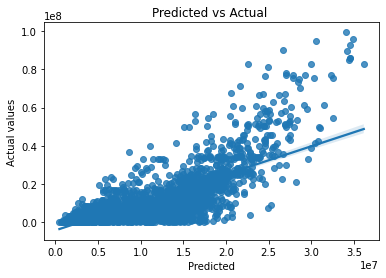

      total_cost     Predicted     Residuals     Diff_in_%
2086  14088750.0  1.408275e+07  6.002562e+03      0.042605
3429  14069846.0  1.406290e+07  6.946385e+03      0.049371
1592   1657500.0  1.658451e+06 -9.510445e+02      0.057378
2533  12431250.0  1.241979e+07  1.146426e+04      0.092221
1035   1657500.0  1.659618e+06 -2.117774e+03      0.127769
...          ...           ...           ...           ...
3344     80000.0  1.507425e+07 -1.499425e+07  18742.813353
3097     74000.0  1.556186e+07 -1.548786e+07  20929.541819
2547     53300.0  1.126959e+07 -1.121629e+07  21043.693576
2898     70000.0  1.739054e+07 -1.732054e+07  24743.632856
1023     64000.0  1.687449e+07 -1.681049e+07  26266.398131

[3473 rows x 4 columns]


In [296]:
ensemble_model, metrics_table_5 = regression_model_5(ensemble)

In [297]:
metrics_table_5.index = ['Ensemble_Model']
metrics_table_5

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Ensemble_Model,4.773883e+06,6.986690e+13,1.263572e+07,0.562406,0.559743


# EXPERIMENT 6: KMEANS FOR PREPROCESSING

The KMeans algorithm is a popular unsupervised machine learning algorithm used for clustering. Clustering is the process of dividing a set of data points into groups or clusters based on some similarity or distance measure. In the context of data preprocessing, clustering is often used to reduce the dimensionality of a dataset by grouping similar data points together.

For example, a Pipeline object can be created using the Pipeline class from the sklearn library. This pipeline will consist of two steps: KMeans and a classifcation model.

The KMeans step takes a parameter n_clusters=50, which specifies that the algorithm should group the data into 50 clusters. The KMeans algorithm works by randomly assigning each data point to one of the 50 clusters, and then iteratively updating the cluster centroids to minimize the sum of squared distances between the data points and their assigned clusters. This process continues until convergence is reached, at which point the algorithm outputs the 50 final cluster centroids.

The output of the KMeans step is then passed to the model step in the pipeline. In this case, it takes the cluster assignments as input and attempts to predict a binary target variable based on the cluster assignments.

Overall, this pipeline is using the KMeans algorithm as a preprocessing step to reduce the dimensionality of the data by grouping similar data points together, and then passing the resulting cluster assignments to a model for classification.

## FEATURE ENGINEERING
- Encoding : Label Encoding
- Null values: KNN imputation
- Linearity/Transformation/Scaling: Yeo-johnson Transformation
- Feature selection method: None

In [298]:
train_6 = train.copy()

train_6 = train.copy()
xtrain_6 = train_6.drop(['total_cost'], axis=1)
ytrain_6 = train_6['total_cost']

In [299]:
# label encoding
for i in xtrain_6.select_dtypes('O').columns:
    le = LabelEncoder()
    xtrain_6[i] = le.fit_transform(xtrain_6[i])

In [300]:
#knn imputation
imputer_knn = IterativeImputer(estimator = KNeighborsRegressor(), max_iter = 10)
imptd = imputer_knn.fit_transform(xtrain_6)

xtrain_6 = pd.DataFrame(imptd, columns = xtrain_6.columns)

In [301]:
#yeo-johnson transformation
power = PowerTransformer()
impted  =power.fit_transform(xtrain_6)
xtrain_6 = pd.DataFrame(impted, columns = xtrain_6.columns)

# MODEL BUILDING

In [302]:
models = []

models.append(('KNN',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('knn', KNeighborsRegressor())])))
models.append(('Random Forest',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('rf', RandomForestRegressor())])))
models.append(('Ridge',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('rid', Ridge())])))
models.append(('Adaboost',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('ada', AdaBoostRegressor())])))
models.append(('SVM',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('svr', SVR())])))
models.append(('Gradient boosting',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('gbr', GradientBoostingRegressor())])))
models.append(('Extra Trees',  Pipeline([('kmeans',KMeans(n_clusters = 40)),('ext', ExtraTreesRegressor())])))

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [303]:
r2 = []
mae = []
mse = []
rmse = []
names = []
adjusted_r2 = []

for name, model in models:
    names.append(name)
    
    r2_scores  =  cross_val_score(model, xtrain_6, ytrain_6, cv= 6, scoring = 'r2').mean()
    mae_scores = -cross_val_score(model, xtrain_6, ytrain_6, cv= 6, scoring = 'neg_mean_absolute_error').mean()
    mse_scores = -cross_val_score(model, xtrain_6, ytrain_6, cv= 6, scoring = 'neg_mean_squared_error').mean()
    rmse_scores = np.sqrt(mse_scores)
        
    n=xtrain_6.shape[0]
    p=xtrain_6.shape[1]
    adjusted_r2_scores = 1 - (1-r2_scores) *(n-1)/(n-p-1)
    
    r2.append(r2_scores)
    mae.append(mae_scores)
    mse.append(mse_scores)
    rmse.append(rmse_scores)
    adjusted_r2.append(adjusted_r2_scores)

metrics_table_6 =pd.DataFrame({'Mean Absolute Error': mae,
                             'Mean Squared Error':mse,
                             'Root Mean Squared Error': rmse,
                             'R2':r2,
                             'Adjusted R2':adjusted_r2}, index = names)

In [304]:
metrics_table_6

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
KNN,5.977658e+06,1.218072e+14,1.103663e+07,0.241754,0.237140
Random Forest,5.689627e+06,1.112531e+14,1.054766e+07,0.305101,0.300872
Ridge,5.526141e+06,1.039863e+14,1.019737e+07,0.350830,0.346880
Adaboost,1.261445e+07,1.758460e+14,1.326069e+07,-0.253617,-0.261246
SVM,7.158243e+06,1.837224e+14,1.355442e+07,-0.151906,-0.158916
Gradient boosting,5.647290e+06,1.079491e+14,1.038985e+07,0.306358,0.302137
Extra Trees,5.735341e+06,1.116967e+14,1.056867e+07,0.292700,0.288396


# RESULT

In [305]:
result = pd.concat([baseline_model,metrics_table_0, metrics_table_0a,metrics_table_0b,metrics_table_0c,metrics_table_0d,
                    metrics_table_0e,metrics_table_1,metrics_table_1a,metrics_table_1b,metrics_table_1c,metrics_table_1d,
                    metrics_table_1e,metrics_table_2,metrics_table_2a,metrics_table_2e,metrics_table_2b,metrics_table_2c,
                    metrics_table_2d,metrics_table_3,metrics_table_3e,metrics_table_3a,metrics_table_3b,metrics_table_3c,
                    metrics_table_3d,metrics_table_4,metrics_table_4a,metrics_table_4e,metrics_table_4b,metrics_table_4c,
                    metrics_table_4d,metrics_table_5,metrics_table_6], axis=0)

In [306]:
result

,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error,R2,Adjusted R2
Baseline model,8.244835e+06,1.596613e+14,1.263572e+07,0.000000,0.000000
Decision_Tree_0,4.363613e+06,4.212045e+13,6.475439e+06,-0.202511,-0.235649
Ridge_0,3.346425e+06,2.152644e+13,4.636060e+06,0.394695,0.378014
KNN_0,3.416525e+06,2.451361e+13,4.947772e+06,0.311149,0.292166
Random_Forest_0,3.272127e+06,2.215189e+13,4.712725e+06,0.379776,0.362684
Extra_Trees_0,3.620659e+06,2.835761e+13,5.321188e+06,0.194896,0.172709
Xgboost_0,3.500326e+06,2.551290e+13,5.043751e+06,0.284545,0.264829
Decision_Tree_1,7.459436e+06,2.075795e+14,1.448329e+07,-0.345890,-0.350558
Ridge_1,5.984134e+06,1.059271e+14,1.027160e+07,0.338143,0.335848
KNN_1,5.555139e+06,1.128543e+14,1.059322e+07,0.296308,0.293868


<IPython.core.display.Javascript object>

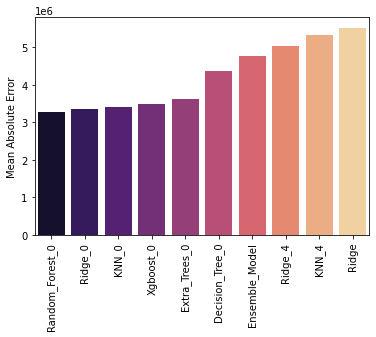

In [307]:
mae_result = result.sort_values(by = 'Mean Absolute Error', ascending=True).head(10)
sns.barplot(y = 'Mean Absolute Error', x =mae_result.index,data=mae_result, palette = 'magma')
plt.xticks(rotation=90);

<IPython.core.display.Javascript object>

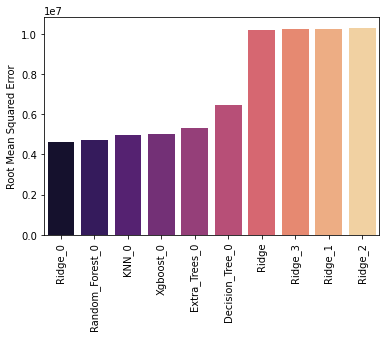

In [308]:
mse_result = result.sort_values(by = 'Root Mean Squared Error').head(10)
sns.barplot(y = 'Root Mean Squared Error', x = mse_result.index, data=mse_result, palette = 'magma')
plt.xticks(rotation=90);

<IPython.core.display.Javascript object>

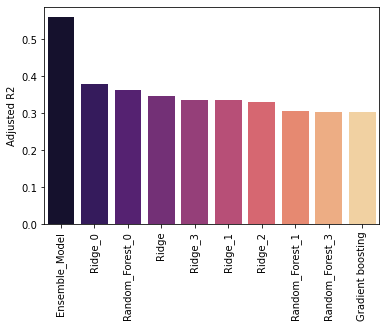

In [309]:
r2_result = result.sort_values(by = 'Adjusted R2', ascending=False).head(10)
sns.barplot(y = 'Adjusted R2', x = r2_result.index, data=r2_result, palette = 'magma')
plt.xticks(rotation=90);

# HYPERPARAMETER TUNING OF BEST PERFORMING MODELS

In [310]:
validation_0 = validation.copy()

In [311]:
#outliers
# IQR
Q1 = validation_0['total_cost'].quantile(0.25)
Q3 = validation_0['total_cost'].quantile(0.75)

IQR = Q3 - Q1

upper_limit = Q3 + 1.5*IQR
lower_limit = Q1 - 1.5*IQR

outliers = np.where(validation_0['total_cost']>upper_limit, True, np.where(validation_0['total_cost']<lower_limit, True, False))
print('Number of outliers:', len(validation_0.loc[outliers]))

validation_0 = validation_0.loc[~outliers]

#null values: drop
validation_0 = validation_0.dropna()


Number of outliers: 59


In [312]:
x_validation = validation_0.drop(['total_cost'], axis=1)
y_validation = validation_0['total_cost']

In [313]:
# Standard scaling on numerical features
scaler = StandardScaler()
numerical_features = x_validation.select_dtypes('number').columns
x_validation[numerical_features] = scaler.fit_transform(x_validation[numerical_features])



# One-hot encoding on categorical features
categorical_features = x_validation.select_dtypes('O').columns
#encoding & cardinality
cardinality = x_validation['country'].value_counts(normalize=True)
keep_values = cardinality[cardinality>=0.04].index.tolist()


# Replace the values that are not in the keep_values list with "others"
x_validation.loc[~x_validation['country'].isin(keep_values), 'country'] = "Others"

x_validation = pd.get_dummies(x_validation,columns =categorical_features, drop_first=True)#drop first value to reduce multicollinearity

In [314]:
ridge = Ridge()

In [315]:
params = {'alpha': [i/10.0 for i in range(1, 701)]}

In [316]:
cv = KFold(n_splits=4)

grid = GridSearchCV(ridge, param_grid=params, cv = cv, scoring = 'neg_mean_absolute_error').fit(x_validation, y_validation)
grid.best_estimator_

Ridge(alpha=37.5)

In [317]:
grid.best_params_

{'alpha': 37.5}

In [318]:
grid.best_score_

-3538052.542061534

In [319]:
forest = RandomForestRegressor()

In [320]:
params = {'n_estimators':[100,200,300,400,500,600,700,800],
         'max_depth':[2, 4,6,8,10,12],
         'min_samples_split':[2,4,5],
         'min_samples_leaf':[1,2,3,4,5],
         'ccp_alpha': [0.1, 0.2, 0.3, 0.4]}


In [321]:
cv = KFold(n_splits=4)

grid_2 = GridSearchCV(forest, param_grid=params, cv = cv, scoring = 'neg_mean_absolute_error').fit(x_validation, y_validation)
grid_2.best_estimator_

RandomForestRegressor(ccp_alpha=0.3, max_depth=12, min_samples_split=5)

In [322]:
grid_2.best_params_

{'ccp_alpha': 0.3,
 'max_depth': 12,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 100}

In [323]:
grid_2.best_score_

-3495051.814506962

# TESTING

In [324]:
test_2 = test.copy()

test_2 = test_2.drop(['ID'], axis=1)
test_2  =test_2.reset_index(drop=True)

In [325]:
#outliers
# IQR
Q1 = train['total_cost'].quantile(0.25)
Q3 = train['total_cost'].quantile(0.75)

IQR = Q3 - Q1

upper_limit = Q3 + 1.5*IQR
lower_limit = Q1 - 1.5*IQR

outliers = np.where(train['total_cost']>upper_limit, True, np.where(train['total_cost']<lower_limit, True, False))
print('Number of outliers:', len(train.loc[outliers]))

train = train.loc[~outliers]
outliers = np.where(test_2['total_cost']>upper_limit, True, np.where(test_2['total_cost']<lower_limit, True, False))

test_2 = test_2.loc[~outliers]


#null values: drop
train = train.dropna()
test_2 = test_2.dropna()

xtrain = train.drop(['total_cost'], axis=1)
ytrain = train['total_cost']
xtest = test_2.drop(['total_cost'], axis=1)
ytest = test_2['total_cost']

# Standard scaling on numerical features
scaler = StandardScaler()
numerical_features = xtrain.select_dtypes('number').columns
xtrain[numerical_features] = scaler.fit_transform(xtrain[numerical_features])
xtest[numerical_features] = scaler.transform(xtest[numerical_features])



# One-hot encoding on categorical features
categorical_features = xtrain.select_dtypes('O').columns
#encoding & cardinality
cardinality = xtrain['country'].value_counts(normalize=True)
keep_values = cardinality[cardinality>=0.04].index.tolist()

# Replace the values that are not in the keep_values list with "others"
xtrain.loc[~xtrain['country'].isin(keep_values), 'country'] = "Others"
xtest.loc[~xtest['country'].isin(keep_values), 'country'] = "Others"

#xtrain = pd.get_dummies(xtrain,columns =categorical_features, drop_first=True)#drop first value to reduce multicollinearity
# Combine the train and test sets to ensure consistent encoding of categorical features
combined = pd.concat([xtrain, xtest], axis=0)

combined = pd.get_dummies(combined, columns=categorical_features, drop_first=True)

# Split the combined dataset back into train and test sets
xtrain = combined.iloc[:xtrain.shape[0], :]
xtest = combined.iloc[xtrain.shape[0]:, :]

Number of outliers: 309


In [328]:
final_model = grid.best_estimator_
final_model.fit(xtrain, ytrain)
ypred = final_model.predict(xtest)
train_pred  = final_model.predict(xtrain)

print('Training R2:', r2_score(ytrain, train_pred))
print('Test R2:',  r2_score(ytest, ypred))
print()

print('Training MAE:', mean_absolute_error(train_pred, ytrain))
print('Test MAE:',  mean_absolute_error(ypred, ytest))
print()

print('Train RMSE :', np.sqrt(mean_absolute_error(train_pred, ytrain)))
print('Test RMSE :', np.sqrt(mean_absolute_error(ypred, ytest)))

Training R2: 0.43030423295227027
Test R2: 0.39660925334606856

Training MAE: 3238968.8132992303
Test MAE: 3255533.8348358124

Train RMSE : 1799.7135364549633
Test RMSE : 1804.309794585124
